## Import

In [1]:
from sklearn.linear_model import LinearRegression
from sklearn.tree import DecisionTreeRegressor
from sklearn.neighbors import KNeighborsRegressor
from sklearn.ensemble import RandomForestRegressor
from xgboost import XGBRegressor
from sklearn.neural_network import MLPRegressor

In [2]:
from ML.utils.utils import *
from ML.utils.Data_preparator import Data_preparator
from ML.utils.Model_evaluator import Model_evaluator
from physics.Iso_data_handler import Iso_data_handler
from physics.Data_visualiser import Data_visualiser

In [3]:
pre_path = "../../../../../../../"
physical_model = "MIST"
path_to_data = pre_path + "data/MIST_v1.2_vvcrit0.0_basic_isos/"
path_to_results = pre_path + "results/model_B/default_models/"
path_to_predictions = pre_path + "predictions/model_B/default_models/"
tag = "mass_smaller_3"
output_parameters = ['T_eff', 'log_g', 'radius']
categories_name = ["phase"]

In [4]:
override = True
use_preds = False
save = True
show = True

## Data preparation

This notebook contains the results of the model which are trained using all the data from MIST and filtered on the phases

Reading MIST dataframe from MIST_reclassified_iso_full_data.csv file...


,log10_isochrone_age_yr,log_Teff,log_g,phase,metallicity,star_mass,log_R
0,5.0,3.486221,3.131342,-1.0,-0.25,0.100000,0.153402
1,5.0,3.487362,3.126808,-1.0,-0.25,0.102645,0.160326
2,5.0,3.489243,3.119367,-1.0,-0.25,0.107039,0.171785
3,5.0,3.491102,3.112165,-1.0,-0.25,0.111419,0.183099
4,5.0,3.492937,3.105143,-1.0,-0.25,0.115789,0.194305
...,...,...,...,...,...,...,...
1467117,10.3,4.402490,7.777159,6.0,0.50,0.532726,-1.806255
1467118,10.3,4.387132,7.783242,6.0,0.50,0.532730,-1.809295
1467119,10.3,4.371789,7.789130,6.0,0.50,0.532735,-1.812237
1467120,10.3,4.356480,7.794844,6.0,0.50,0.532741,-1.815091


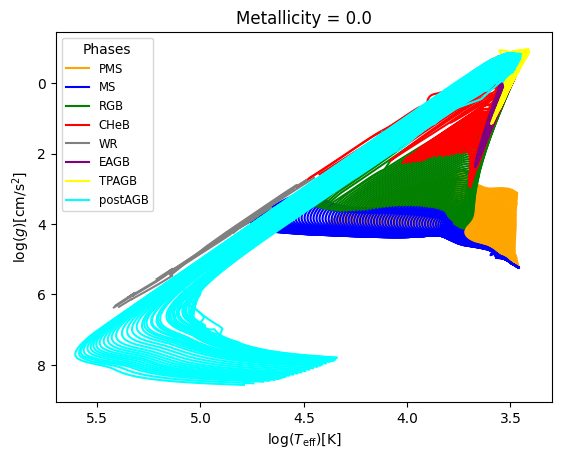

In [5]:
iso_handler = Iso_data_handler(path_to_data, 
                              ['log10_isochrone_age_yr', 'log_Teff', 'log_g', 'phase', 'metallicity', 'star_mass', 'log_R'], 
                              physical_model, reclassify=True)

iso_df = iso_handler.get_isochrone_dataframe()
display(iso_df)
data_visualiser = Data_visualiser(iso_df, physical_model)
data_visualiser.plot_Kiel([], [0.0])

In [6]:
print_uniques("star_mass", iso_df)
# print_uniques_count("star_mass", iso_df)

star_mass : 1467117 unique values, range [0.0999979840073621, 298.5447575808816]


,log10_isochrone_age_yr,log_Teff,log_g,phase,metallicity,star_mass,log_R
0,5.0,4.494412,4.346972,0.0,-0.25,13.584360,0.610679
1,5.0,4.497517,4.345776,0.0,-0.25,13.765512,0.614753
2,5.0,4.500556,4.344580,0.0,-0.25,13.942887,0.618755
3,5.0,4.504040,4.343050,0.0,-0.25,14.591712,0.624670
4,5.0,4.507576,4.341483,0.0,-0.25,15.426062,0.631187
...,...,...,...,...,...,...,...
630600,10.3,3.602322,1.827453,3.0,0.50,0.866616,1.274247
630601,10.3,3.600999,1.809405,3.0,0.50,0.866614,1.283270
630602,10.3,3.599710,1.791489,3.0,0.50,0.866612,1.292228
630603,10.3,3.598418,1.773621,3.0,0.50,0.866610,1.301161


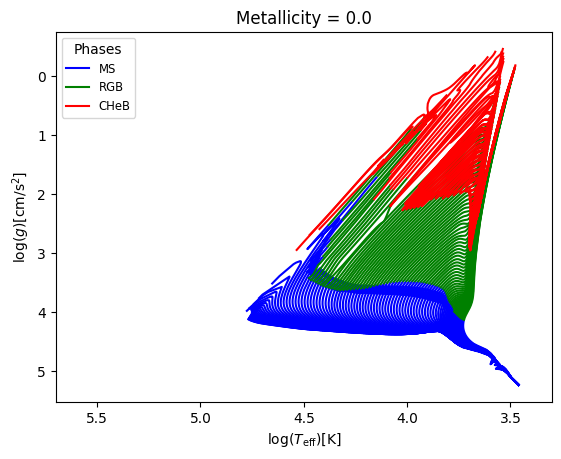

In [7]:
phase_filtered_iso_df = Data_preparator.filter_data(iso_df, {'phase':[0, 2, 3]})
display(phase_filtered_iso_df)
data_visualiser_phase_filtered = Data_visualiser(phase_filtered_iso_df, physical_model)
data_visualiser_phase_filtered.plot_Kiel([], [0.0])

In [8]:
print_uniques("star_mass", phase_filtered_iso_df)
# print_uniques_count("star_mass", phase_filtered_iso_df)

star_mass : 630605 unique values, range [0.0999979840073621, 298.5447575808816]


,log10_isochrone_age_yr,log_Teff,log_g,phase,metallicity,star_mass,log_R
0,6.50,4.126429,4.449033,0.0,-0.25,2.859137,0.222566
1,6.50,4.130406,4.448602,0.0,-0.25,2.900395,0.225872
2,6.50,4.134480,4.448201,0.0,-0.25,2.941695,0.229166
3,6.50,4.138527,4.447853,0.0,-0.25,2.982876,0.232424
4,6.55,4.113582,4.450139,0.0,-0.25,2.734122,0.212411
...,...,...,...,...,...,...,...
320423,10.30,3.602322,1.827453,3.0,0.50,0.866616,1.274247
320424,10.30,3.600999,1.809405,3.0,0.50,0.866614,1.283270
320425,10.30,3.599710,1.791489,3.0,0.50,0.866612,1.292228
320426,10.30,3.598418,1.773621,3.0,0.50,0.866610,1.301161


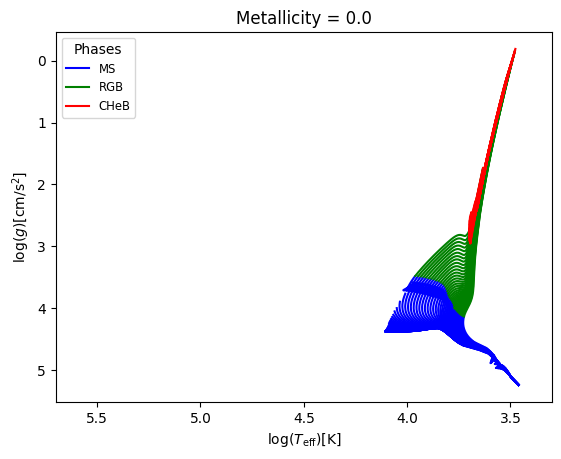

In [9]:
phase_mass_filtered_iso_df = Data_preparator.filter_data(iso_df, {'phase':[0, 2, 3], "star_mass" : ("<", 3)})
display(phase_mass_filtered_iso_df)
data_visualiser_phase_age_filtered = Data_visualiser(phase_mass_filtered_iso_df, physical_model)
data_visualiser_phase_age_filtered.plot_Kiel([], [0.0])

In [10]:
print_all_uniques(phase_mass_filtered_iso_df)

log10_isochrone_age_yr  : Range : 6.2 - 10.3, Mean : 9.0993, Median : 9.2

log_Teff  : Range : 3.34 - 4.3013, Mean : 3.795, Median : 3.7533

log_g  : Range : -1.08 - 5.4331, Mean : 3.6429, Median : 4.1661

Values in phase column : 0.0, 2.0, 3.0 

Values in metallicity column : -0.25, -0.5, -0.75, -1.0, -1.25, -1.5, -1.75, -2.0, -2.5, -3.0, -3.5, -4.0, 0.0, 0.25, 0.5 

star_mass  : Range : 0.1 - 3.0, Mean : 1.3237, Median : 1.1896

log_R  : Range : -1.0 - 2.7813, Mean : 0.4164, Median : 0.2391



In [11]:
X_train, X_ivs, y_train, y_ivs, categories_train, categories_ivs = \
    Data_preparator.split_data(phase_mass_filtered_iso_df, x_cols=['log10_isochrone_age_yr', 'metallicity', 'star_mass'], 
                               y_cols=['log_Teff', 'log_g', 'log_R'], categories_cols=['phase'], random_state=12, print_stats=True)

print(X_train.shape, X_ivs.shape)
print(y_train.shape, y_ivs.shape)

Training set statistics:
Range in train data for the log_Teff parameter : 3.344668191350628 - 4.301337973559223
Median value in train data for the log_Teff parameter: 3.753328837380179
Mean value in train data for the log_Teff parameter: 3.7949716525887314

Range in train data for the log_g parameter : -1.074853654540692 - 5.433094523832443
Median value in train data for the log_g parameter: 4.165542241200133
Mean value in train data for the log_g parameter: 3.6440273363002986

Range in train data for the log_R parameter : -0.9974747647513328 - 2.7813065611193197
Median value in train data for the log_R parameter: 0.2392300004319432
Mean value in train data for the log_R parameter: 0.4157857297090251

Testing set statistics:
Range in test data for the log_Teff parameter : 3.344711147414537 - 4.300522876087196
Median value in test data for the log_Teff parameter: 3.753319445895525
Mean value in test data for the log_Teff parameter: 3.795187061327533

Range in test data for the log_g par

## Model training

### Linear regression

In [12]:
lr_evaluator = Model_evaluator("linear_regression", path=path_to_results, physical_model=physical_model, output_parameters=output_parameters)


mass_smaller_3 train data :
Performing K-fold...
Split 1 2 3 4 5 6 7 8 9 10 
Evaluating predictions...
no negative values

T_eff results for the phase category with a value of 0.0
  value range :  3.344668191350628 - 4.301337973559223
  RVE :  0.7952169856862885
  RMSE :  0.10012298120179201
  MAE :  0.08565542836409769
  MedAE :  0.08273788744070631
  CORR :  0.8997146255602749
  MAX_ER :  0.22314156936013863
  Percentiles : 
    75th percentile :  0.1284236288841596
    90th percentile :  0.15486774549729324
    95th percentile :  0.17249923447583435
    99th percentile :  0.19345398490174334

T_eff results for the phase category with a value of 2.0
  value range :  3.431312032318489 - 4.276512878191396
  RVE :  0.5120884522700372
  RMSE :  0.11229366515878422
  MAE :  0.09123782310850015
  MedAE :  0.07962930853335237
  CORR :  0.7397267328234813
  MAX_ER :  0.35364610407660413
  Percentiles : 
    75th percentile :  0.13149494021473473
    90th percentile :  0.1825098239214138
   

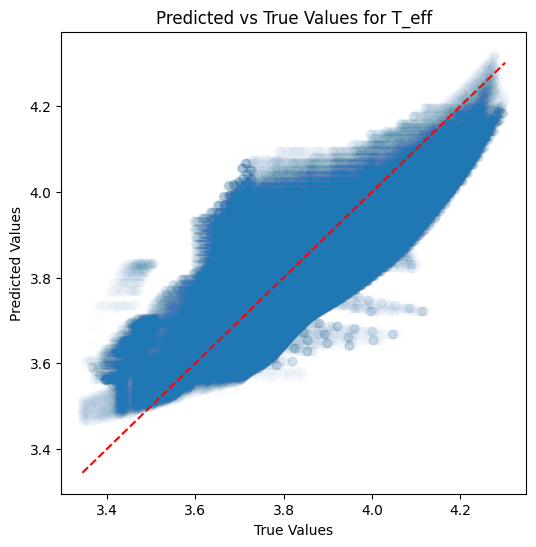

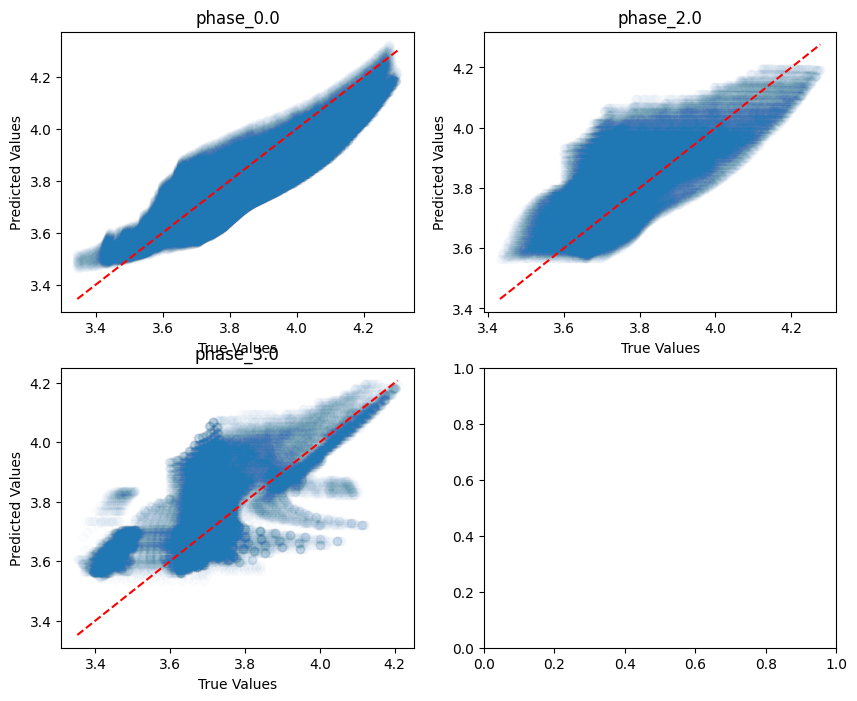

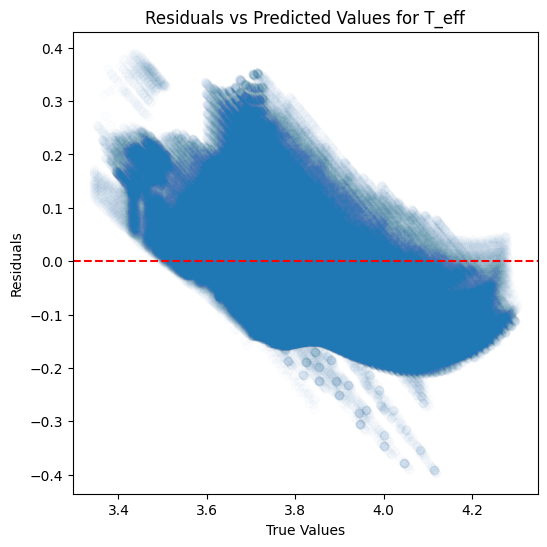

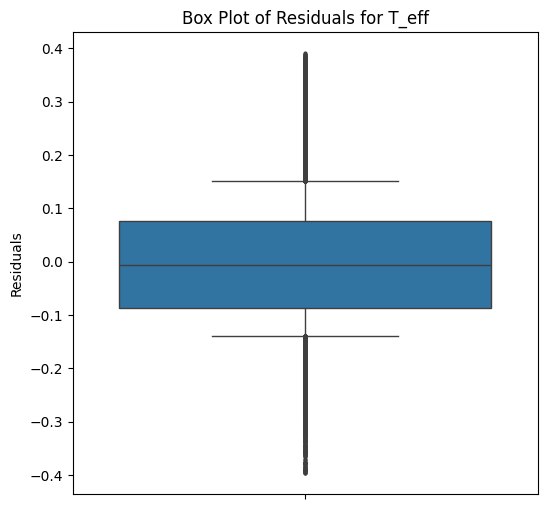

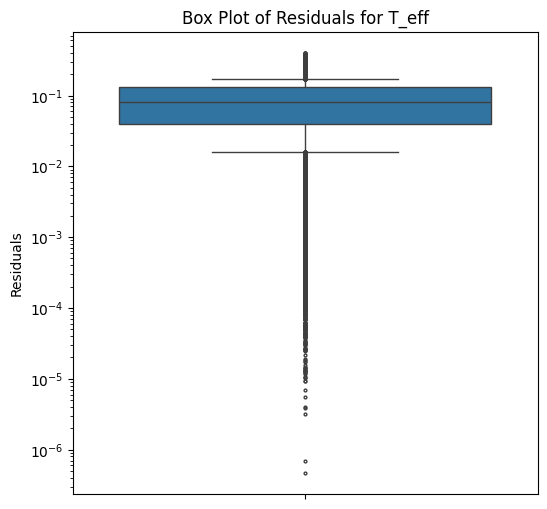

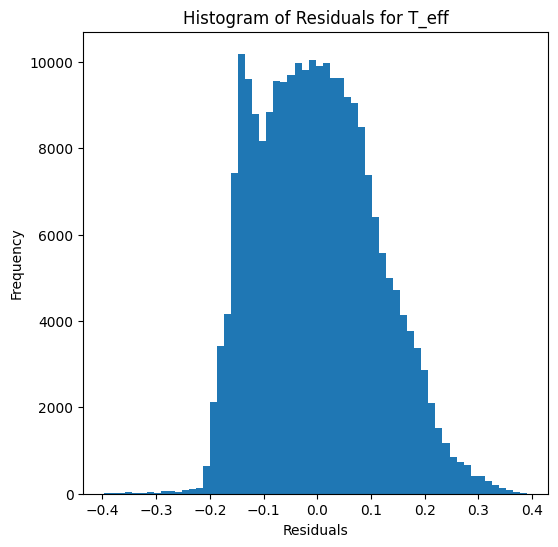

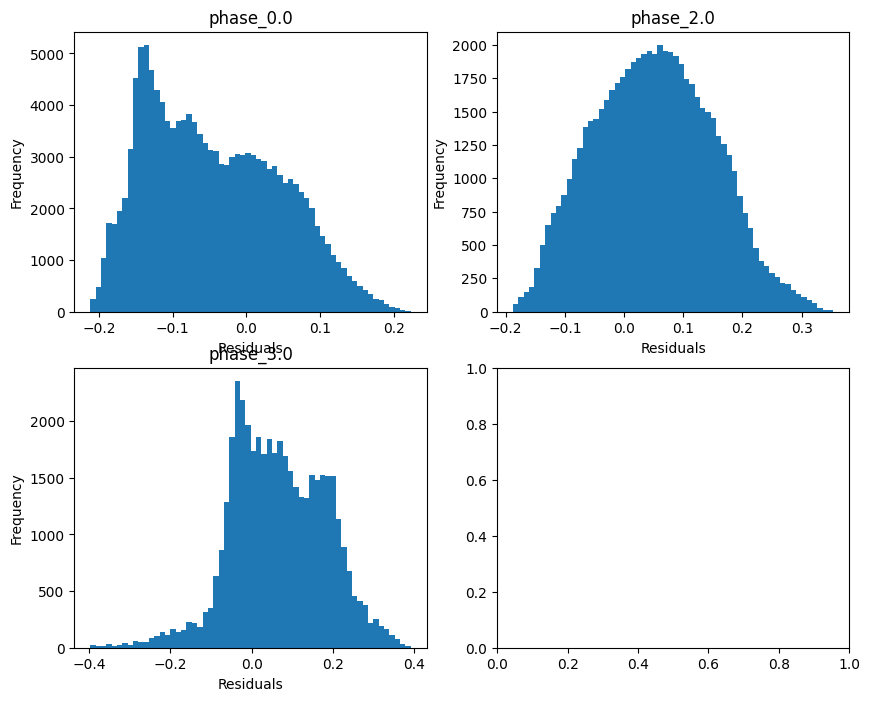

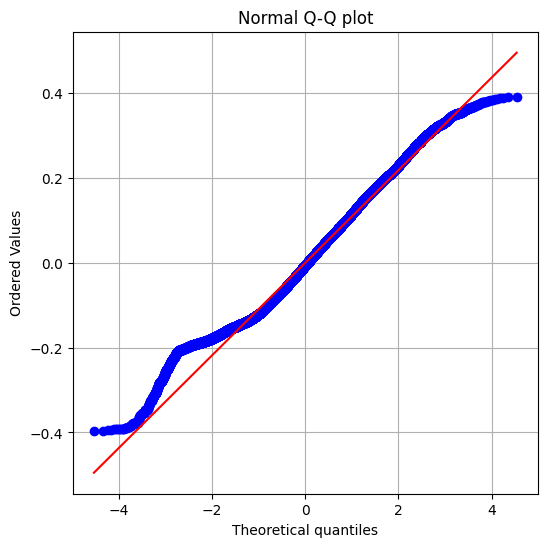

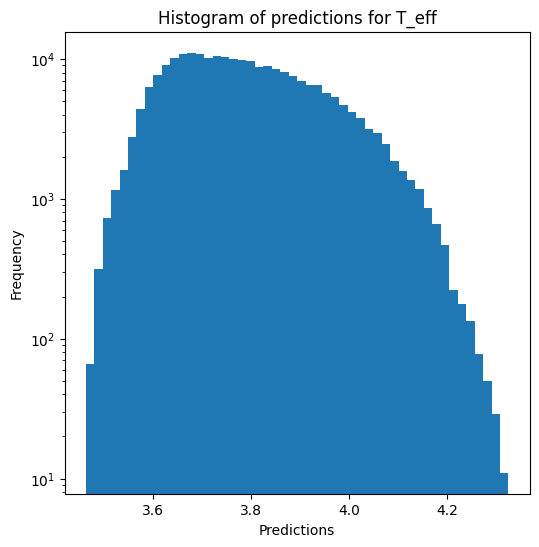

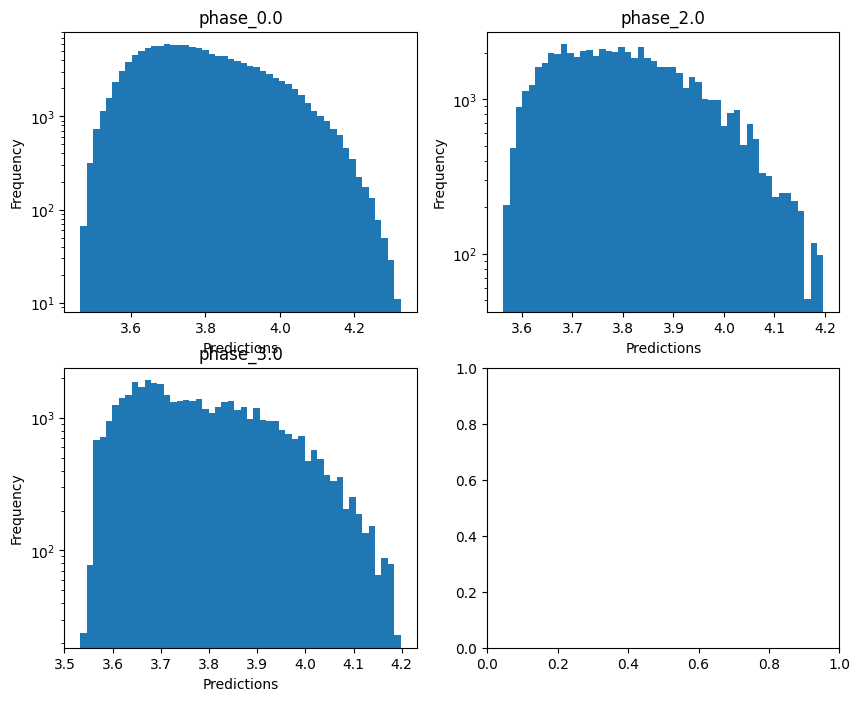

no negative values

log_g results for the phase category with a value of 0.0
  value range :  3.379753170845917 - 5.433094523832443
  RVE :  -2.521397989651777
  RMSE :  0.8440665179831662
  MAE :  0.7418497025907919
  MedAE :  0.7724535260459318
  CORR :  0.5823745803566858
  MAX_ER :  1.7535652233089074
  Percentiles : 
    75th percentile :  1.0291053394096048
    90th percentile :  1.2827348043287992
    95th percentile :  1.4083807256159009
    99th percentile :  1.594769704524095

log_g results for the phase category with a value of 2.0
  value range :  -0.2597443254273661 - 4.406128730397165
  RVE :  -0.024985407321623132
  RMSE :  1.1074491124778347
  MAE :  0.8589884733610837
  MedAE :  0.646852071632912
  CORR :  0.12286635004626859
  MAX_ER :  2.962551082058075
  Percentiles : 
    75th percentile :  1.2481101901773668
    90th percentile :  2.004264353811183
    95th percentile :  2.3305429603964667
    99th percentile :  2.6796643480037687

log_g results for the phase cate

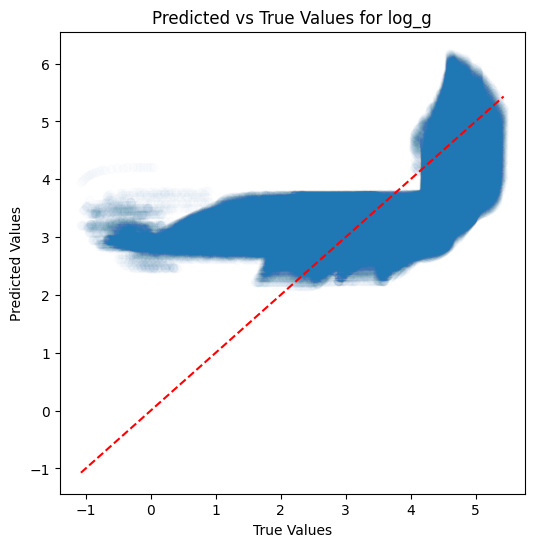

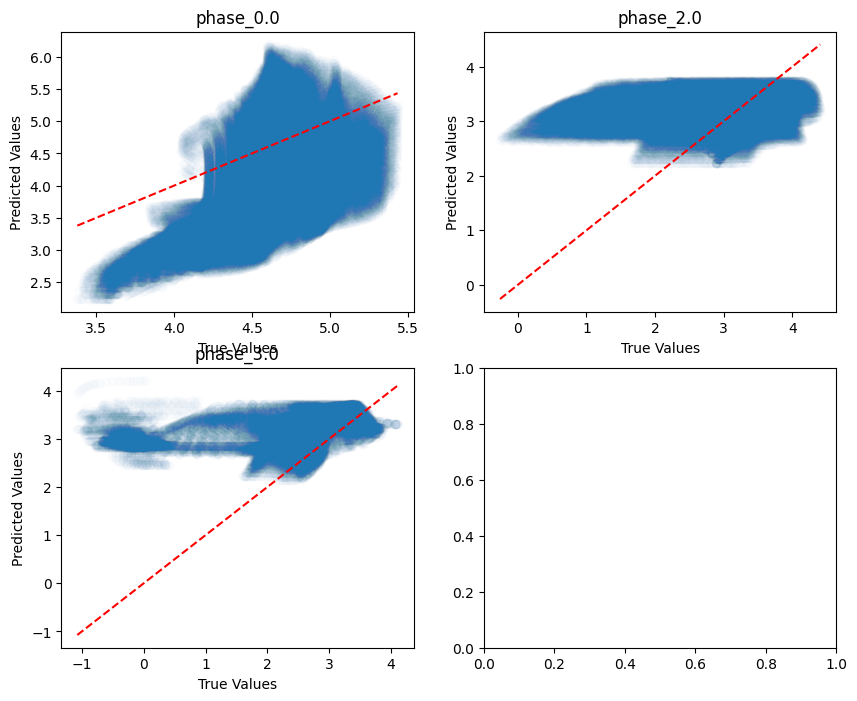

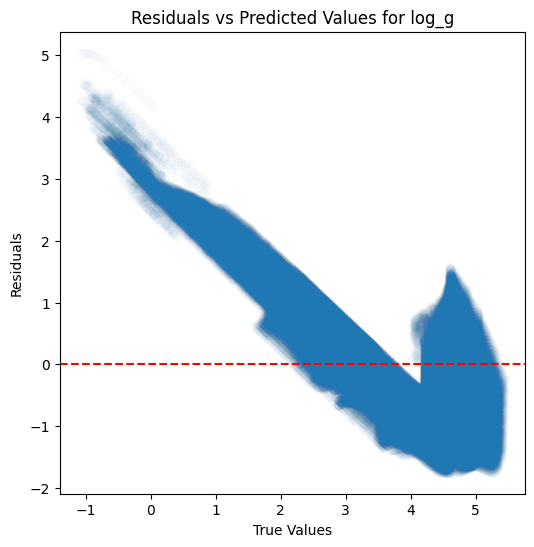

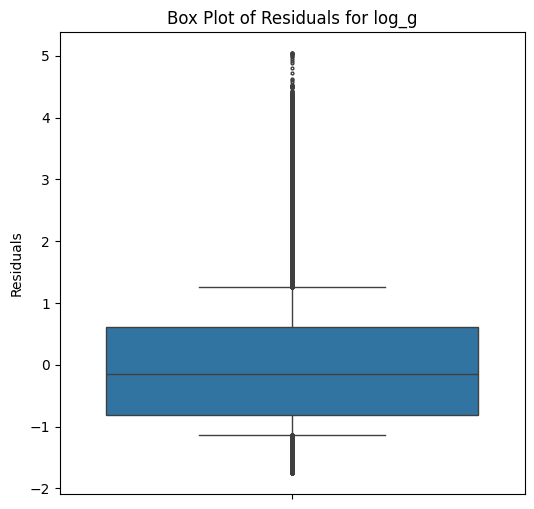

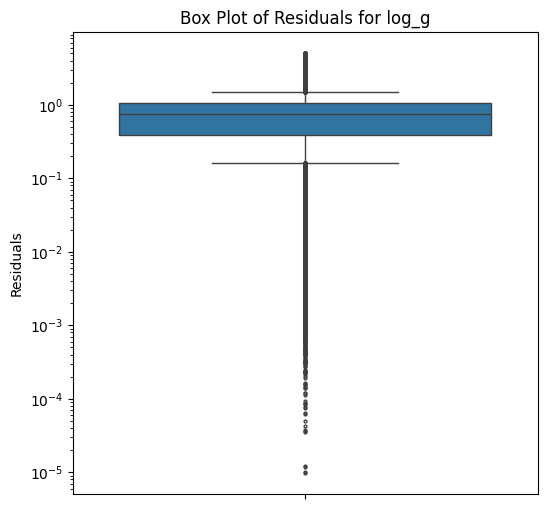

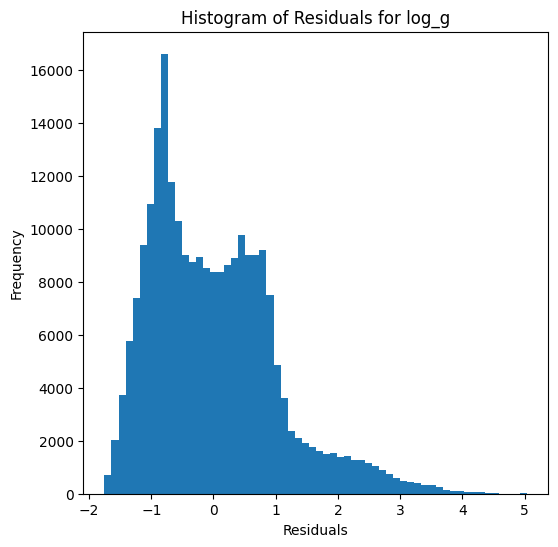

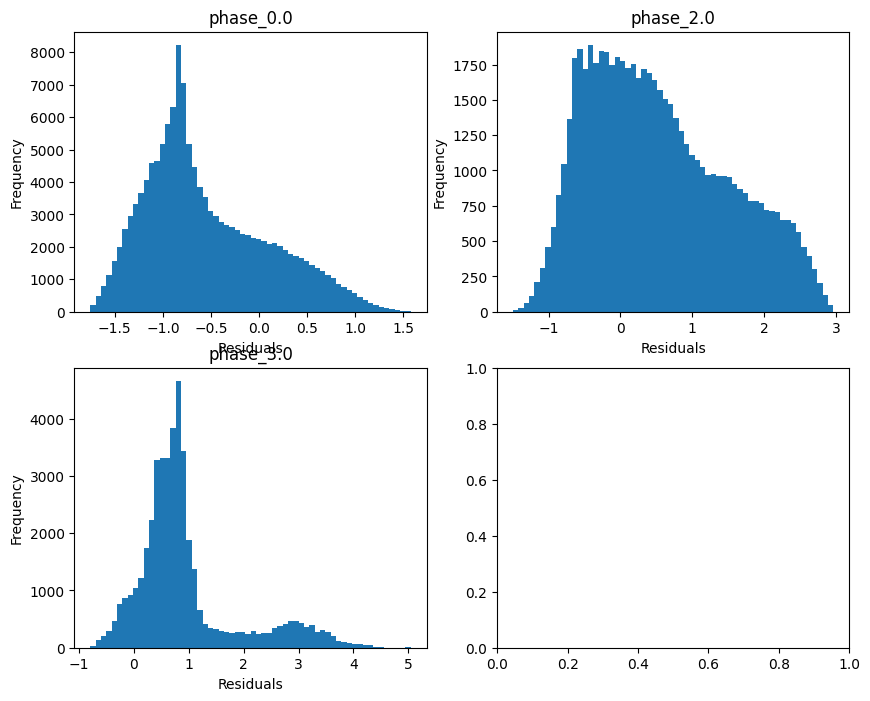

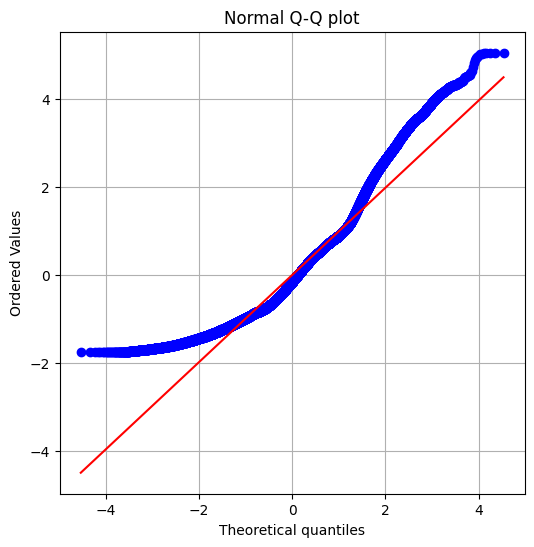

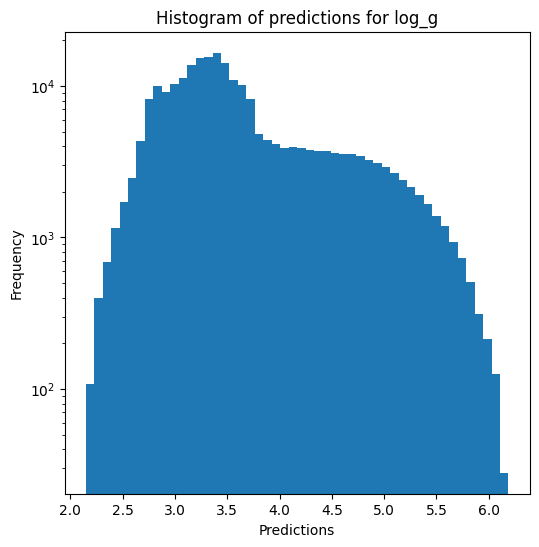

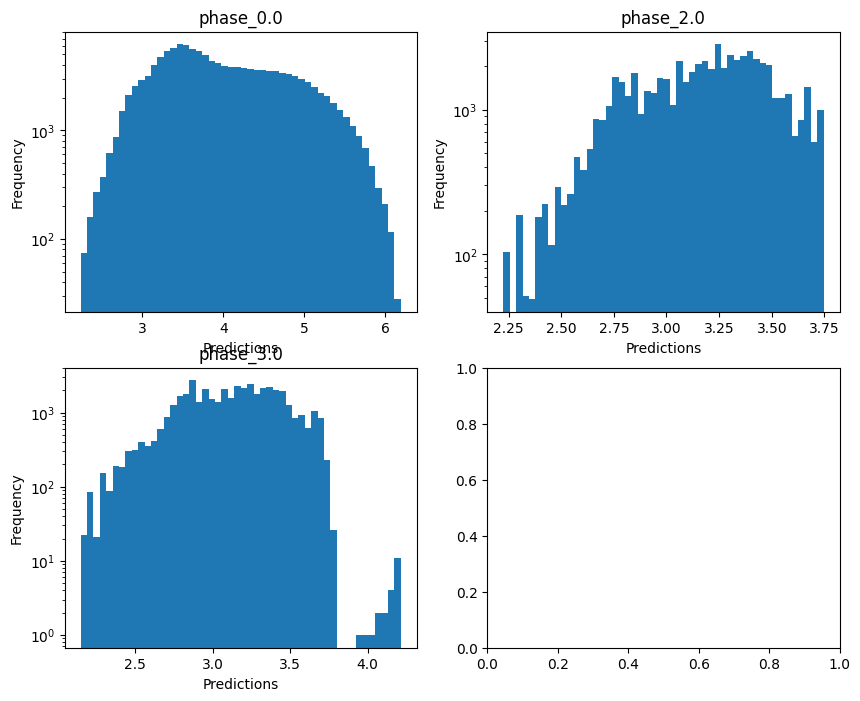


radius results for the phase category with a value of 0.0
  value range :  -0.9974747647513328 - 0.7629161677552769
  RVE :  -0.20822089580122594
  RMSE :  0.4497299652409353
  MAE :  0.392057909104214
  MedAE :  0.3816820299980535
  CORR :  0.6426645360484811
  MAX_ER :  1.1702211655892931
  Percentiles : 
    75th percentile :  0.5452748954598562
    90th percentile :  0.694517669370035
    95th percentile :  0.7697423637880343
    99th percentile :  0.9069029933248581

radius results for the phase category with a value of 2.0
  value range :  0.0909920840275404 - 2.3291459066926827
  RVE :  -0.1896931695325681
  RMSE :  0.5721379549167255
  MAE :  0.4445126413723777
  MedAE :  0.33753845864014215
  CORR :  0.05327467345197411
  MAX_ER :  1.5031604605607218
  Percentiles : 
    75th percentile :  0.6530752521290092
    90th percentile :  1.032132581045833
    95th percentile :  1.1954793270698456
    99th percentile :  1.369555616870031

radius results for the phase category with a 

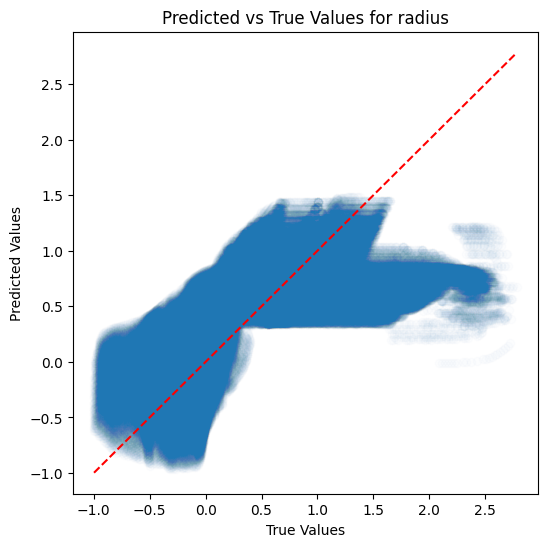

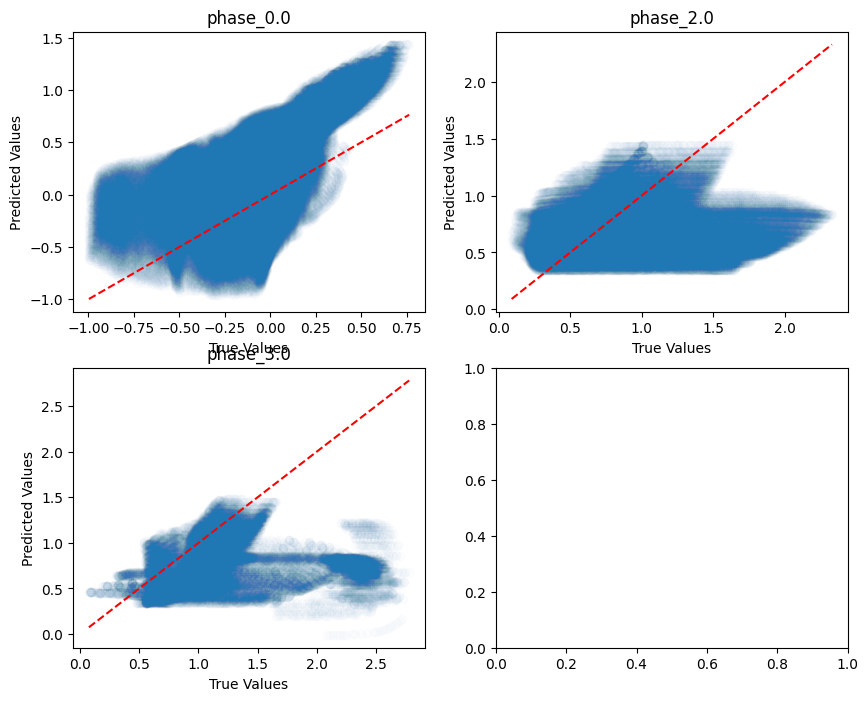

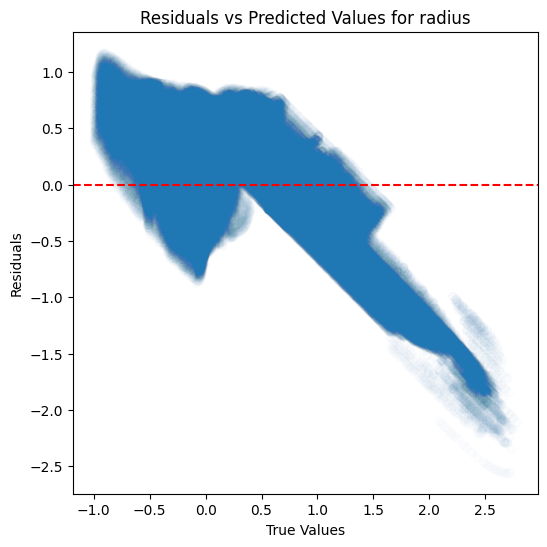

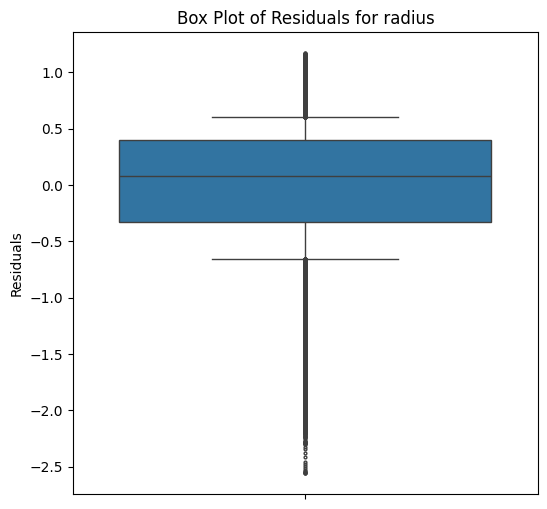

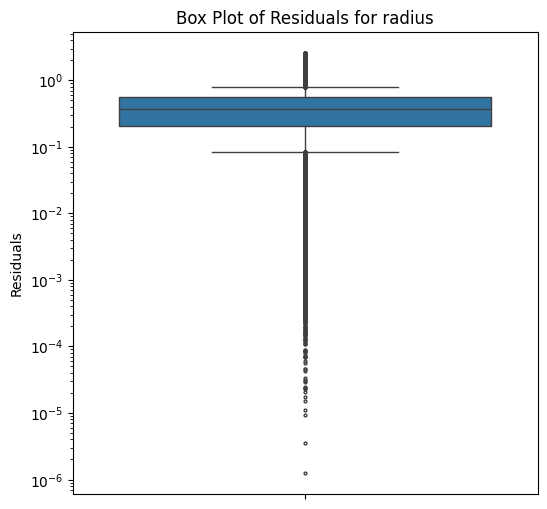

...

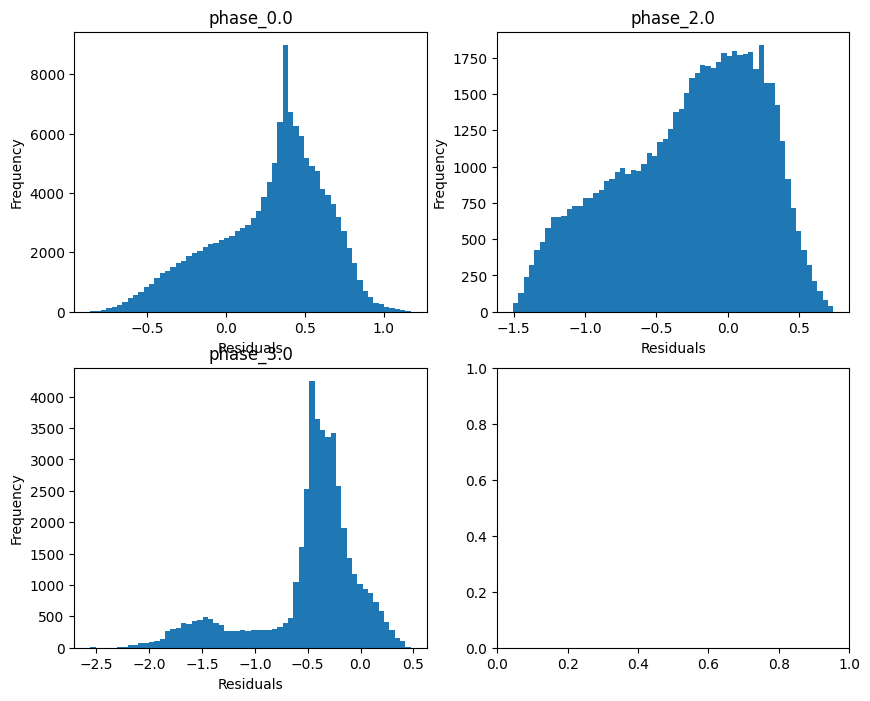

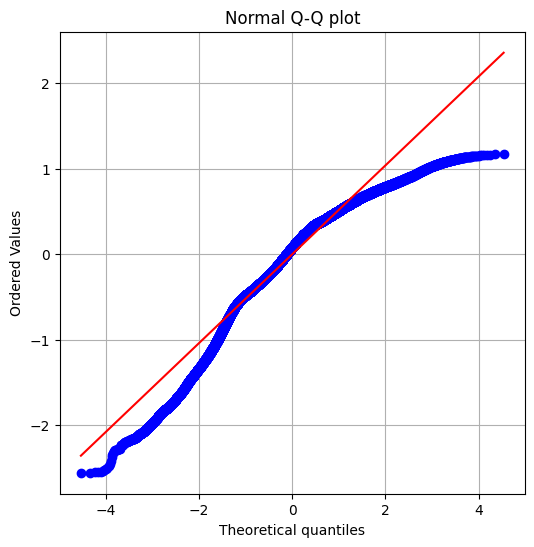

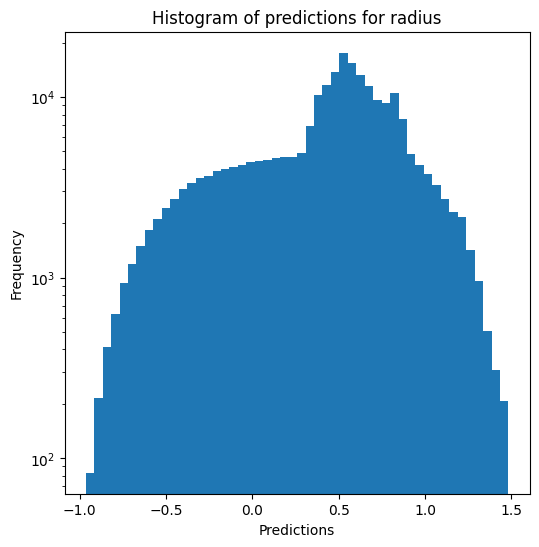

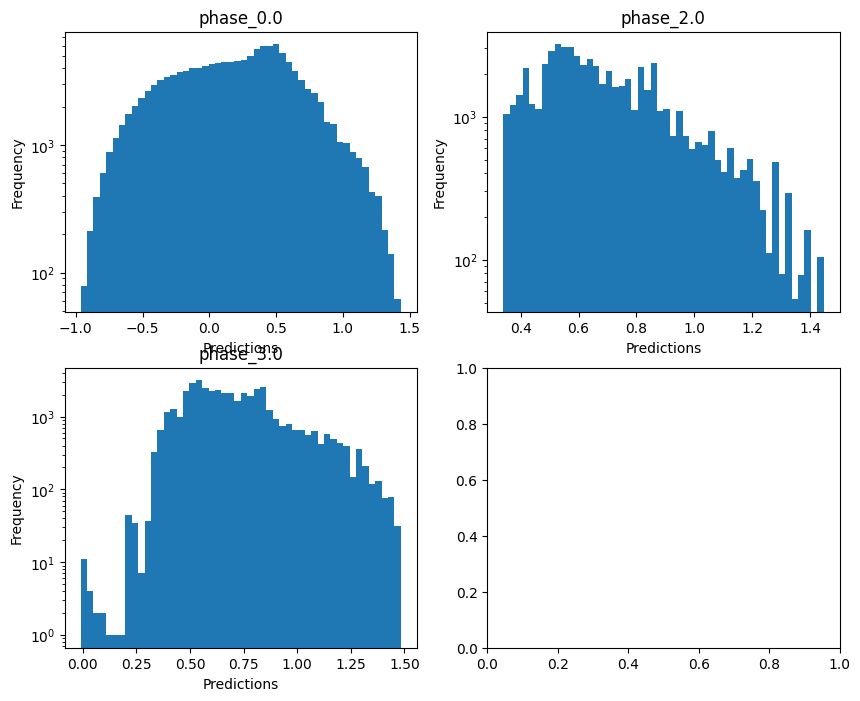

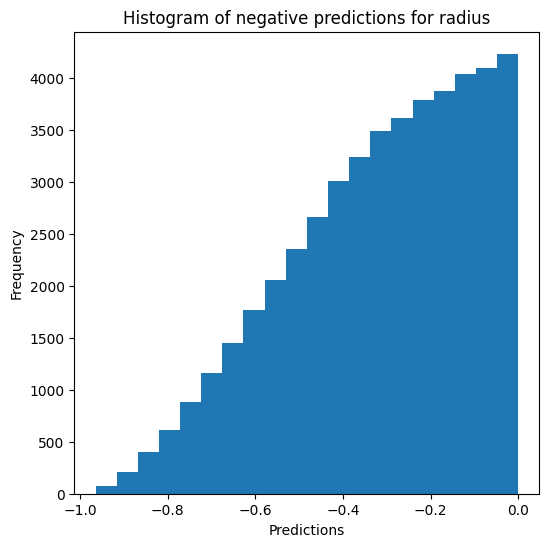

Saving predictions and results...


In [13]:
lr_evaluator.evaluate_Kfold_results(LinearRegression, X_train, y_train, categories_train, categories_name, path_to_predictions, tag, random_state=12, override=override, use_preds=use_preds, save=save, show=show) # override=False, use_preds=True

### Decision tree

In [14]:
dt_evaluator = Model_evaluator("decision_tree", path=path_to_results, physical_model=physical_model, output_parameters=output_parameters)


mass_smaller_3 train data :
Performing K-fold...
Split 1 2 3 4 5 6 7 8 9 10 
Evaluating predictions...
no negative values

T_eff results for the phase category with a value of 0.0
  value range :  3.344668191350628 - 4.301337973559223
  RVE :  0.9773999588869283
  RMSE :  0.03010854128403758
  MAE :  0.005644709220809985
  MedAE :  0.000858234826005777
  CORR :  0.9890196908528636
  MAX_ER :  0.4365182281298141
  Percentiles : 
    75th percentile :  0.0019681322247054878
    90th percentile :  0.0041882335682105875
    95th percentile :  0.007732305224041003
    99th percentile :  0.19470672423302332

T_eff results for the phase category with a value of 2.0
  value range :  3.431312032318489 - 4.276512878191396
  RVE :  0.7709605317700099
  RMSE :  0.06882810309466976
  MAE :  0.03870624472345887
  MedAE :  0.0047990758964258085
  CORR :  0.8847581143701574
  MAX_ER :  0.4062947189452939
  Percentiles : 
    75th percentile :  0.059125672807923024
    90th percentile :  0.12782950761

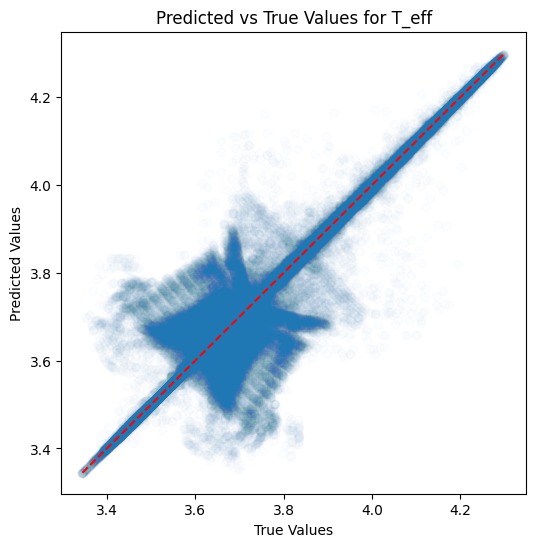

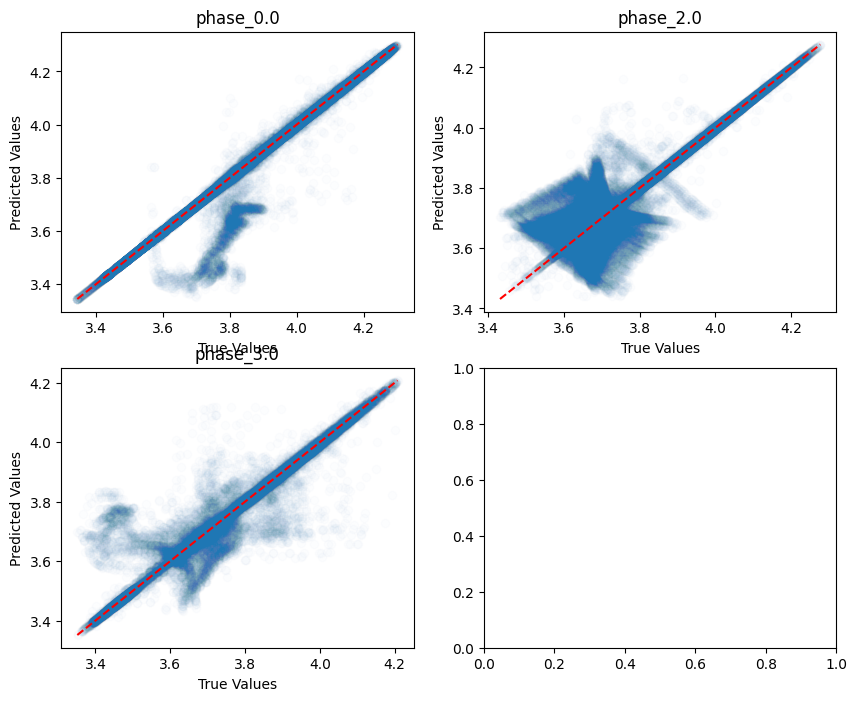

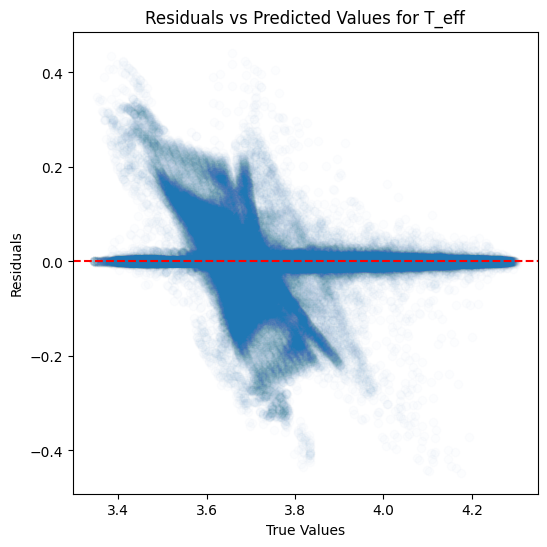

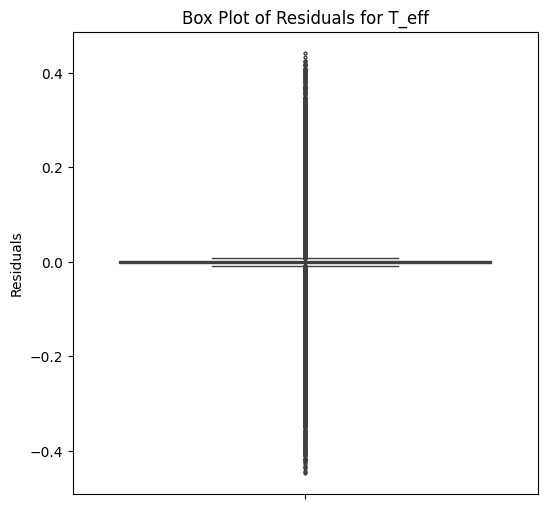

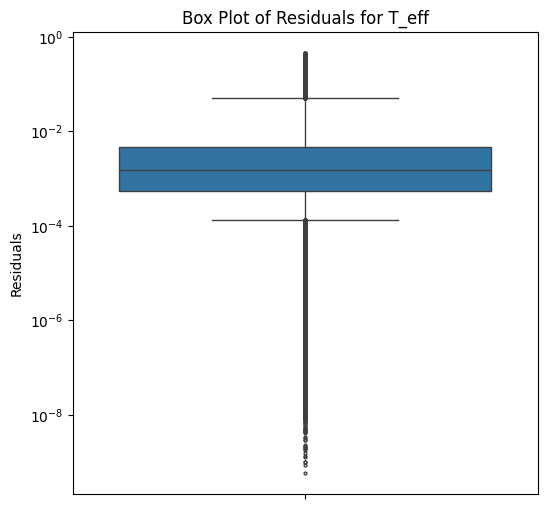

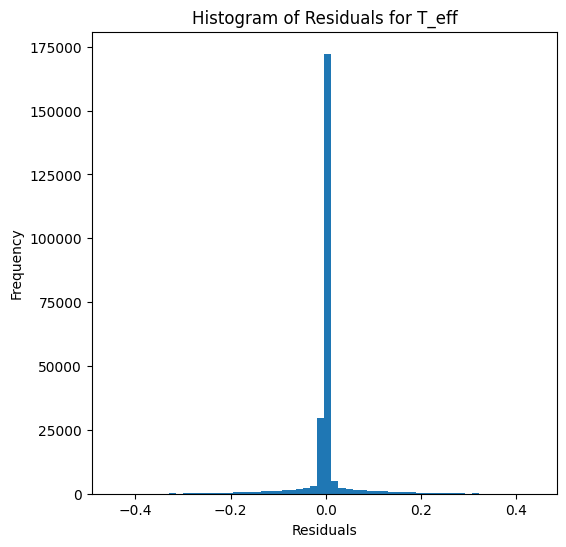

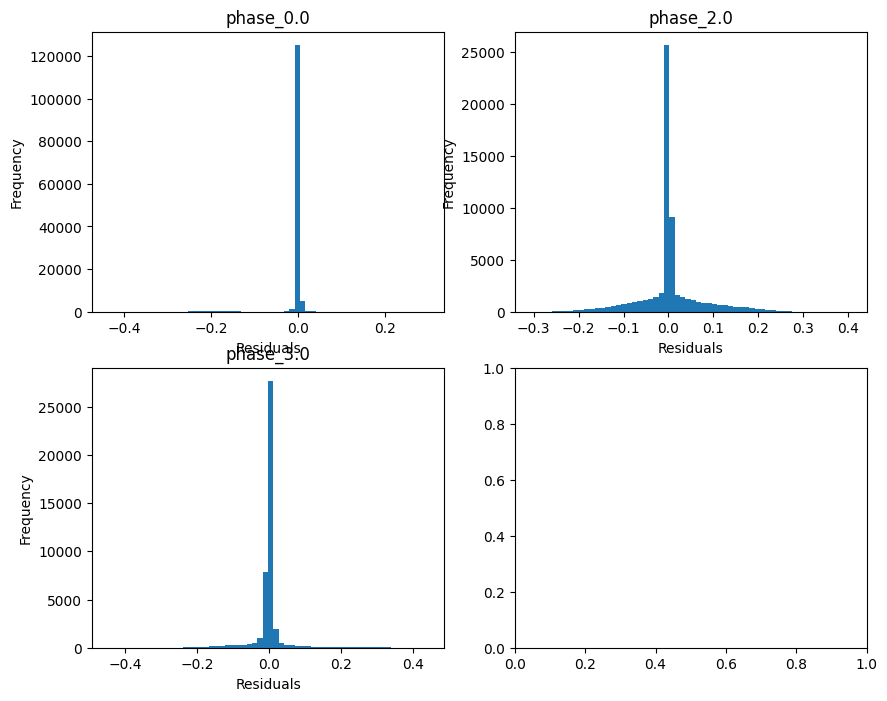

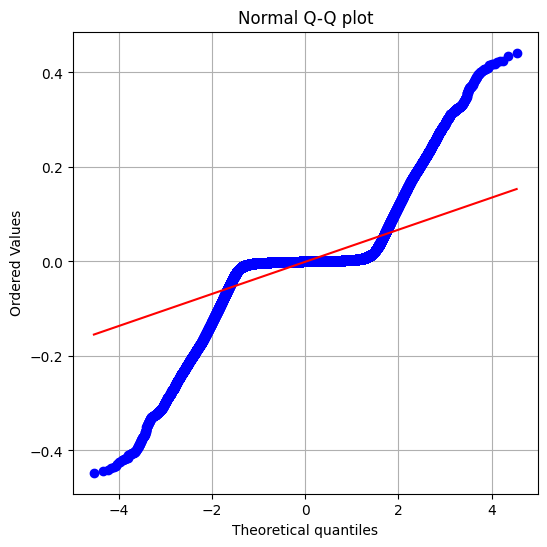

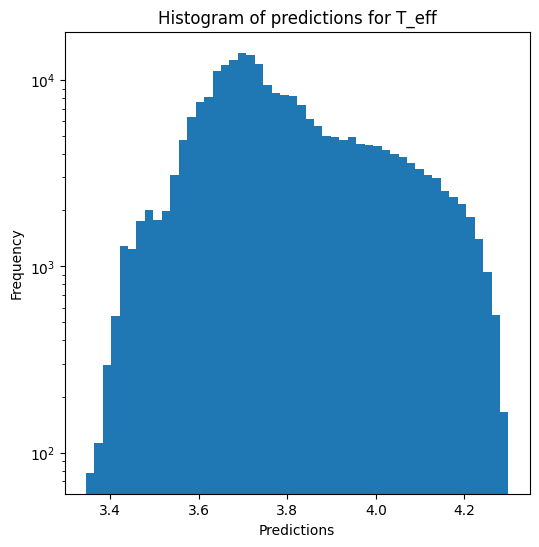

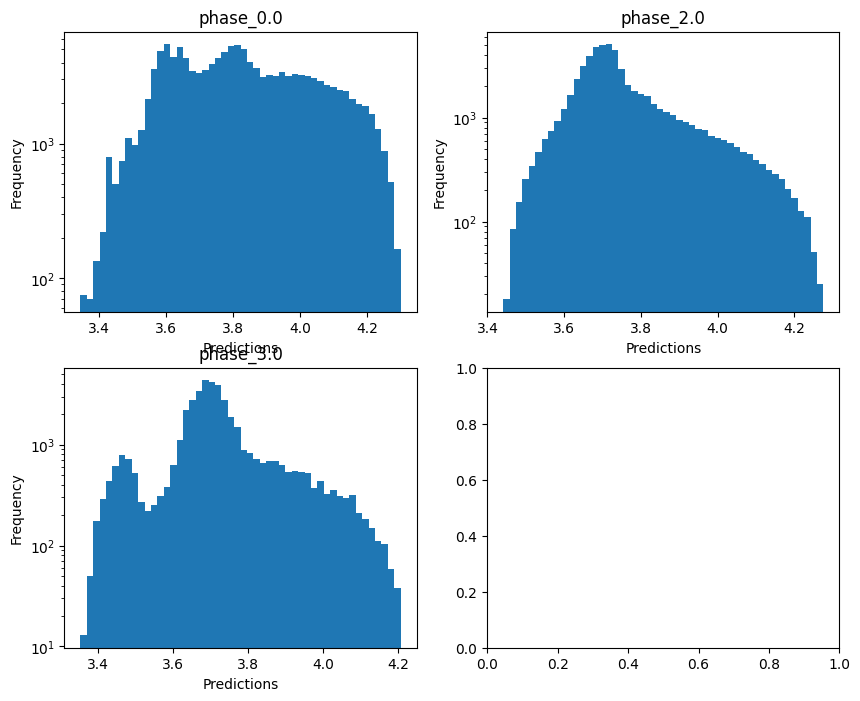


log_g results for the phase category with a value of 0.0
  value range :  3.379753170845917 - 5.433094523832443
  RVE :  -1.1300497320341796
  RMSE :  0.5035709036907391
  MAE :  0.0716569625828388
  MedAE :  0.00308131589105054
  CORR :  0.6375765894703289
  MAX_ER :  5.652757092002655
  Percentiles : 
    75th percentile :  0.006256719907565378
    90th percentile :  0.010909096932143215
    95th percentile :  0.018321417283117186
    99th percentile :  3.4674612956565323

log_g results for the phase category with a value of 2.0
  value range :  -0.2597443254273661 - 4.406128730397165
  RVE :  -0.600607812095914
  RMSE :  1.2147769965282542
  MAE :  0.6875100410861217
  MedAE :  0.031406829296553695
  CORR :  0.18202335941849643
  MAX_ER :  4.549992728833681
  Percentiles : 
    75th percentile :  1.1708827411087364
    90th percentile :  2.3302527768403034
    95th percentile :  2.938071647035091
    99th percentile :  3.7252614796641534

log_g results for the phase category with a

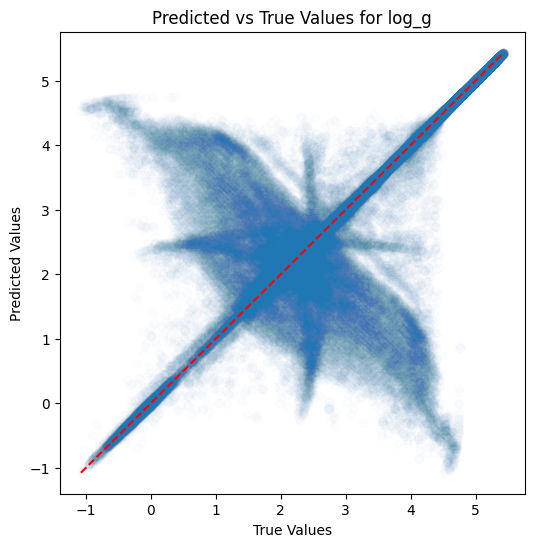

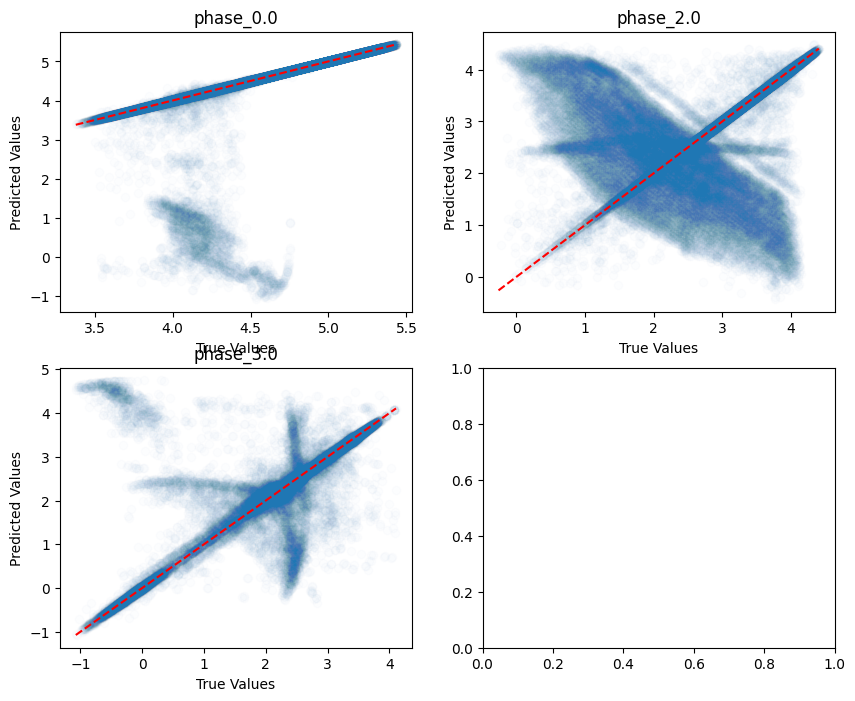

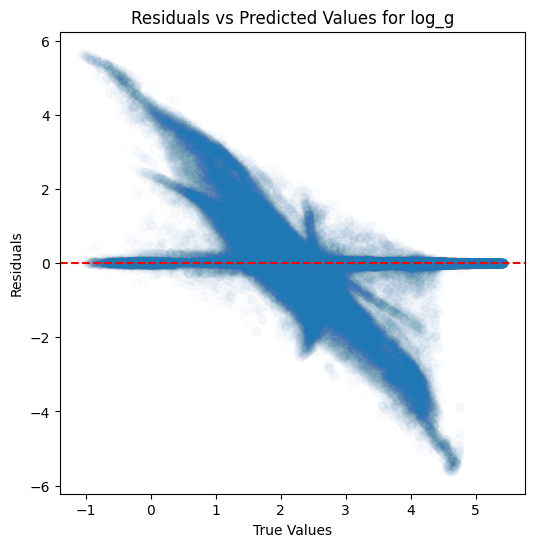

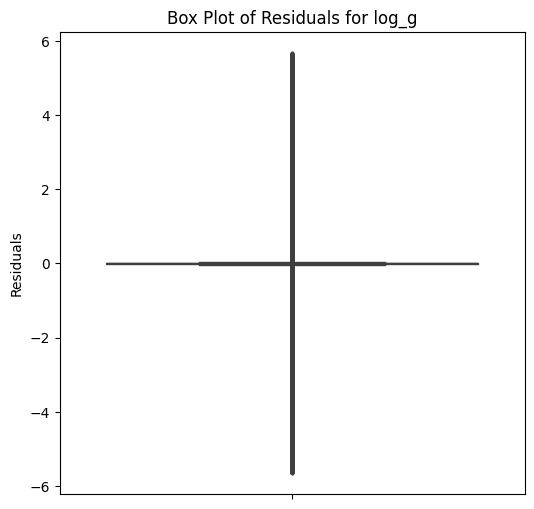

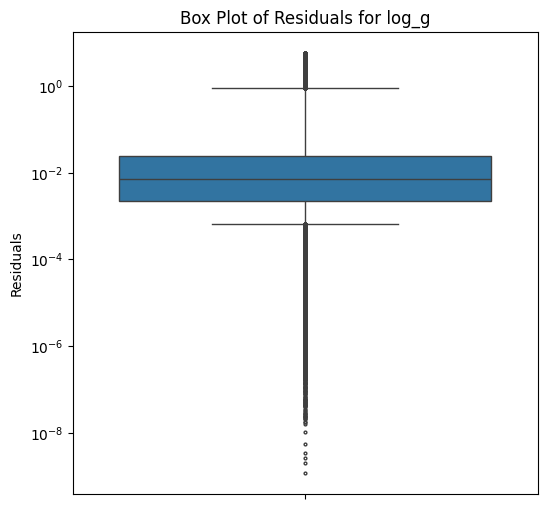

...

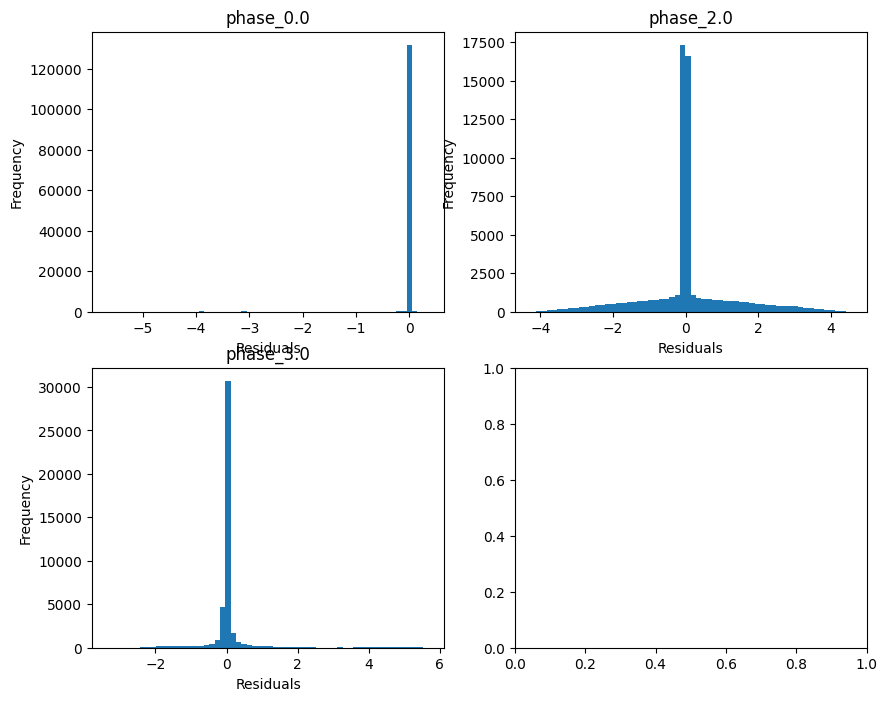

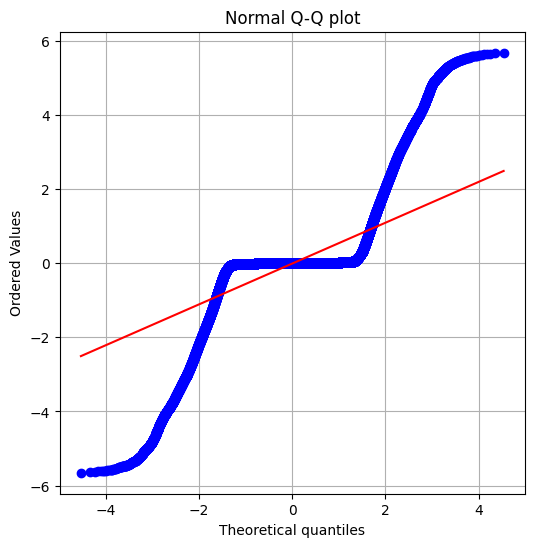

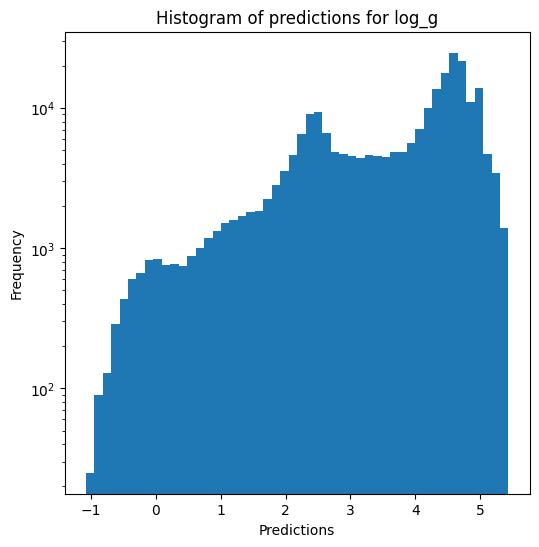

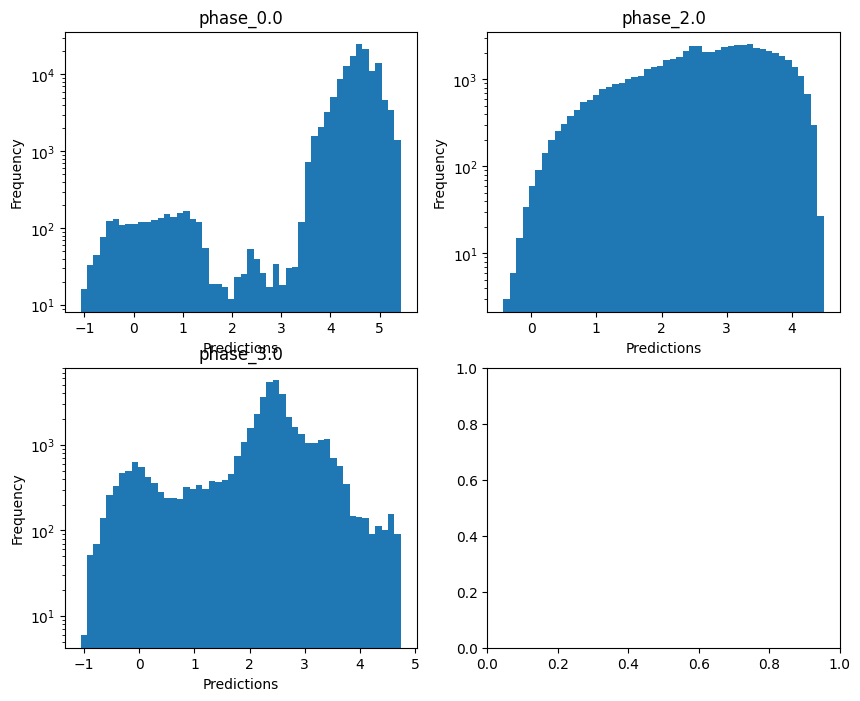

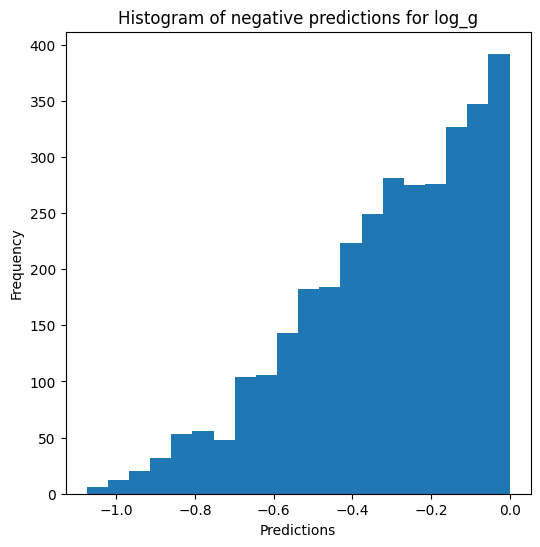


radius results for the phase category with a value of 0.0
  value range :  -0.9974747647513328 - 0.7629161677552769
  RVE :  0.3860599348423952
  RMSE :  0.2517969418258352
  MAE :  0.036375921343322994
  MedAE :  0.0020848903835595928
  CORR :  0.803251675998881
  MAX_ER :  2.82646665792077
  Percentiles : 
    75th percentile :  0.0039558196860164496
    90th percentile :  0.00672509948099101
    95th percentile :  0.010521455863283888
    99th percentile :  1.733069985944856

radius results for the phase category with a value of 2.0
  value range :  0.0909920840275404 - 2.3291459066926827
  RVE :  -0.7458496586144128
  RMSE :  0.6073736860017083
  MAE :  0.34376173997642934
  MedAE :  0.015723771247499796
  CORR :  0.12255294497939681
  MAX_ER :  2.274543112805293
  Percentiles : 
    75th percentile :  0.585385844837251
    90th percentile :  1.1652038831395057
    95th percentile :  1.4687252751127056
    99th percentile :  1.8625327749729

radius results for the phase category w

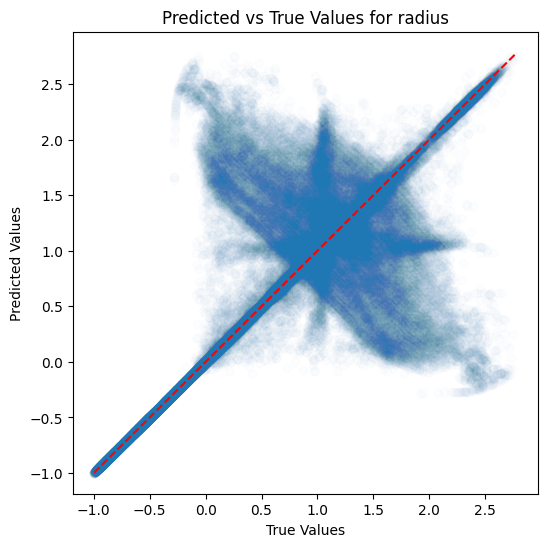

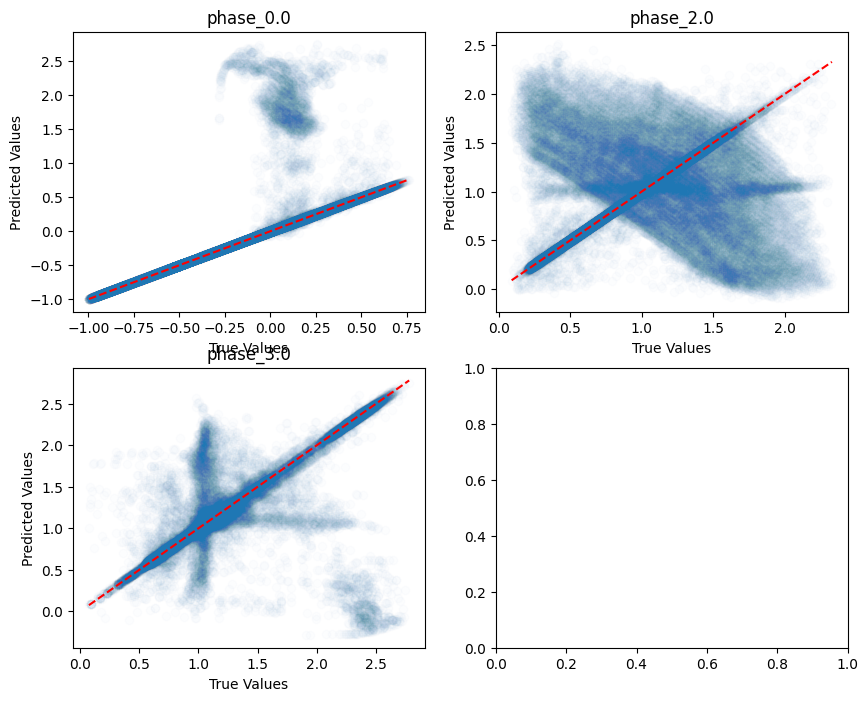

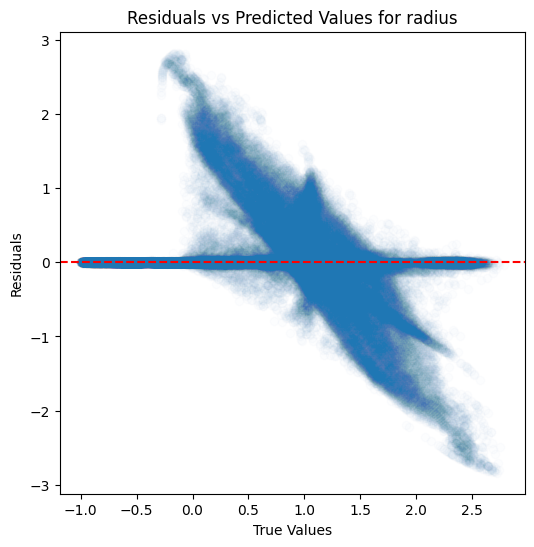

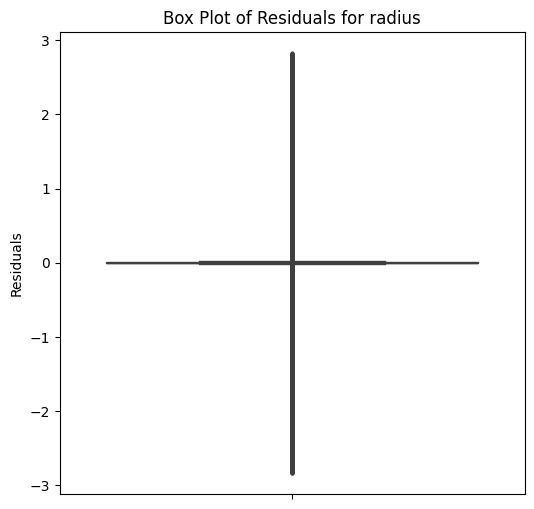

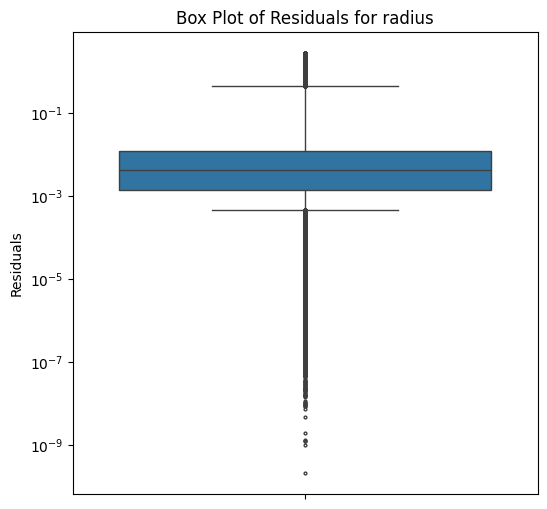

...

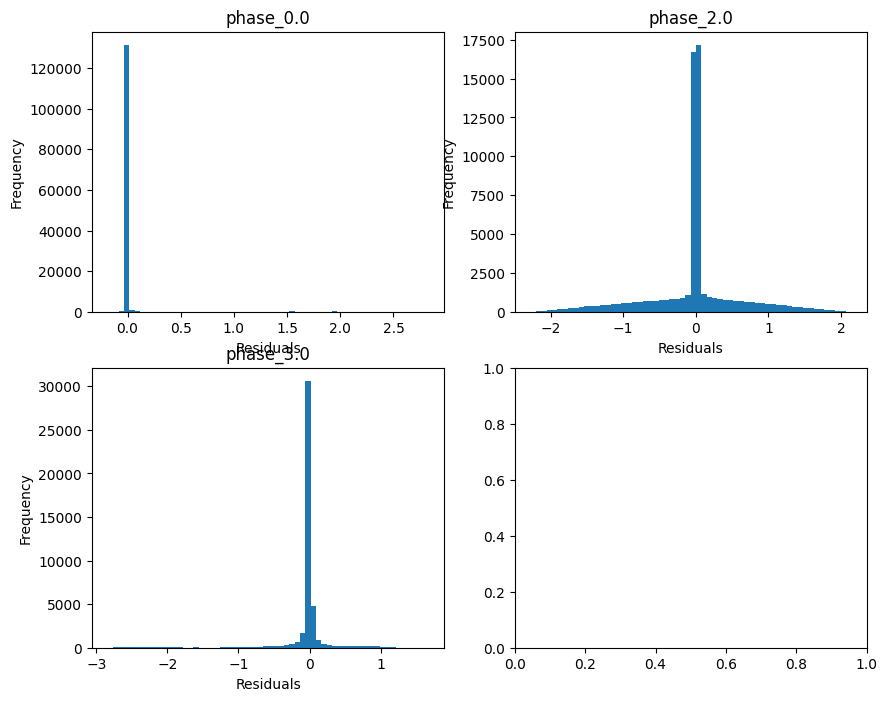

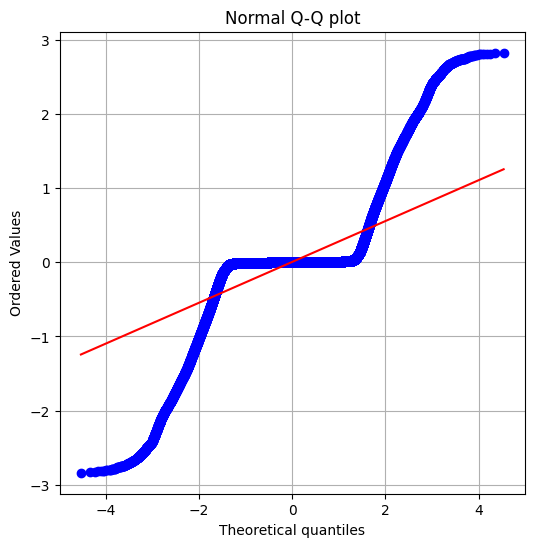

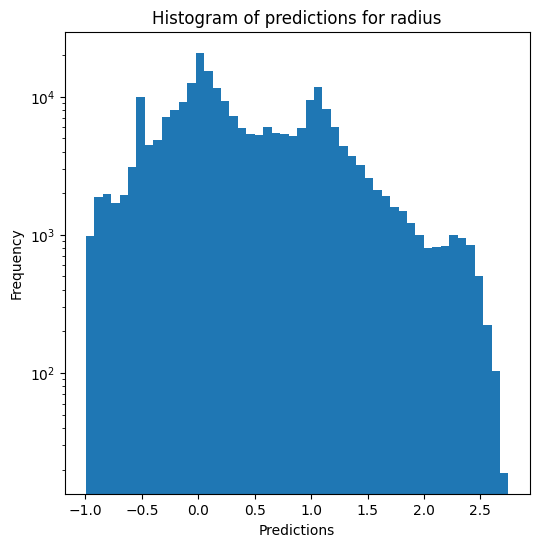

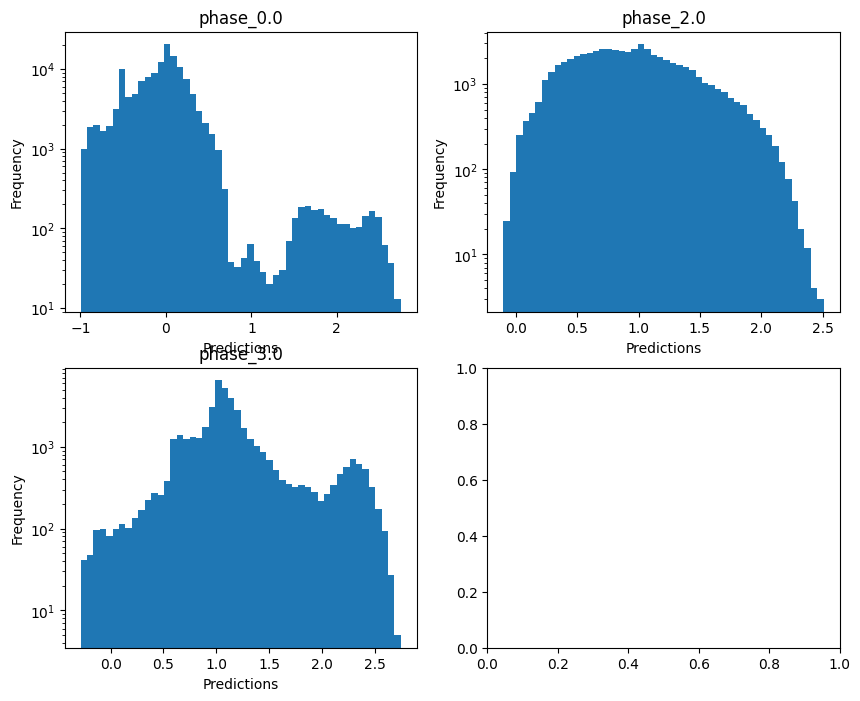

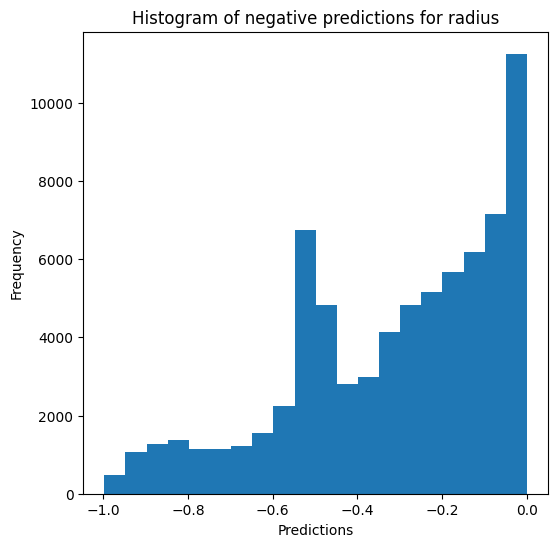

Saving predictions and results...


In [15]:
dt_evaluator.evaluate_Kfold_results(DecisionTreeRegressor, X_train, y_train, categories_train, categories_name, path_to_predictions, tag, random_state=12, override=override, use_preds=use_preds, save=save, show=show)

### K-nearest neighbours

In [16]:
knn_evaluator = Model_evaluator("KNN", path=path_to_results, physical_model=physical_model, output_parameters=output_parameters)


mass_smaller_3 train data :
Performing K-fold...
Split 1 2 3 4 5 6 7 8 9 10 
Evaluating predictions...
no negative values

T_eff results for the phase category with a value of 0.0
  value range :  3.344668191350628 - 4.301337973559223
  RVE :  0.9894756697250728
  RMSE :  0.02056867816725037
  MAE :  0.0045865261698163715
  MedAE :  0.0011444142123786527
  CORR :  0.994823594229528
  MAX_ER :  0.41704639332184223
  Percentiles : 
    75th percentile :  0.002395384572552728
    90th percentile :  0.004584474488002945
    95th percentile :  0.007054365913750214
    99th percentile :  0.10440518555838262

T_eff results for the phase category with a value of 2.0
  value range :  3.431312032318489 - 4.276512878191396
  RVE :  0.8934456021727001
  RMSE :  0.0470324015037474
  MAE :  0.026887284361531018
  MedAE :  0.006648947737740052
  CORR :  0.9453190289256121
  MAX_ER :  0.33967017198218485
  Percentiles : 
    75th percentile :  0.04026415093029523
    90th percentile :  0.081815290518

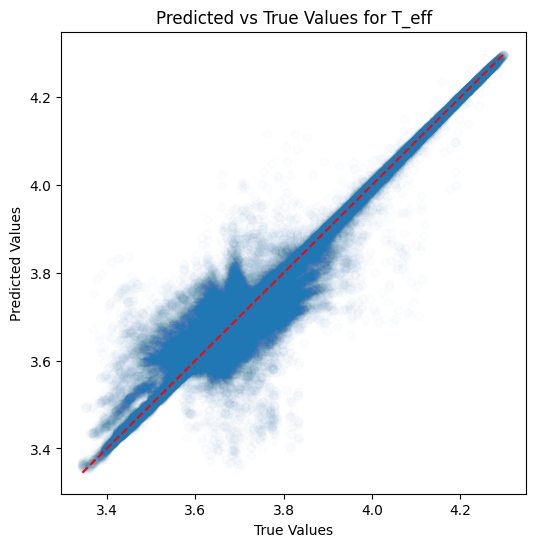

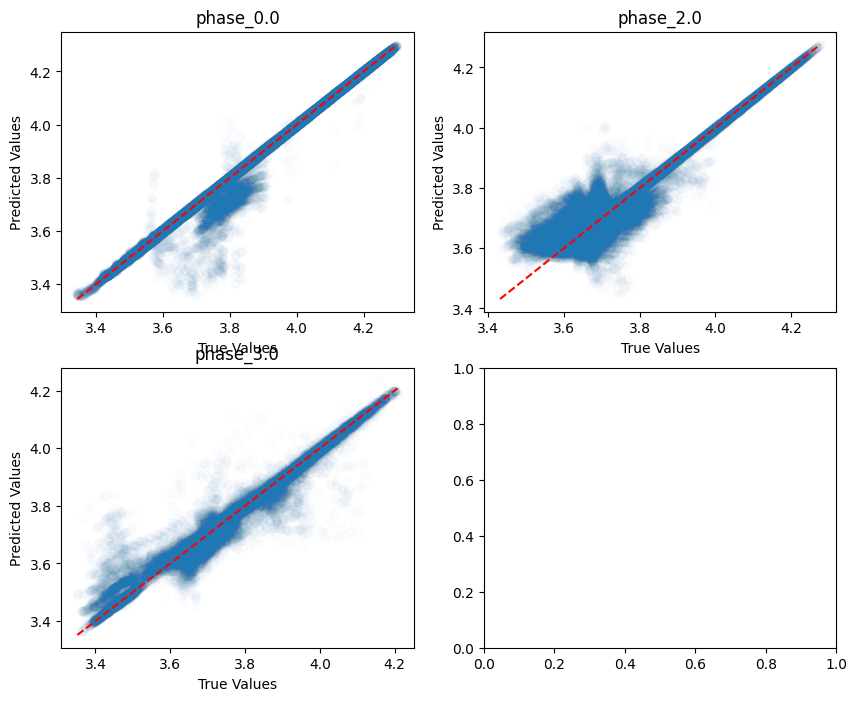

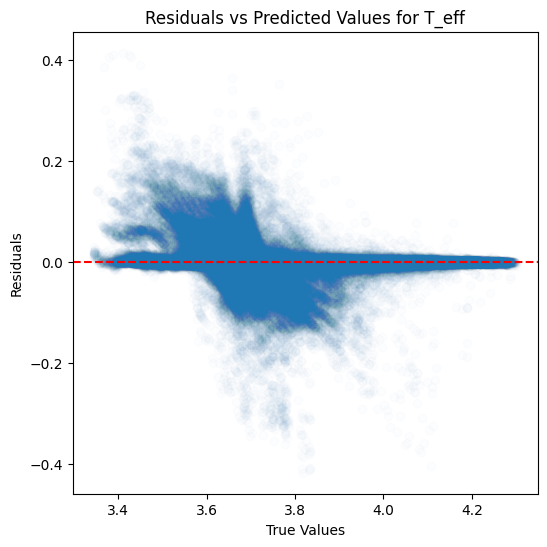

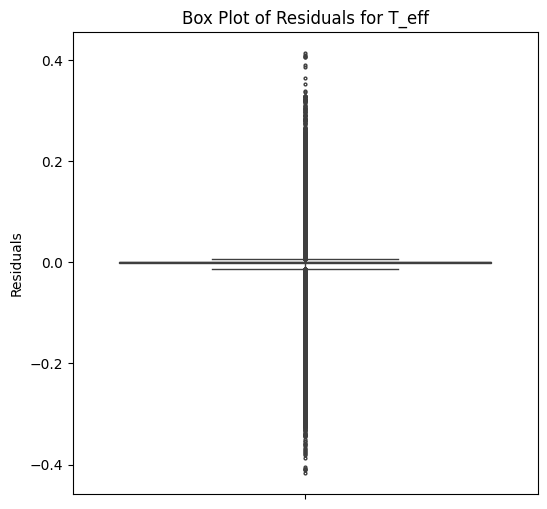

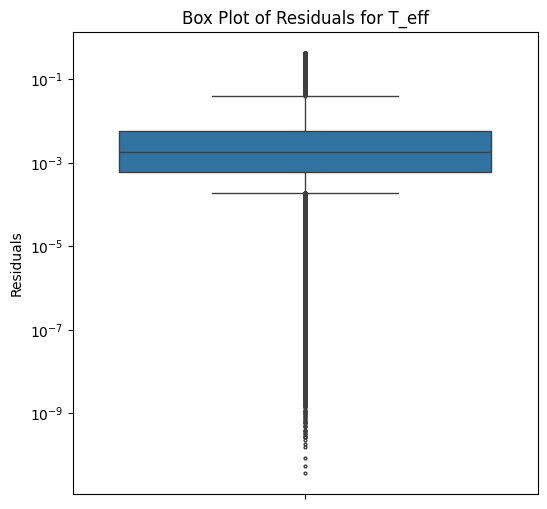

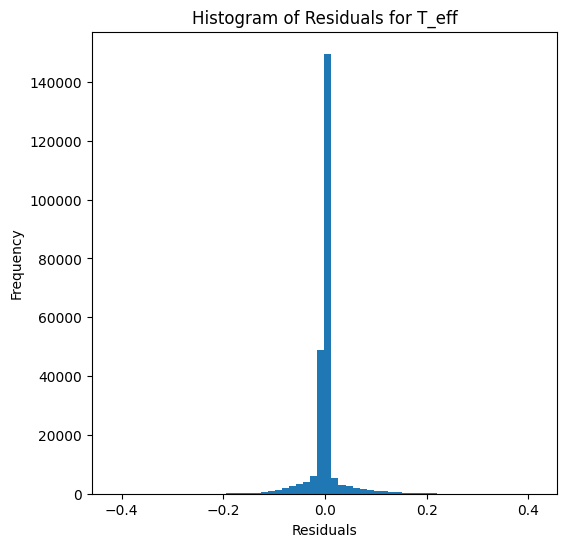

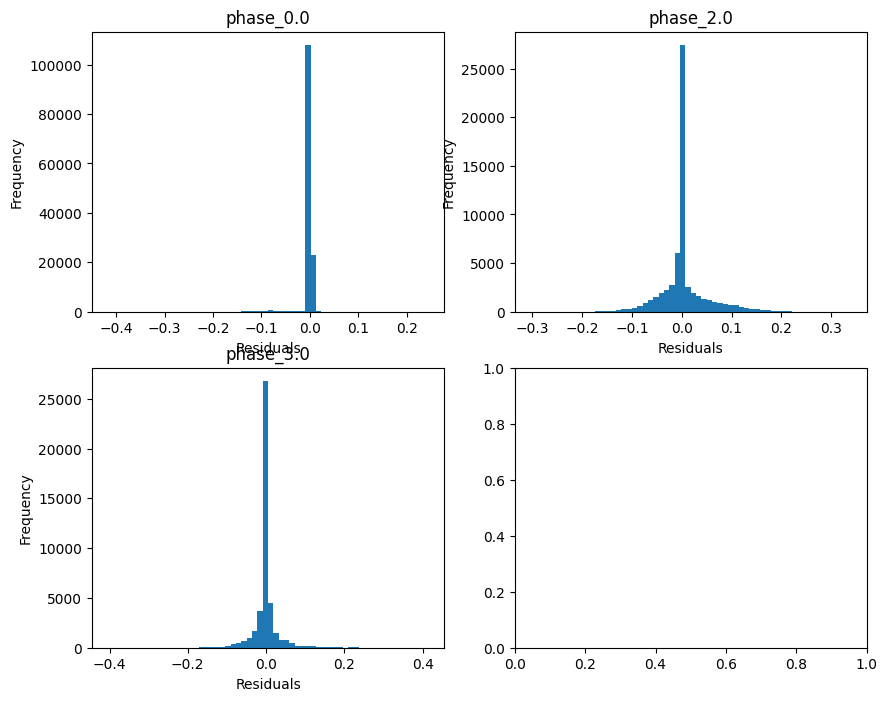

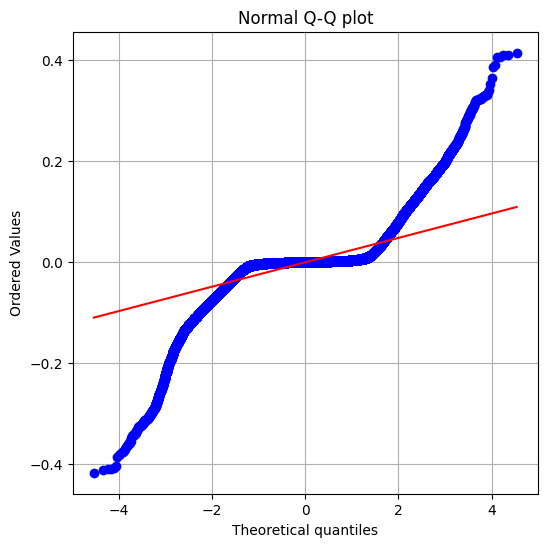

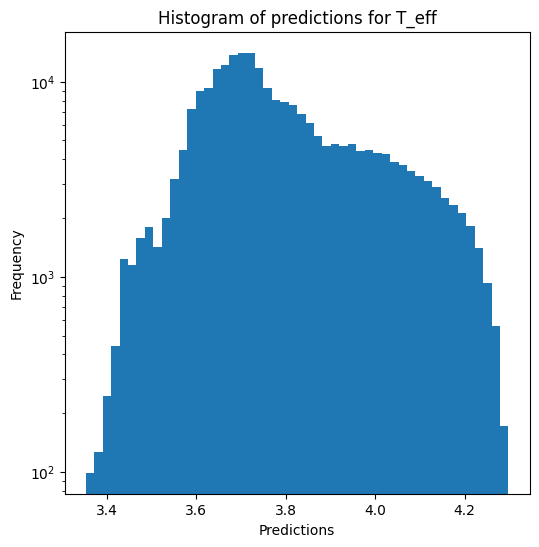

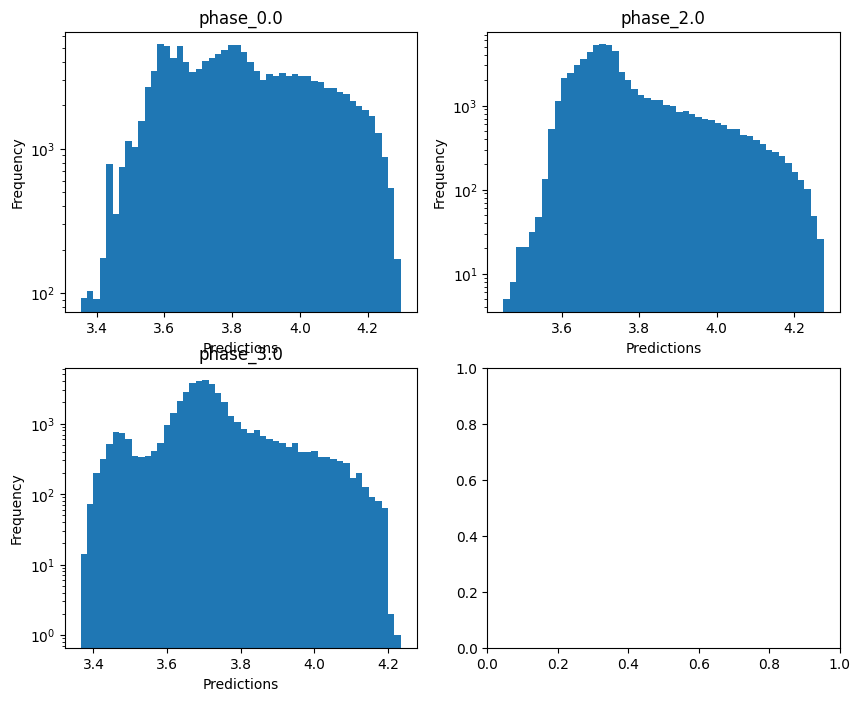


log_g results for the phase category with a value of 0.0
  value range :  3.379753170845917 - 5.433094523832443
  RVE :  -0.05205026633067278
  RMSE :  0.354687338283714
  MAE :  0.05666447248414129
  MedAE :  0.002684054907788891
  CORR :  0.7488648874287605
  MAX_ER :  5.5717651142751645
  Percentiles : 
    75th percentile :  0.005884896084797475
    90th percentile :  0.01220798952372988
    95th percentile :  0.021586313550291635
    99th percentile :  1.8865711488495918

log_g results for the phase category with a value of 2.0
  value range :  -0.2597443254273661 - 4.406128730397165
  RVE :  0.2590407279815474
  RMSE :  0.8274371745022455
  MAE :  0.48462556282854846
  MedAE :  0.09189485277647513
  CORR :  0.539920011518819
  MAX_ER :  4.28129677940808
  Percentiles : 
    75th percentile :  0.8041402773996895
    90th percentile :  1.4938142498384193
    95th percentile :  1.8990848400792277
    99th percentile :  2.710248255254376

log_g results for the phase category with a 

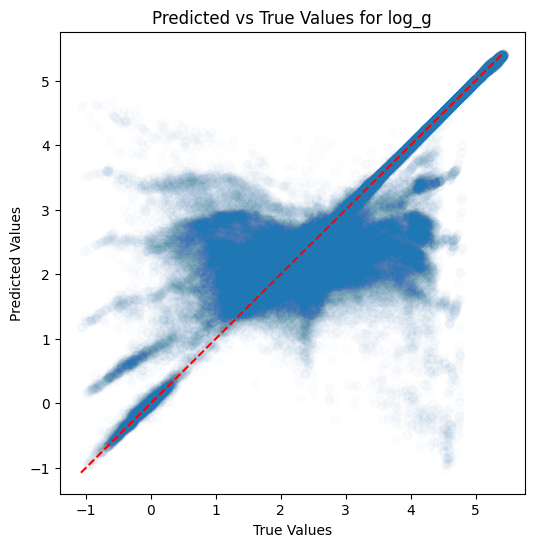

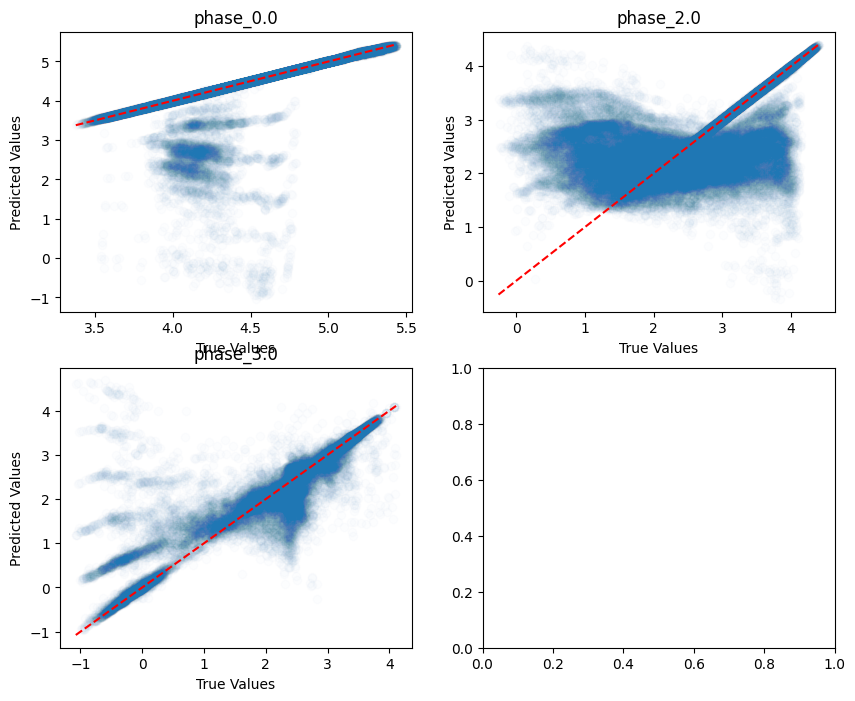

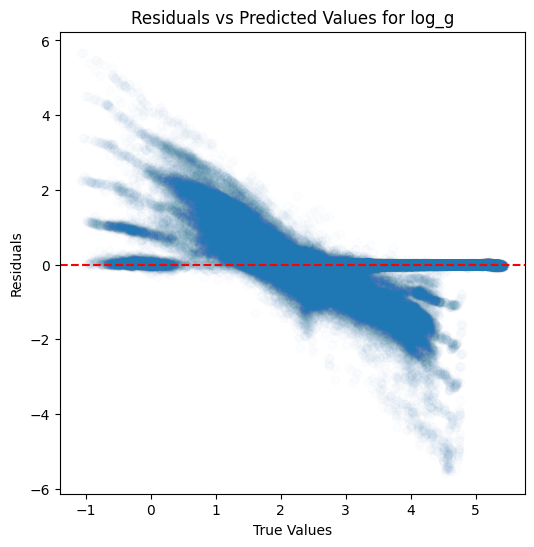

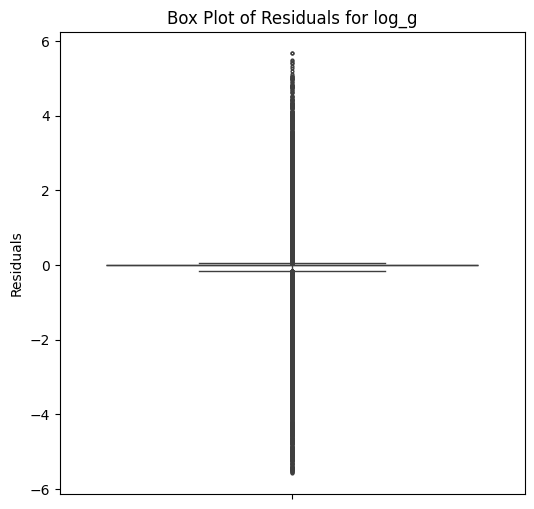

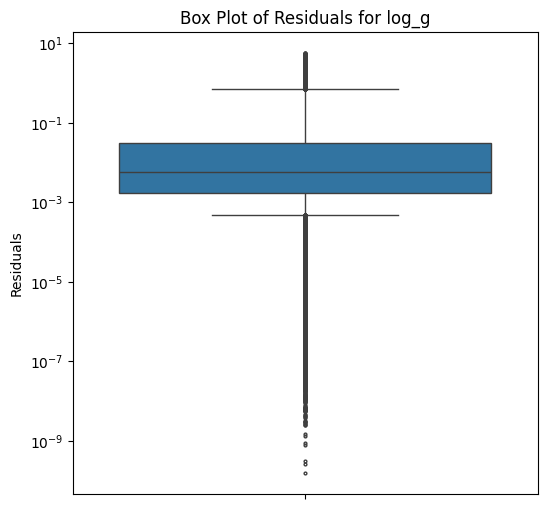

...

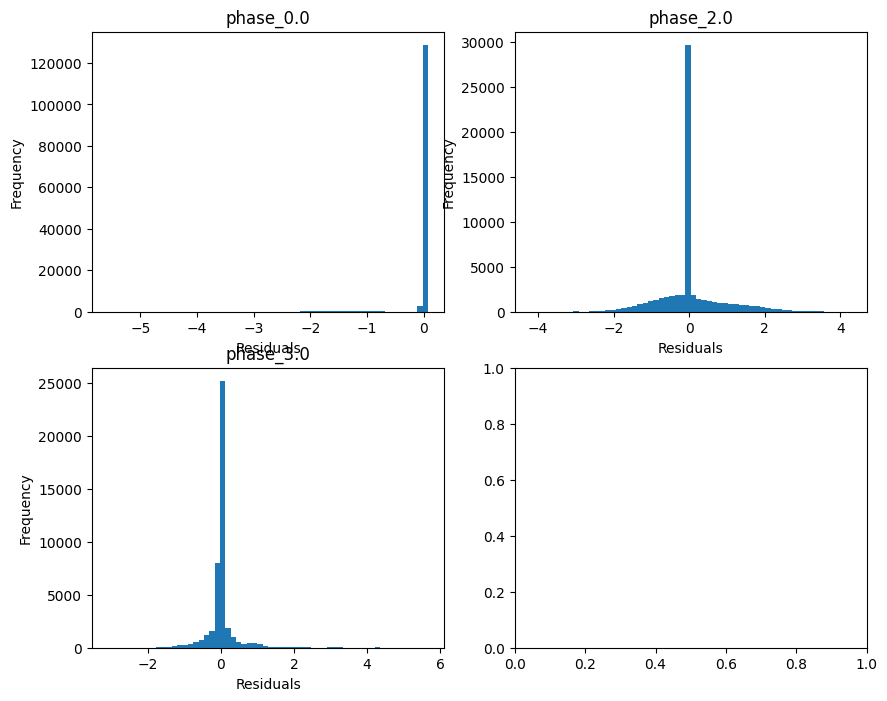

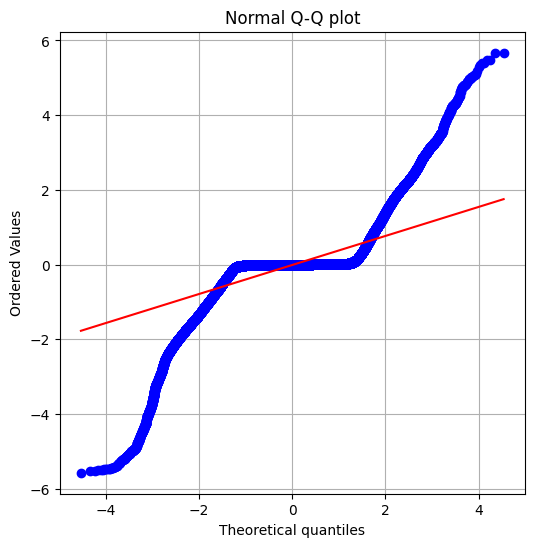

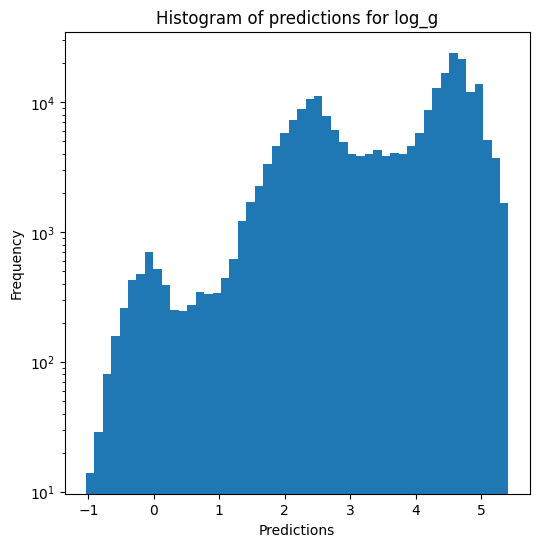

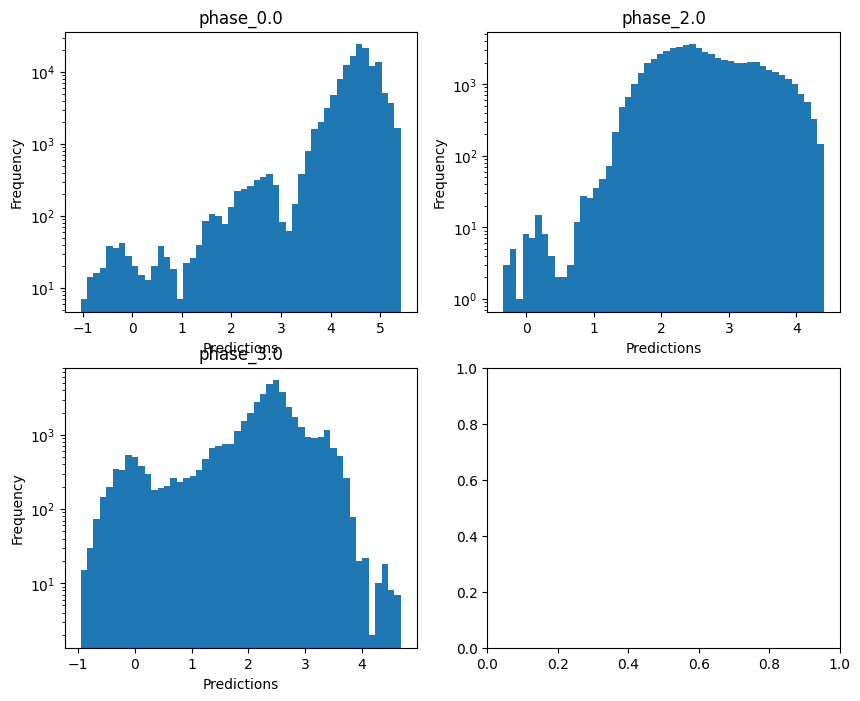

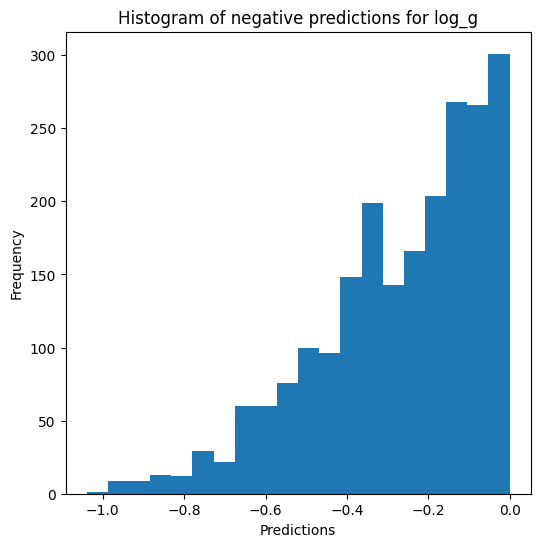


radius results for the phase category with a value of 0.0
  value range :  -0.9974747647513328 - 0.7629161677552769
  RVE :  0.6964623631952935
  RMSE :  0.17743722262404196
  MAE :  0.02991466753489129
  MedAE :  0.0022208192325675336
  CORR :  0.8839207964856702
  MAX_ER :  2.785300162256223
  Percentiles : 
    75th percentile :  0.004889486846599803
    90th percentile :  0.010391666058216033
    95th percentile :  0.020011339971819732
    99th percentile :  0.9435162769664501

radius results for the phase category with a value of 2.0
  value range :  0.0909920840275404 - 2.3291459066926827
  RVE :  0.19179709327537986
  RMSE :  0.4137100688423953
  MAE :  0.24231726872956497
  MedAE :  0.045946737162621654
  CORR :  0.49107973054923415
  MAX_ER :  2.140722166096797
  Percentiles : 
    75th percentile :  0.4020334250714487
    90th percentile :  0.7468678993615676
    95th percentile :  0.9494502639326257
    99th percentile :  1.3551531265261245

radius results for the phase cat

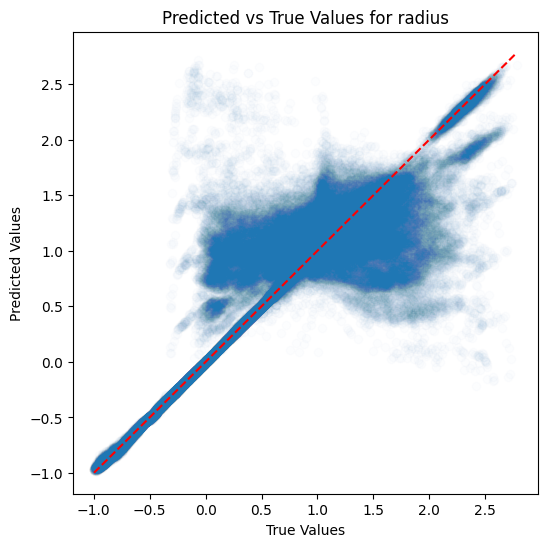

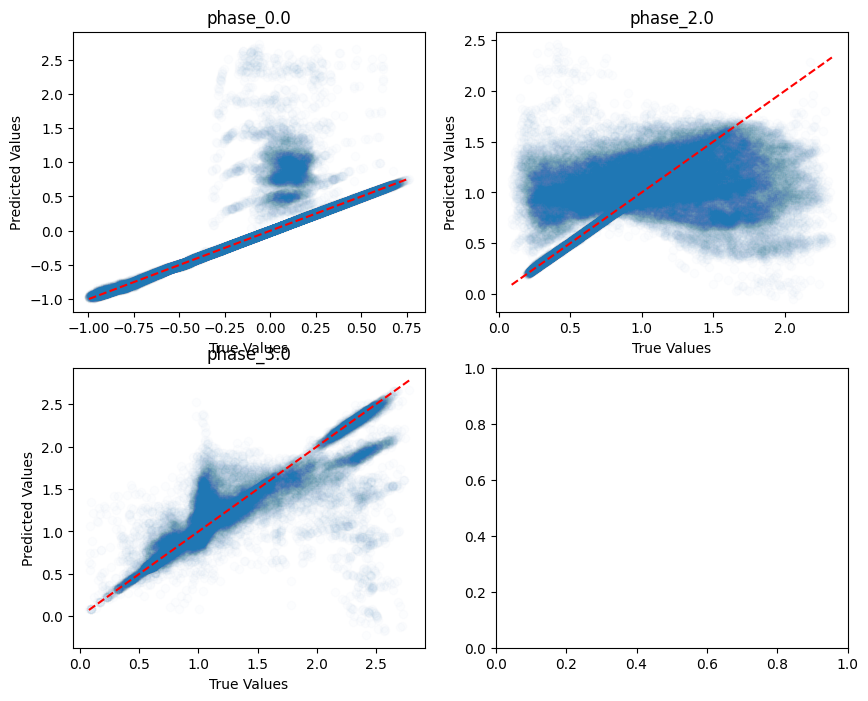

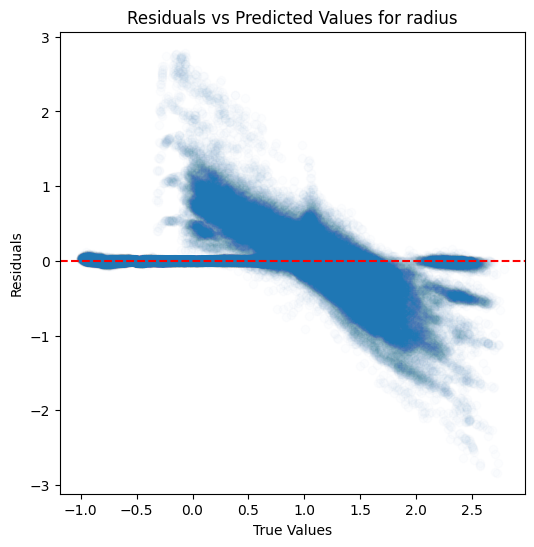

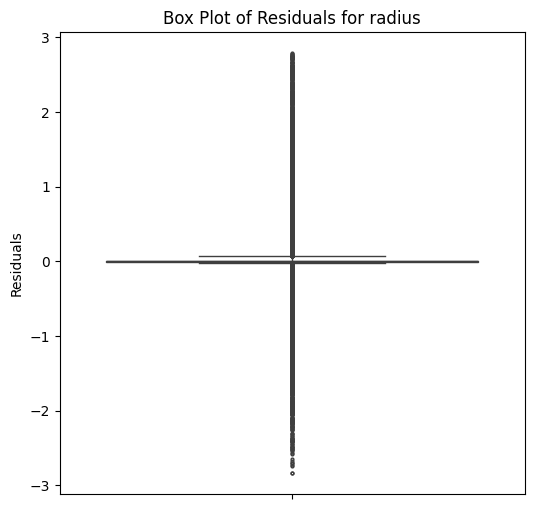

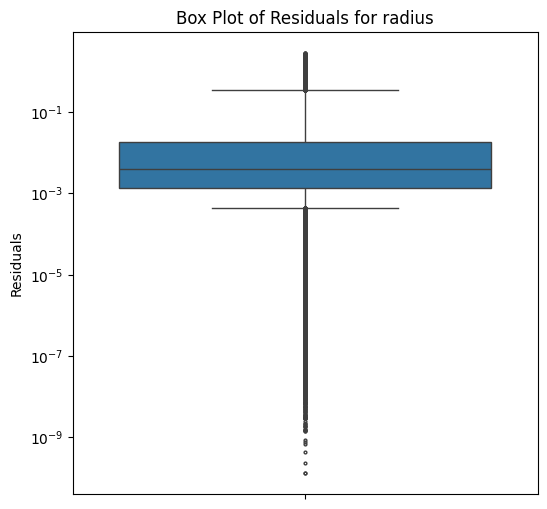

...

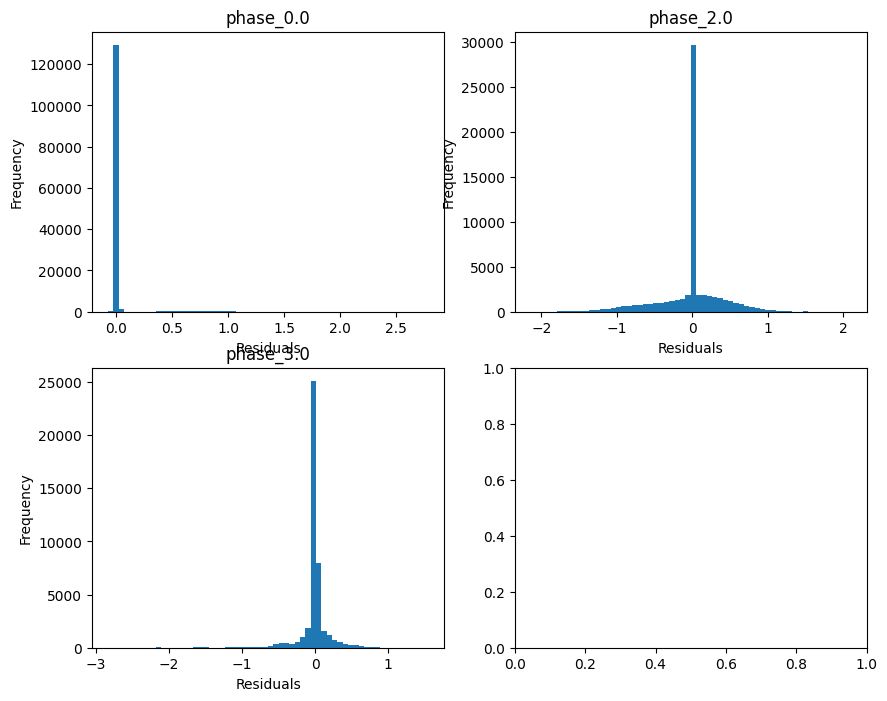

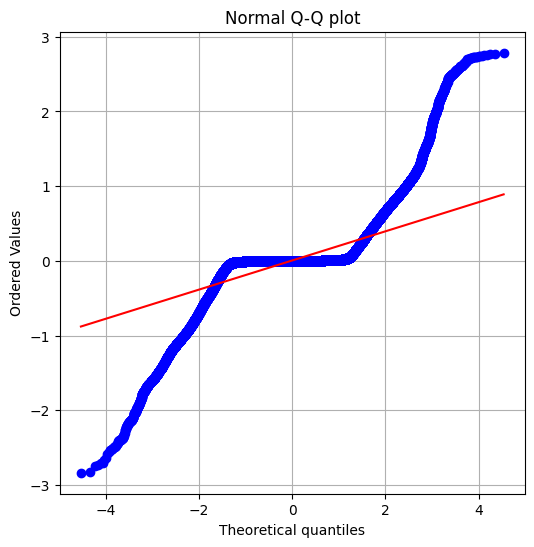

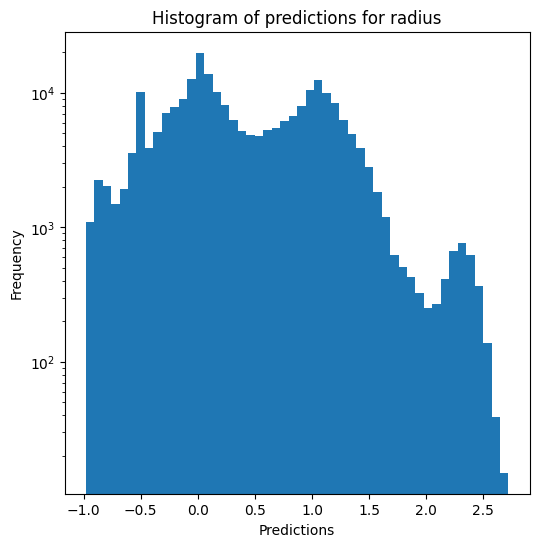

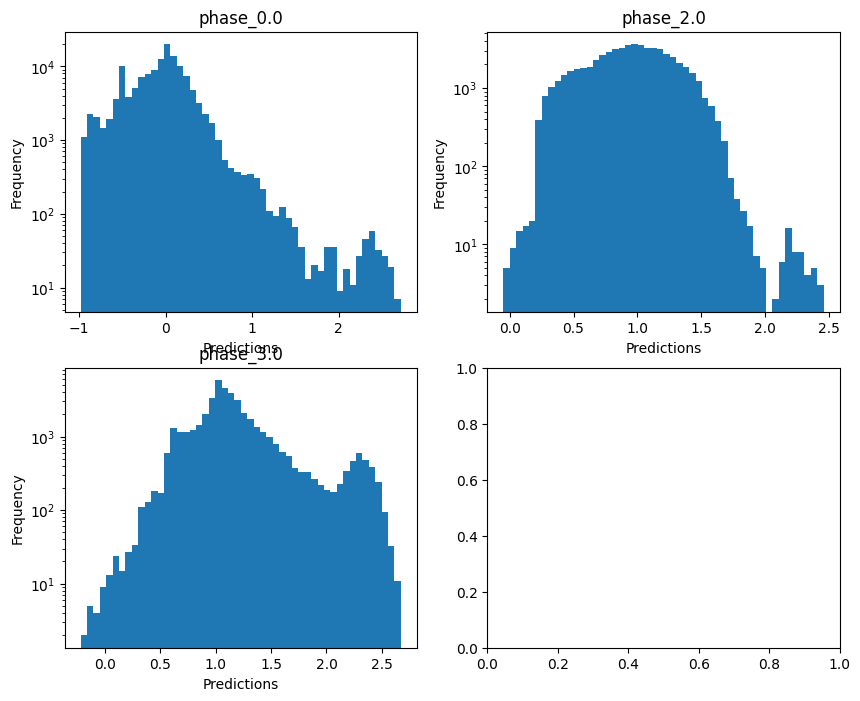

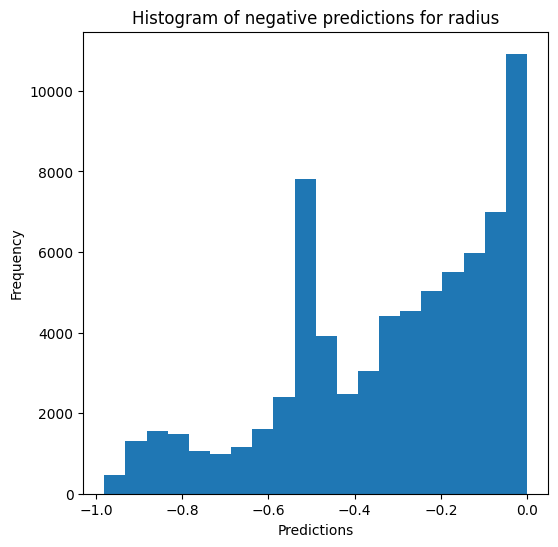

Saving predictions and results...


In [17]:
knn_evaluator.evaluate_Kfold_results(KNeighborsRegressor, X_train, y_train, categories_train, categories_name, path_to_predictions, tag, random_state=12, override=override, use_preds=use_preds, save=save, show=show)

### Random forests

In [18]:
rf_evaluator = Model_evaluator("random_forest", path=path_to_results, physical_model=physical_model, output_parameters=output_parameters)


mass_smaller_3 train data :
Performing K-fold...
Split 1 2 3 4 5 6 7 8 9 10 
Evaluating predictions...
no negative values

T_eff results for the phase category with a value of 0.0
  value range :  3.344668191350628 - 4.301337973559223
  RVE :  0.9864172611479274
  RMSE :  0.023428890000138425
  MAE :  0.004745165299288341
  MedAE :  0.0004912208934582107
  CORR :  0.9933472666103982
  MAX_ER :  0.4304447309004926
  Percentiles : 
    75th percentile :  0.001270070688262126
    90th percentile :  0.003584746882401648
    95th percentile :  0.010505427182339749
    99th percentile :  0.1303521238616474

T_eff results for the phase category with a value of 2.0
  value range :  3.431312032318489 - 4.276512878191396
  RVE :  0.8443175221366785
  RMSE :  0.056841819317567294
  MAE :  0.03266550624595124
  MedAE :  0.007840481716341774
  CORR :  0.9199738190842885
  MAX_ER :  0.30797713052461084
  Percentiles : 
    75th percentile :  0.04971586322873178
    90th percentile :  0.101923202332

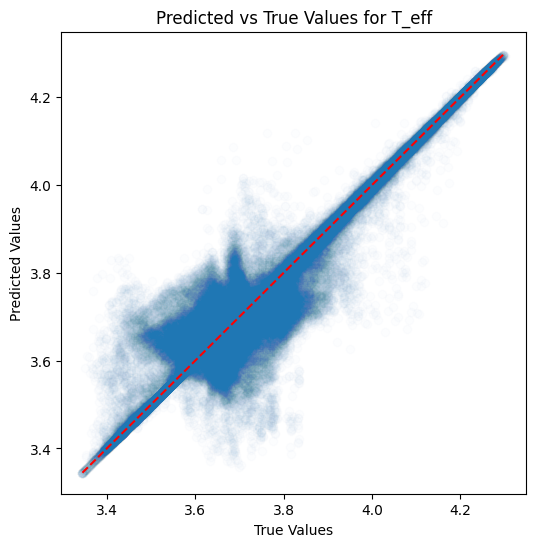

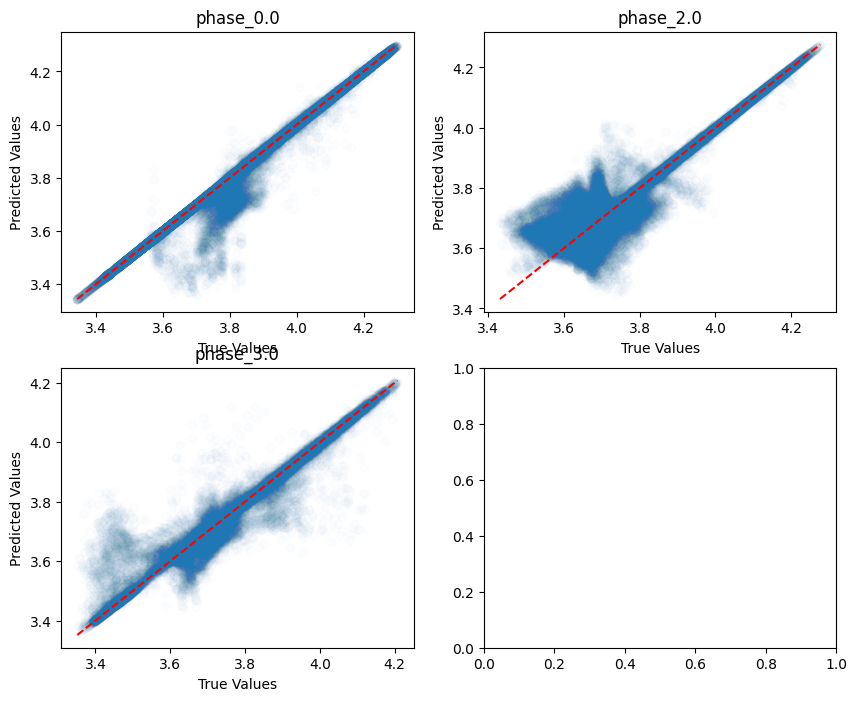

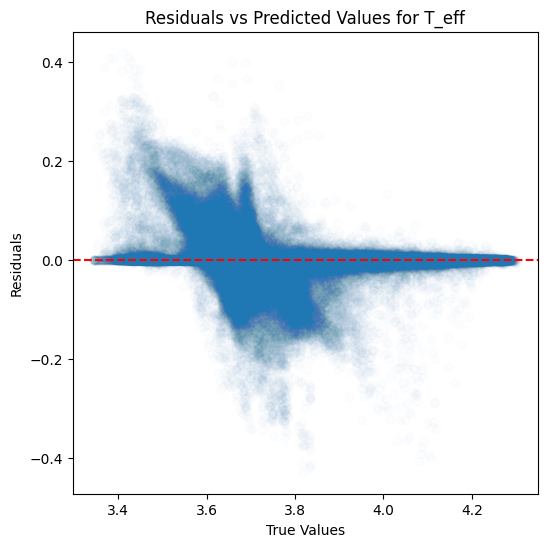

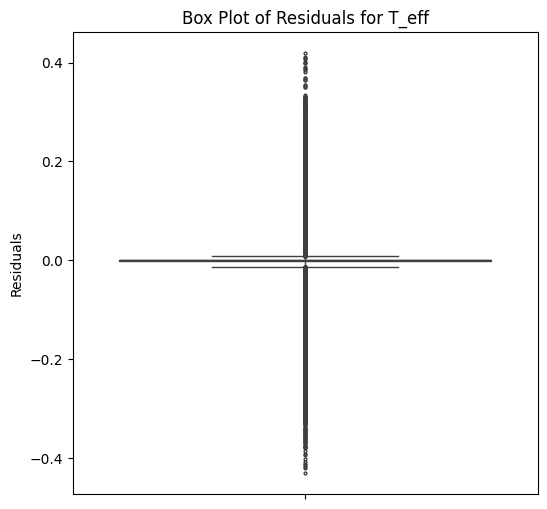

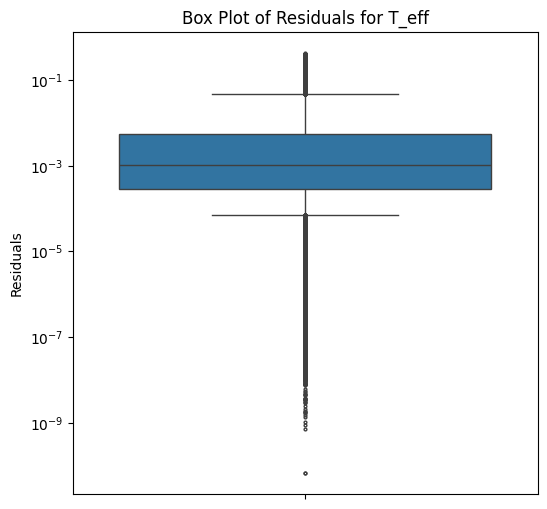

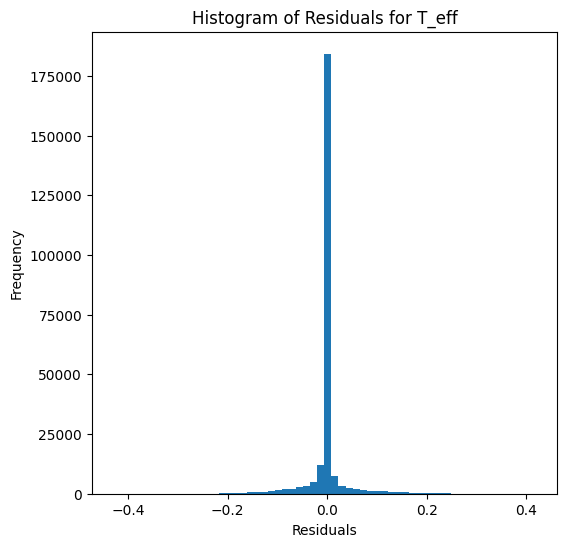

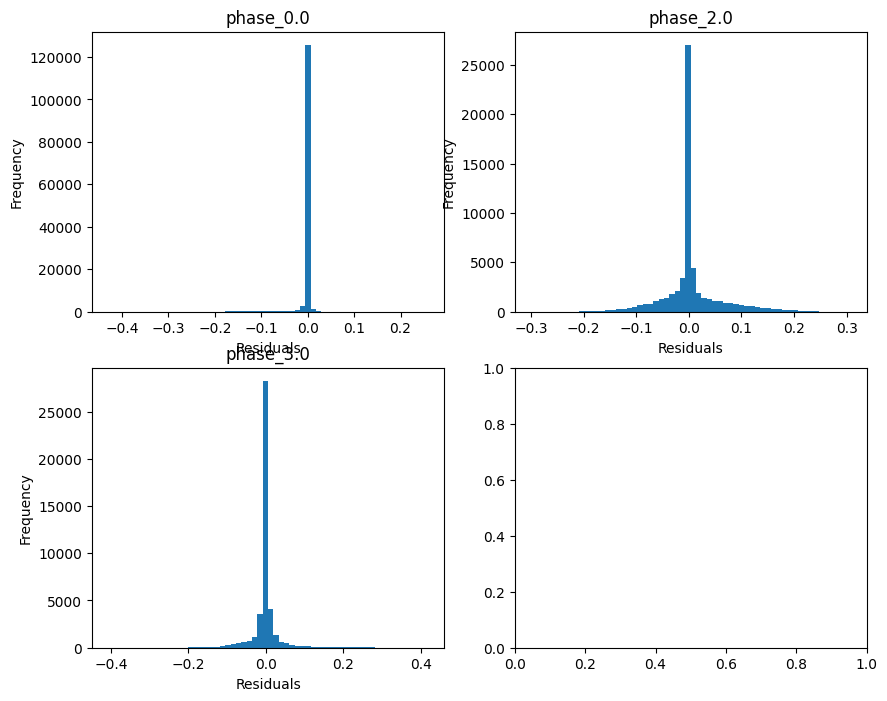

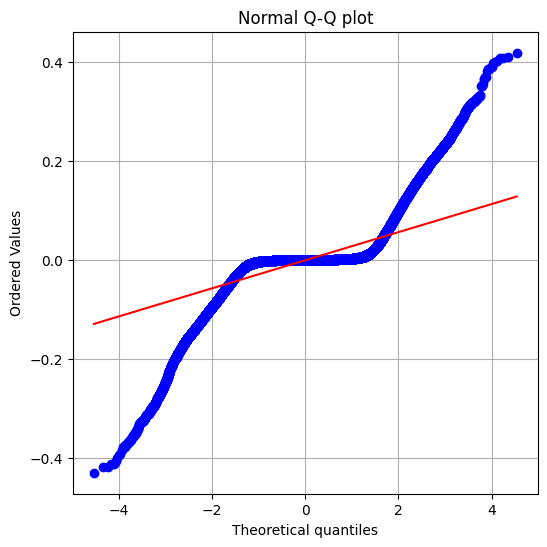

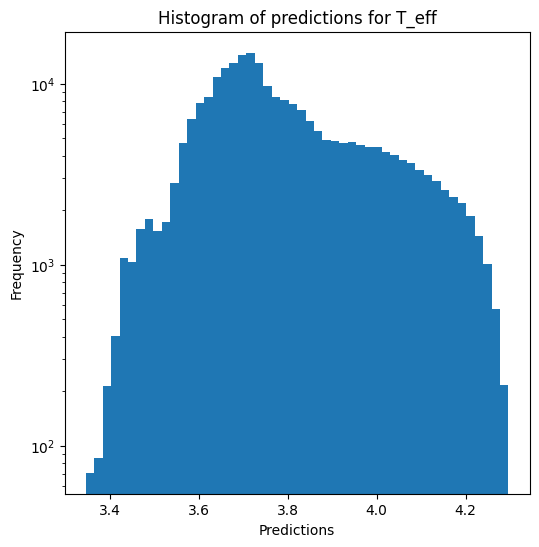

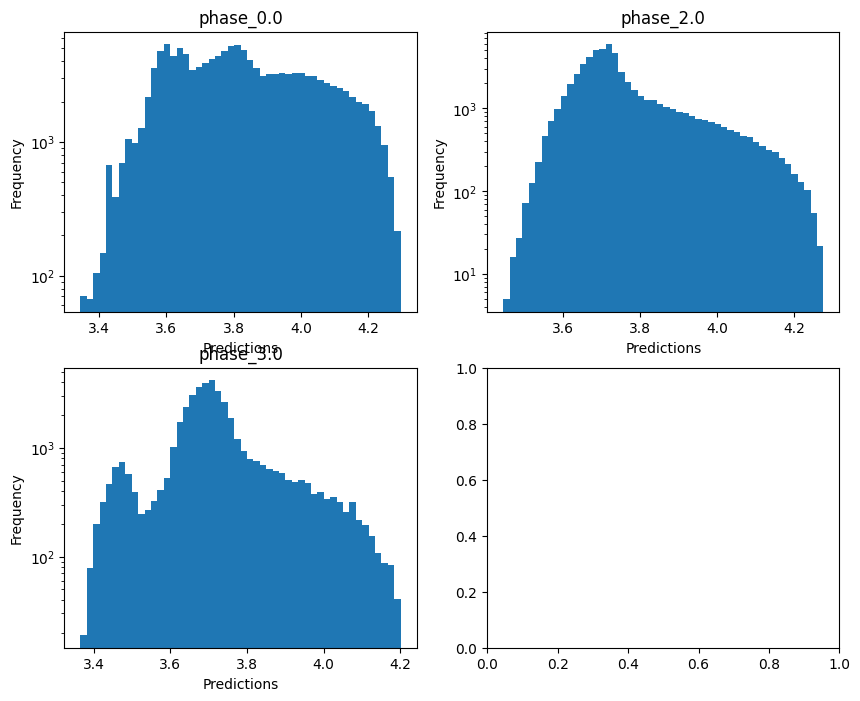


log_g results for the phase category with a value of 0.0
  value range :  3.379753170845917 - 5.433094523832443
  RVE :  -0.2951054665192323
  RMSE :  0.394415145844577
  MAE :  0.06635886549712658
  MedAE :  0.0013662792684856484
  CORR :  0.72688968985791
  MAX_ER :  5.546993404891104
  Percentiles : 
    75th percentile :  0.0035346118014745187
    90th percentile :  0.010879873826416557
    95th percentile :  0.07419315738776688
    99th percentile :  2.3182430359344828

log_g results for the phase category with a value of 2.0
  value range :  -0.2597443254273661 - 4.406128730397165
  RVE :  -0.09774314204530898
  RMSE :  1.006963887471354
  MAE :  0.5898172499752206
  MedAE :  0.10402381136715633
  CORR :  0.3341023253485054
  MAX_ER :  4.419340340071888
  Percentiles : 
    75th percentile :  0.9985940421321021
    90th percentile :  1.8557701460000484
    95th percentile :  2.332490647200731
    99th percentile :  3.2062905264917836

log_g results for the phase category with a 

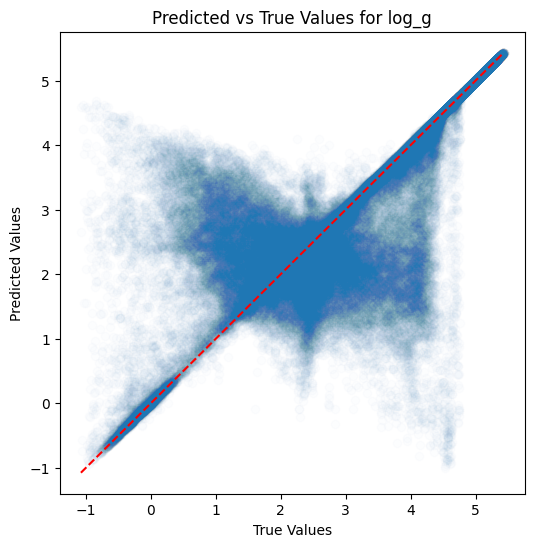

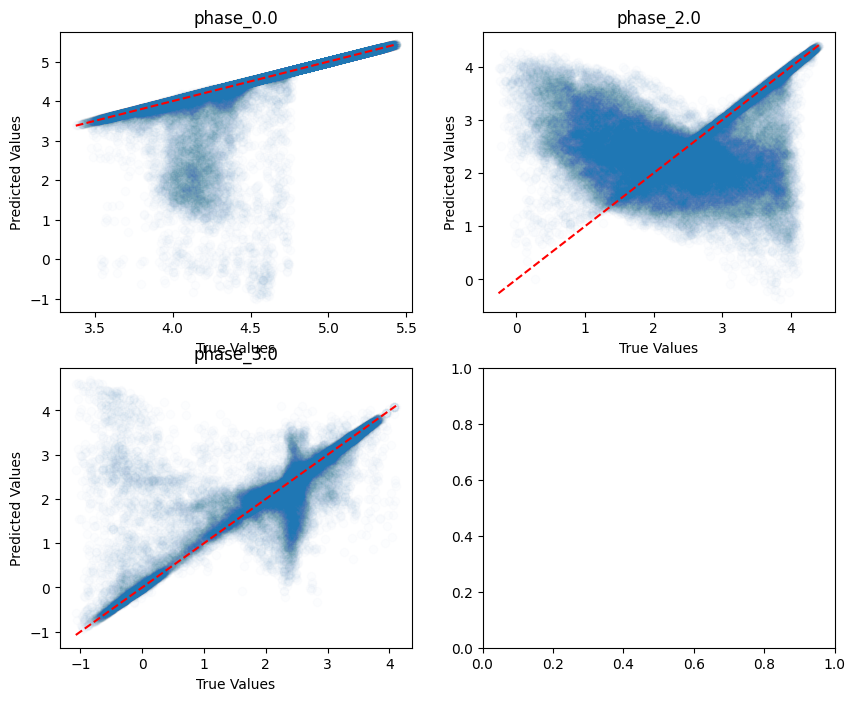

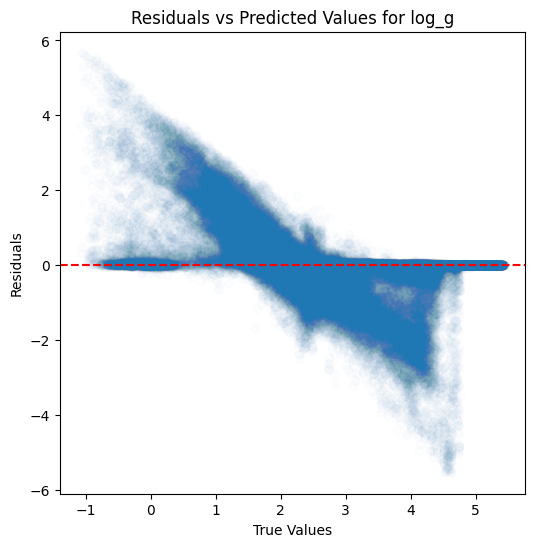

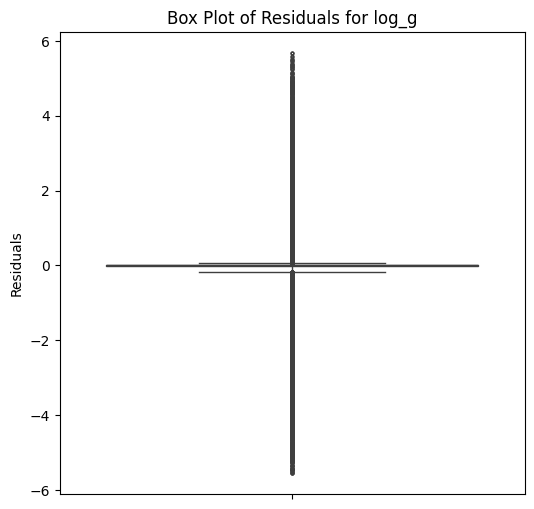

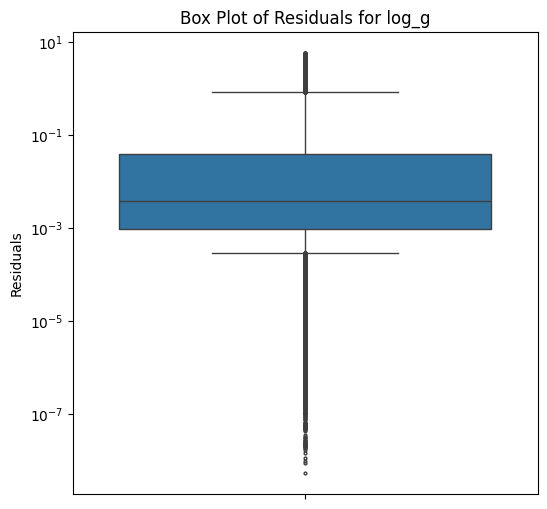

...

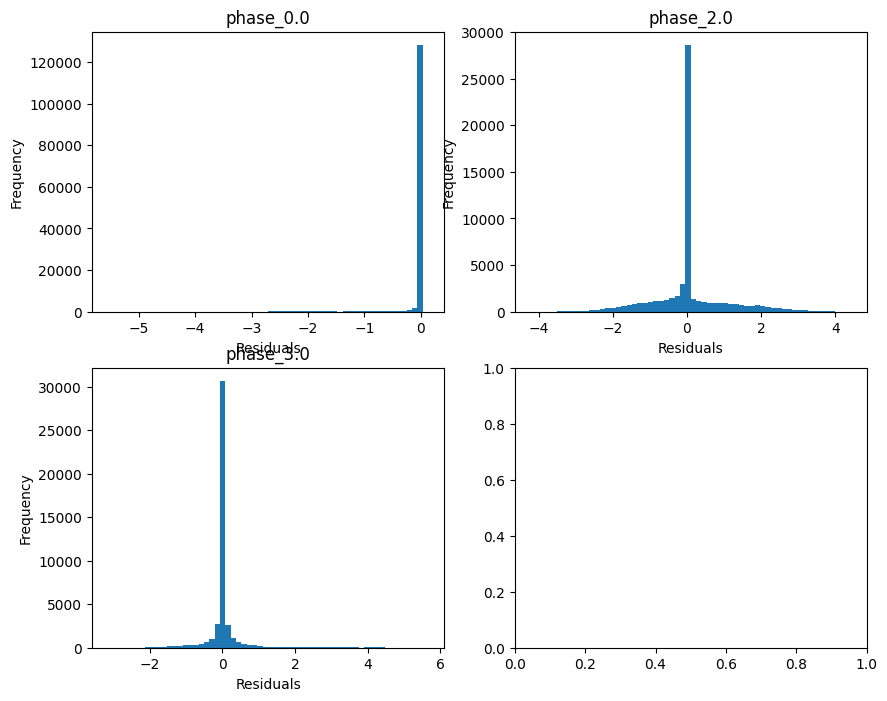

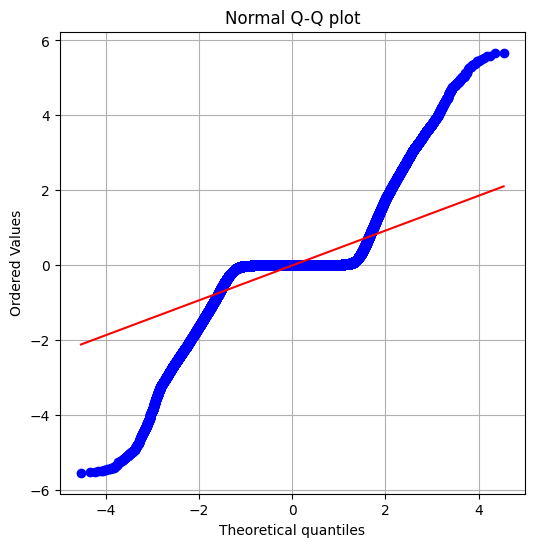

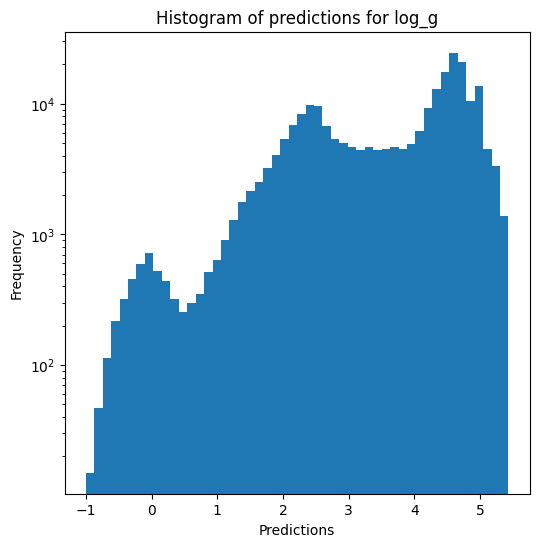

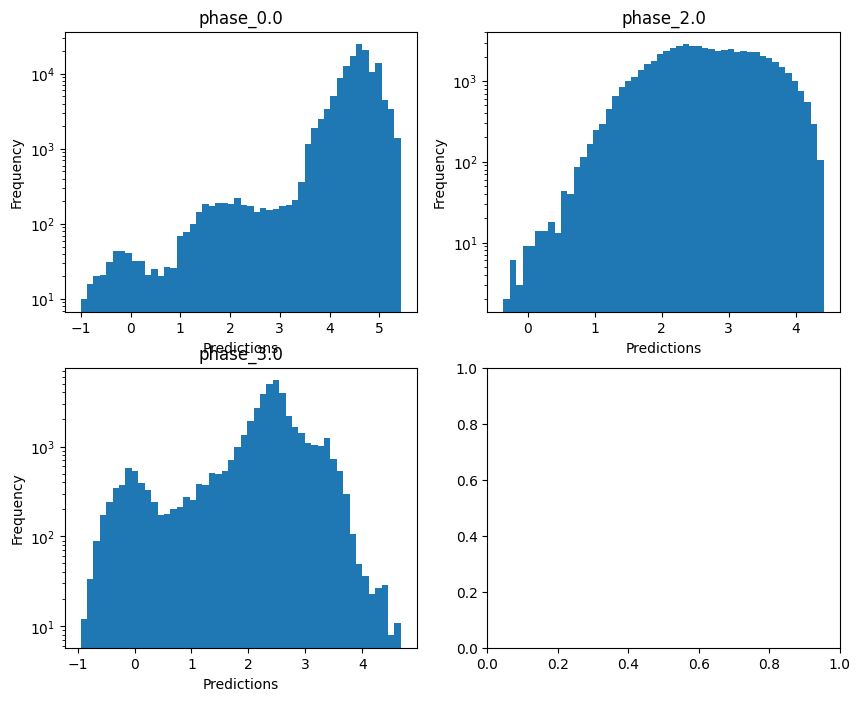

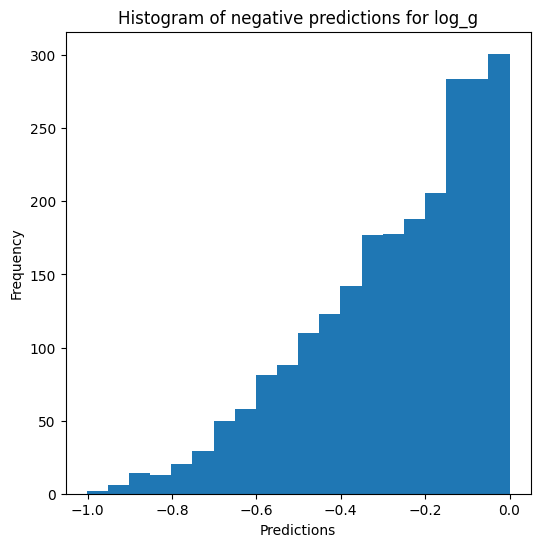


radius results for the phase category with a value of 0.0
  value range :  -0.9974747647513328 - 0.7629161677552769
  RVE :  0.6267123490082731
  RMSE :  0.197219172480096
  MAE :  0.033371489686278115
  MedAE :  0.0008521948397472862
  CORR :  0.8656451900394606
  MAX_ER :  2.774248428371308
  Percentiles : 
    75th percentile :  0.002131214895097499
    90th percentile :  0.00592867603640408
    95th percentile :  0.03728549530018552
    99th percentile :  1.1590174028956868

radius results for the phase category with a value of 2.0
  value range :  0.0909920840275404 - 2.3291459066926827
  RVE :  -0.19734173176697278
  RMSE :  0.5034671257050329
  MAE :  0.29490524023072257
  MedAE :  0.05204918211463749
  CORR :  0.27291659304747523
  MAX_ER :  2.209601184348118
  Percentiles : 
    75th percentile :  0.49930552308088405
    90th percentile :  0.9277334330966613
    95th percentile :  1.1662993007680849
    99th percentile :  1.6031884943331094

radius results for the phase categ

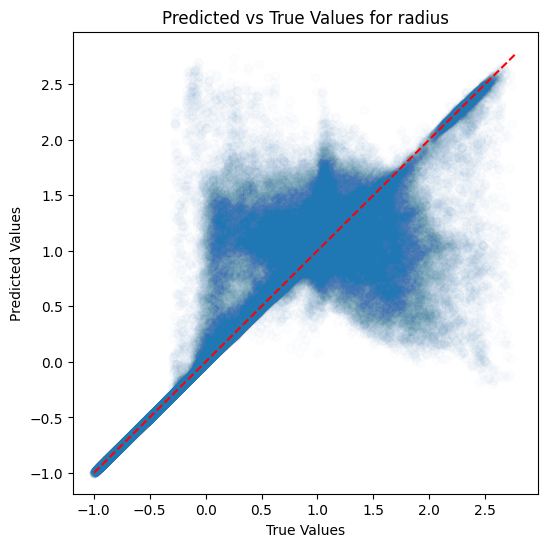

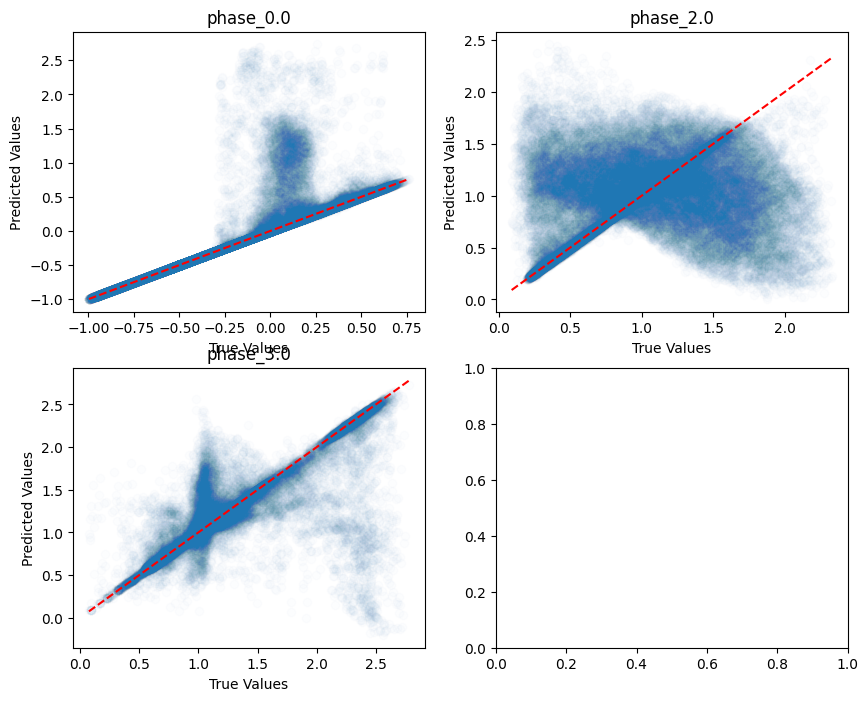

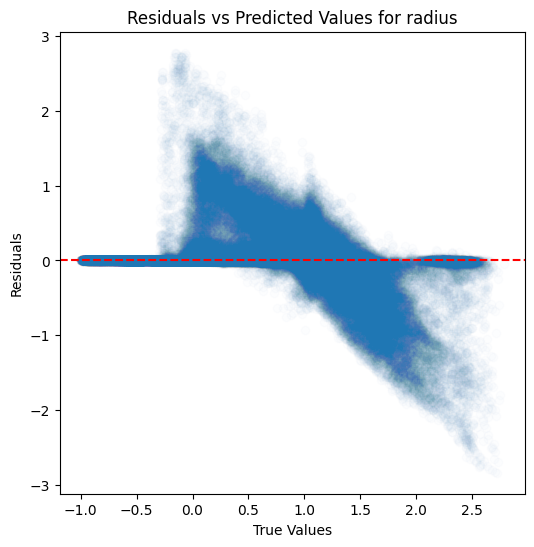

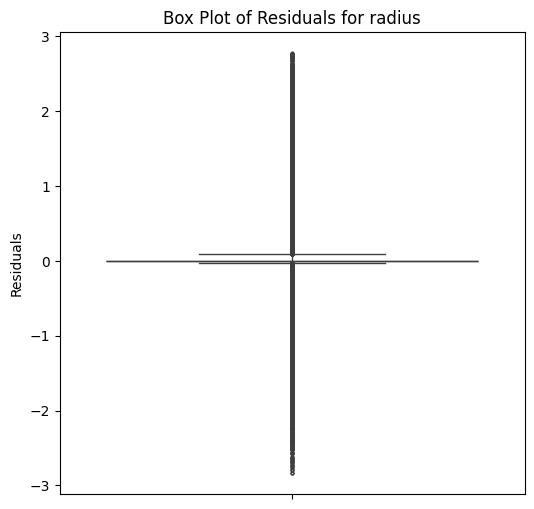

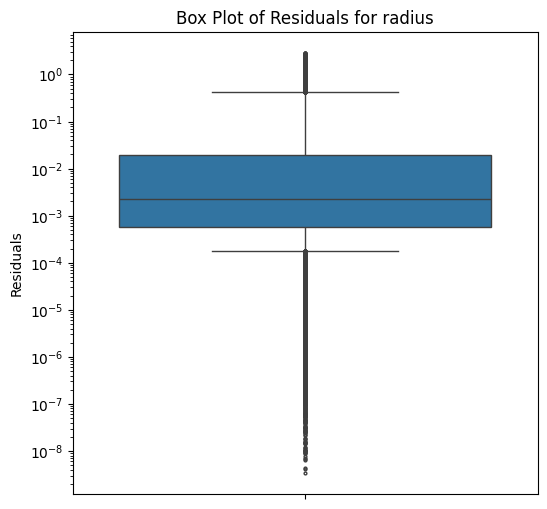

...

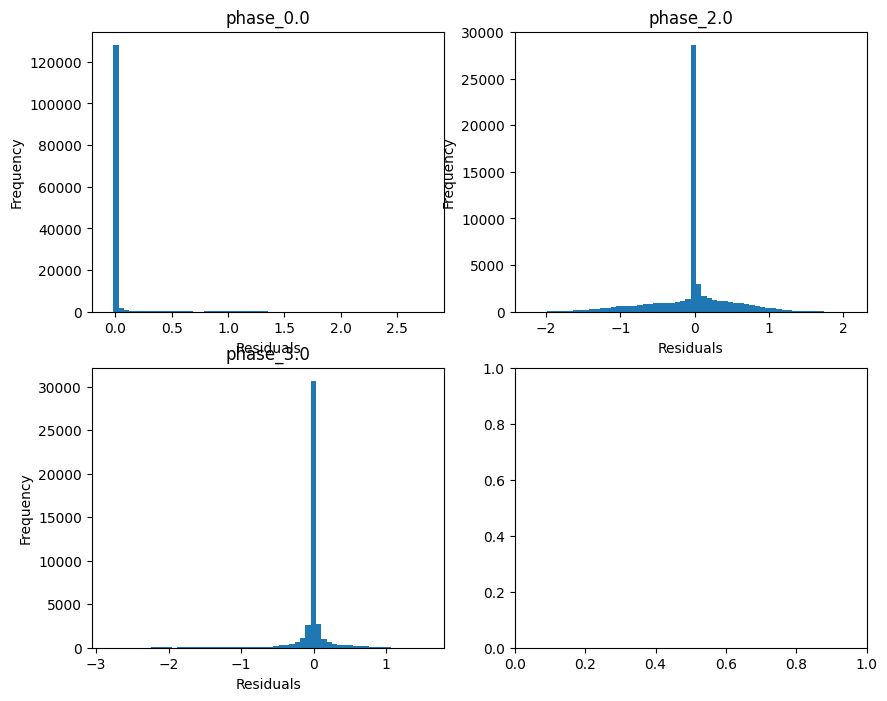

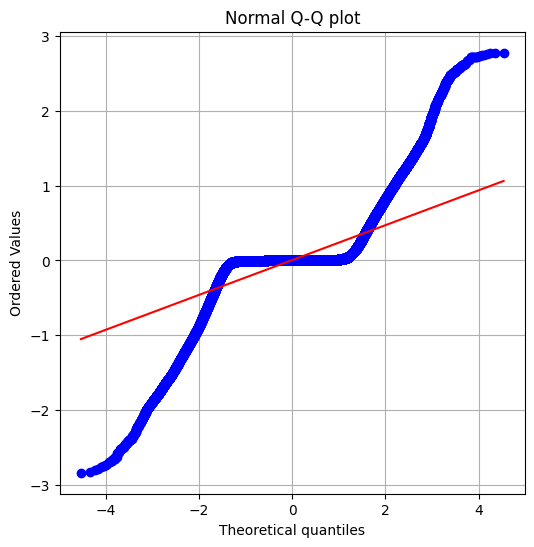

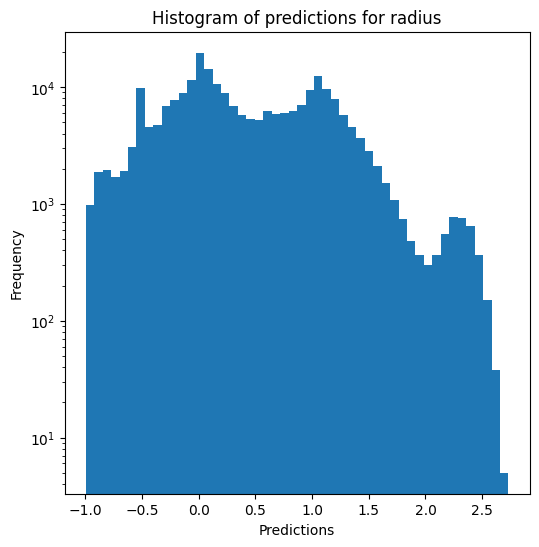

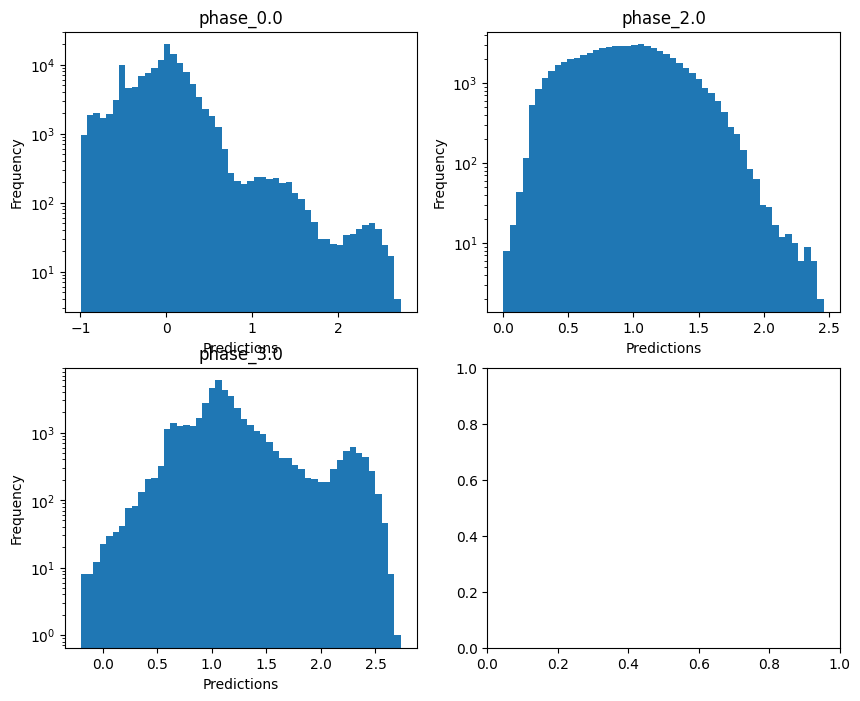

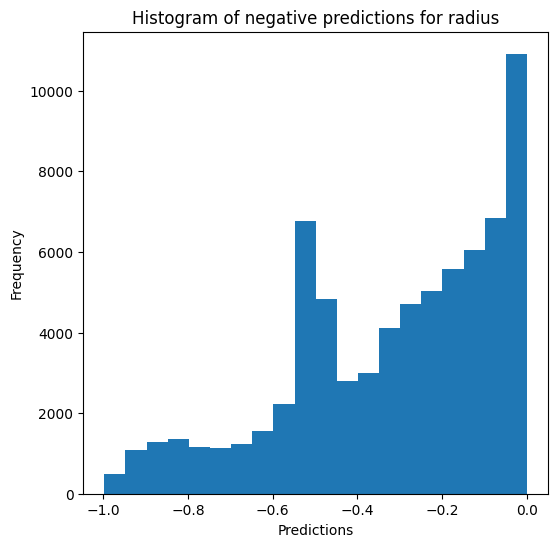

Saving predictions and results...


In [19]:
rf_evaluator.evaluate_Kfold_results(RandomForestRegressor, X_train, y_train, categories_train, categories_name, path_to_predictions, tag, random_state=12, override=override, use_preds=use_preds, save=save, show=show, n_jobs=5)

### XGBoost

In [20]:
xgb_evaluator = Model_evaluator("xgboost", path=path_to_results, physical_model=physical_model, output_parameters=output_parameters)


mass_smaller_3 train data :
Performing K-fold...
Split 1 2 3 4 5 6 7 8 9 10 
Evaluating predictions...
no negative values

T_eff results for the phase category with a value of 0.0
  value range :  3.344668191350628 - 4.301337973559223
  RVE :  0.9588482762319545
  RMSE :  0.04323838644697495
  MAE :  0.022675098648489114
  MedAE :  0.006645159370916254
  CORR :  0.9792113931887088
  MAX_ER :  0.2938689709645552
  Percentiles : 
    75th percentile :  0.02134982552832354
    90th percentile :  0.07711332522421231
    95th percentile :  0.10588594922923464
    99th percentile :  0.1685552237884878

T_eff results for the phase category with a value of 2.0
  value range :  3.431312032318489 - 4.276512878191396
  RVE :  0.7592626599586636
  RMSE :  0.07337089853019937
  MAE :  0.0588392409831988
  MedAE :  0.05041077801122862
  CORR :  0.871673336645556
  MAX_ER :  0.26120107132052395
  Percentiles : 
    75th percentile :  0.08530131197983226
    90th percentile :  0.12112674659368317
   

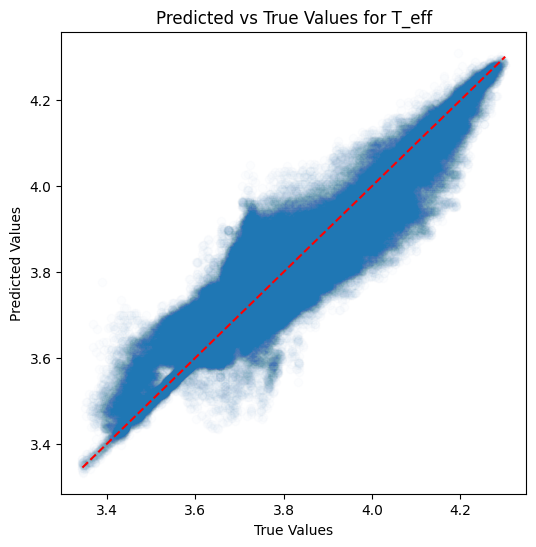

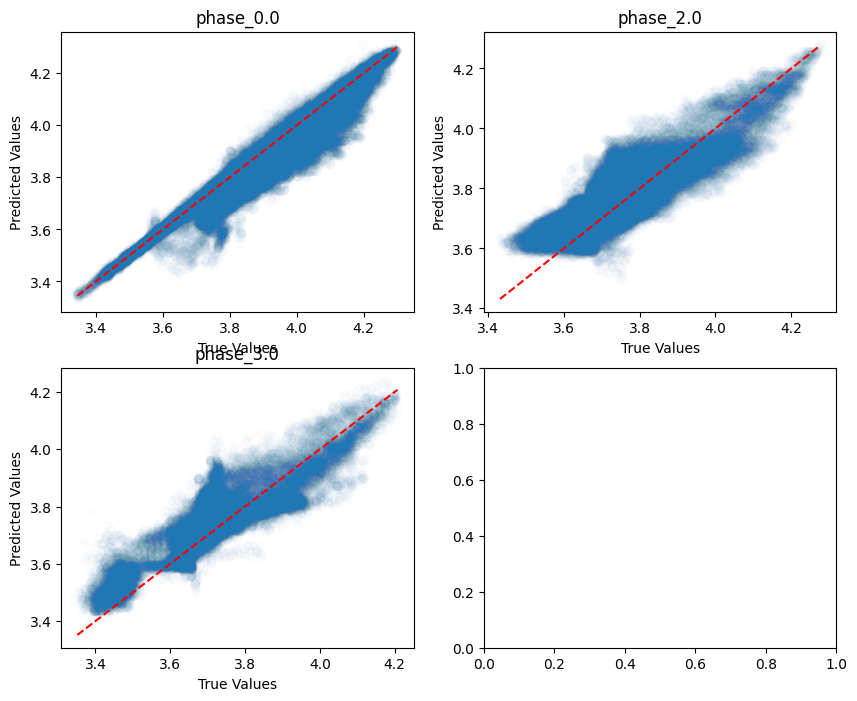

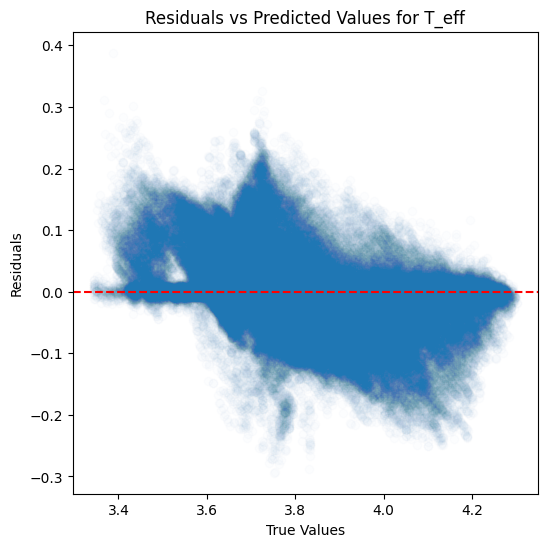

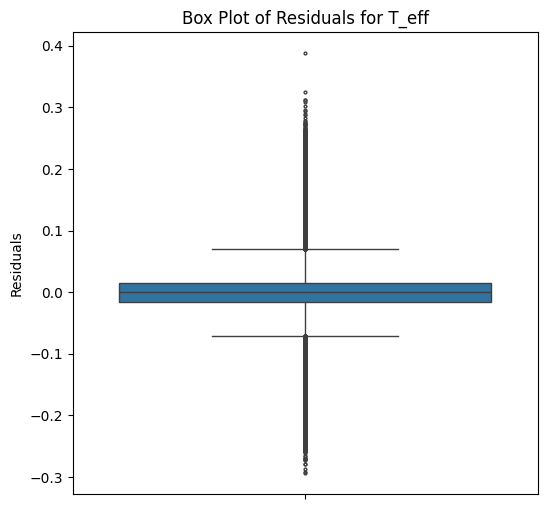

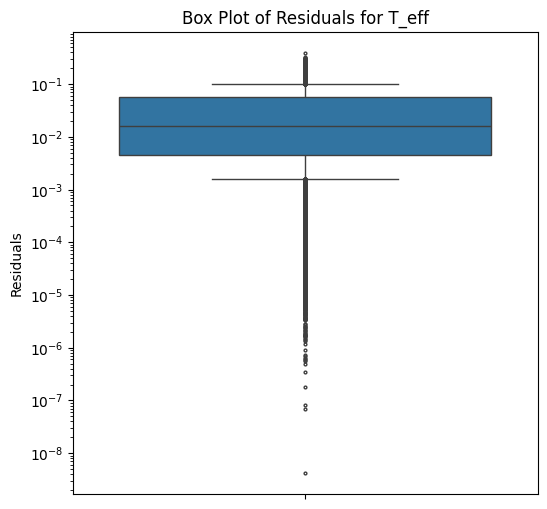

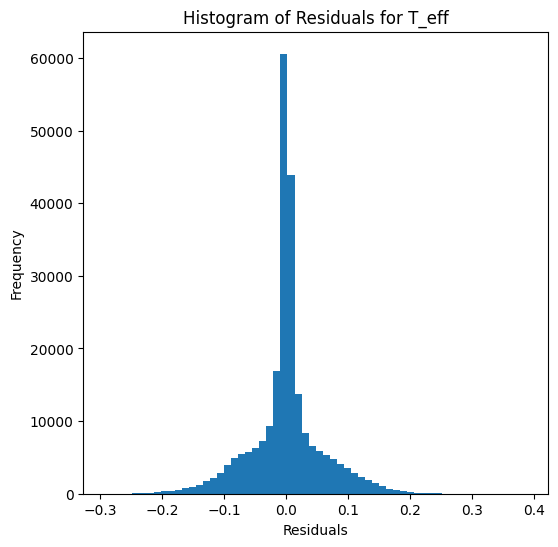

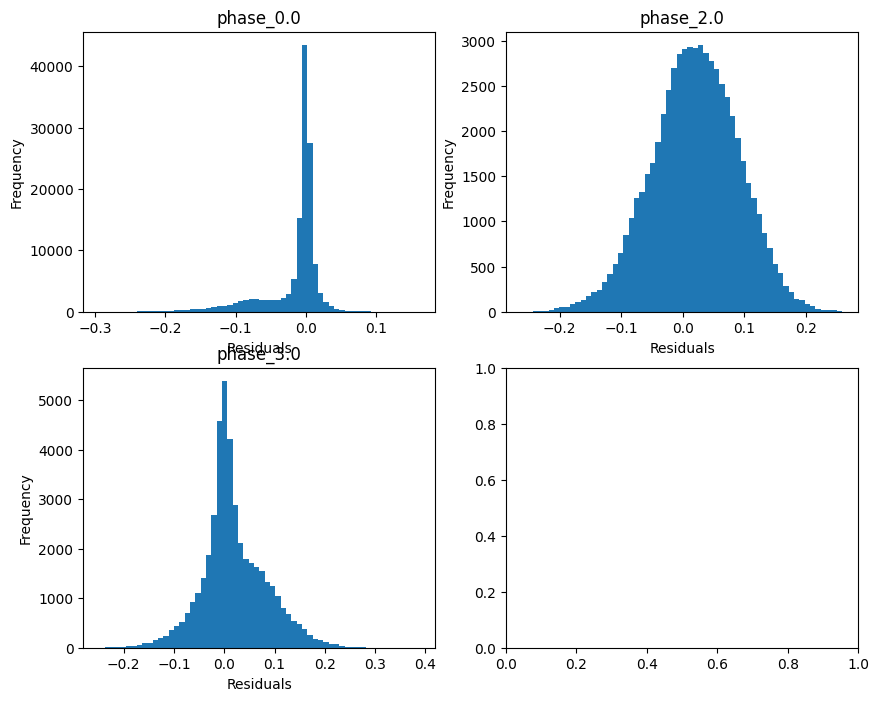

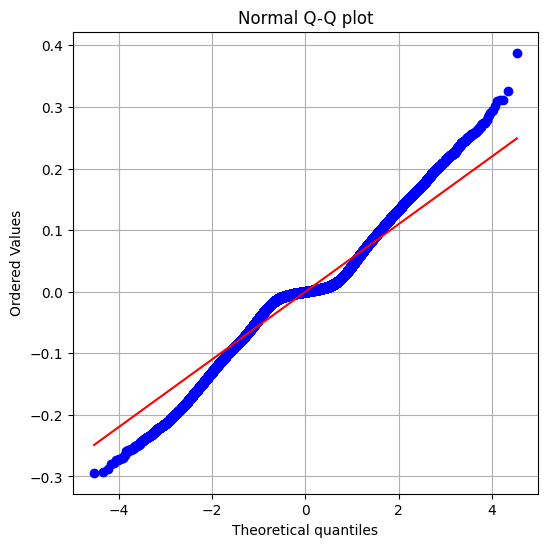

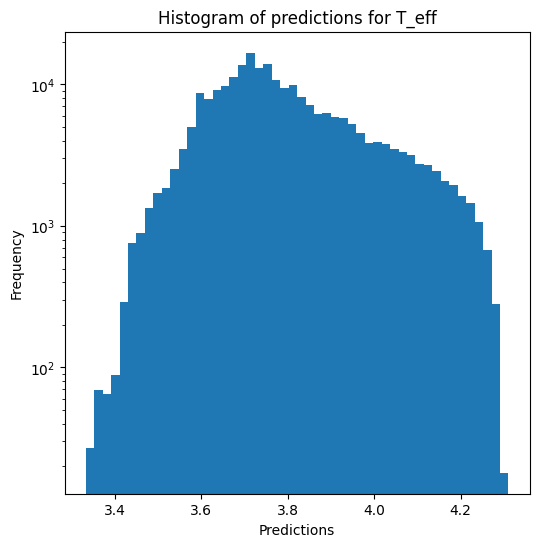

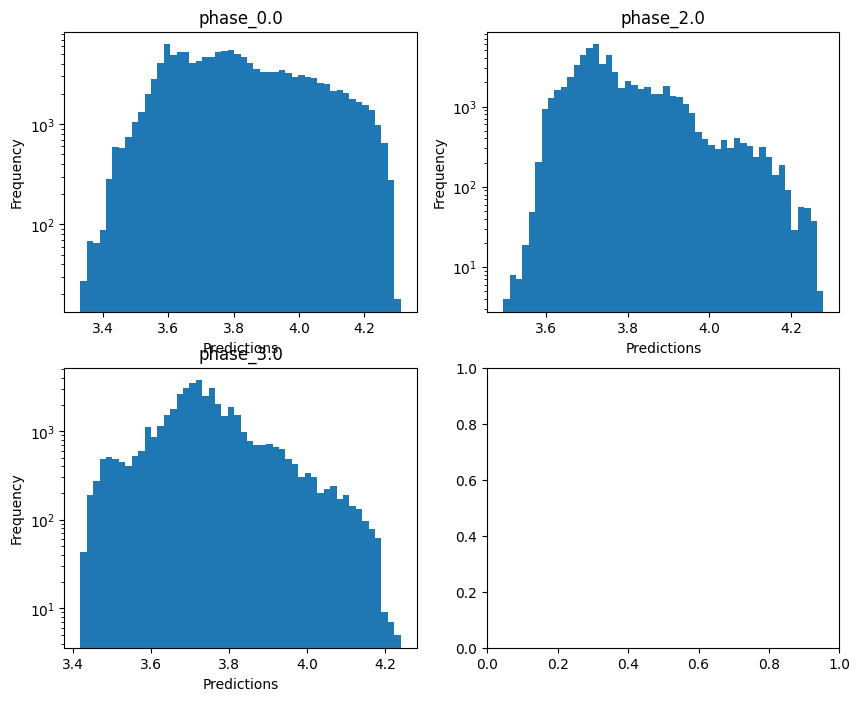


log_g results for the phase category with a value of 0.0
  value range :  3.379753170845917 - 5.433094523832443
  RVE :  -0.48240618124680723
  RMSE :  0.4417878986027634
  MAE :  0.19891439168600883
  MedAE :  0.040432315687660925
  CORR :  0.8157995353707765
  MAX_ER :  5.186767821059423
  Percentiles : 
    75th percentile :  0.17149730757815407
    90th percentile :  0.6063120906548877
    95th percentile :  1.0007149460927511
    99th percentile :  1.7292495572812174

log_g results for the phase category with a value of 2.0
  value range :  -0.2597443254273661 - 4.406128730397165
  RVE :  0.29738900211887476
  RMSE :  0.813362303255756
  MAE :  0.624985260247418
  MedAE :  0.487072678834938
  CORR :  0.5462072880360849
  MAX_ER :  3.7897491555663985
  Percentiles : 
    75th percentile :  0.8877562233303815
    90th percentile :  1.3646722013898192
    95th percentile :  1.673972649211245
    99th percentile :  2.2724404803323175

log_g results for the phase category with a value

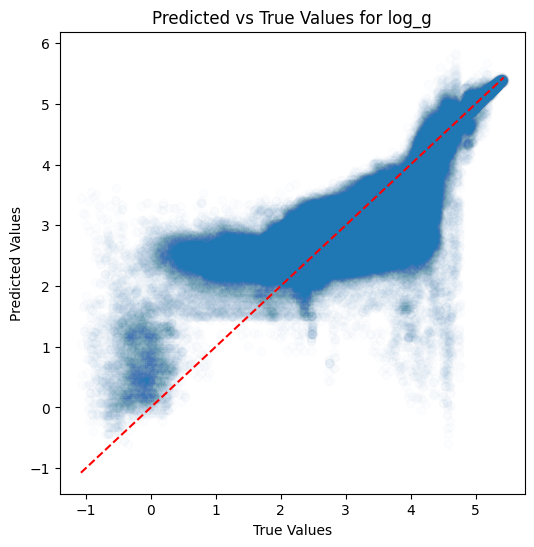

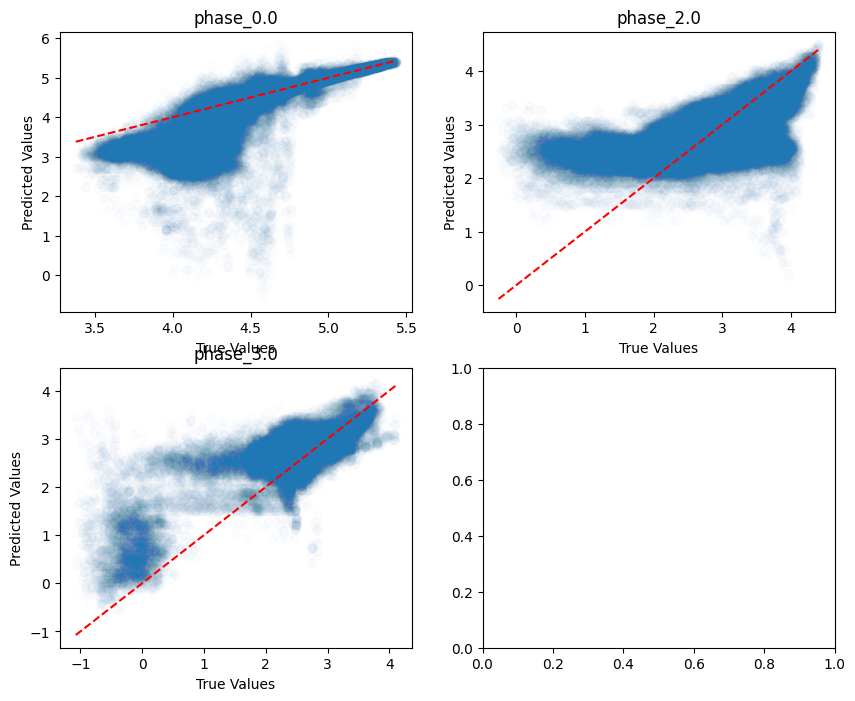

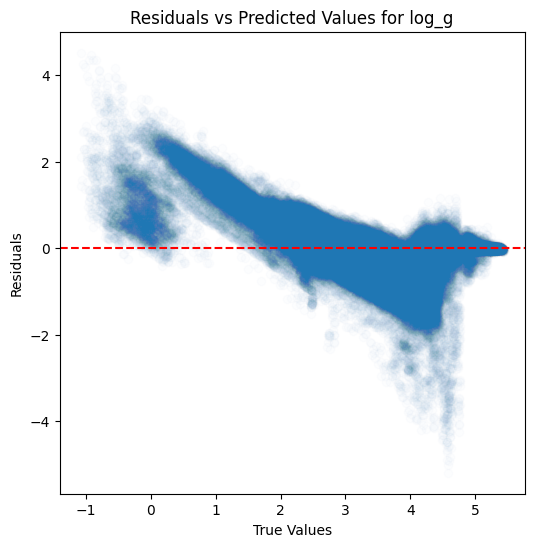

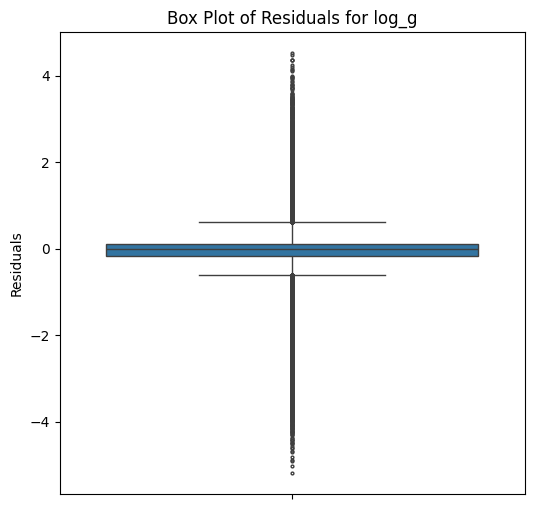

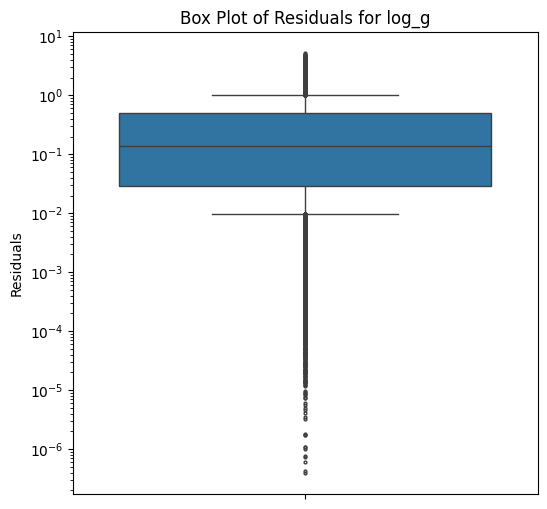

...

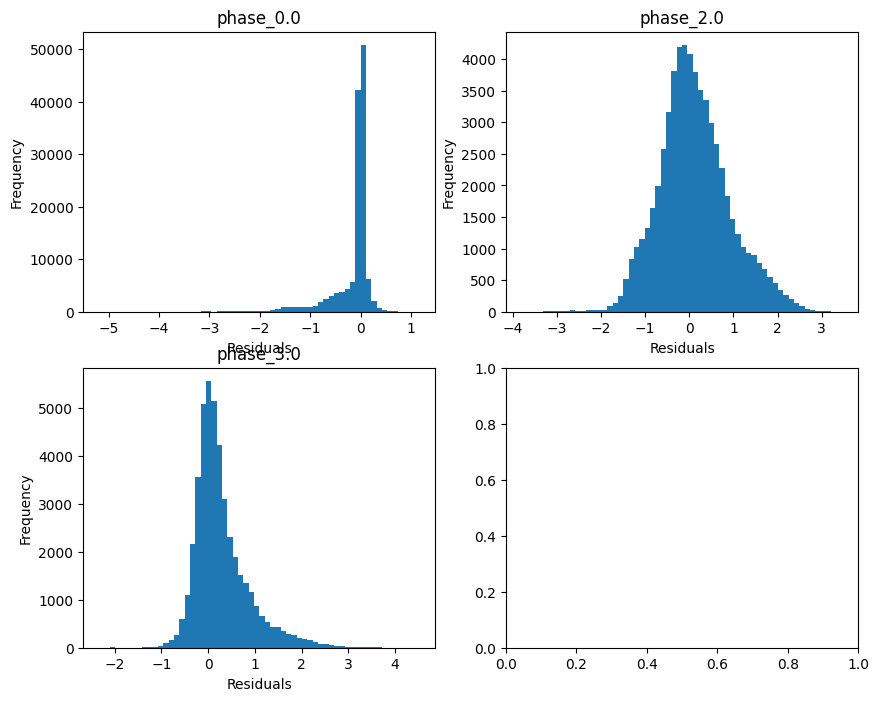

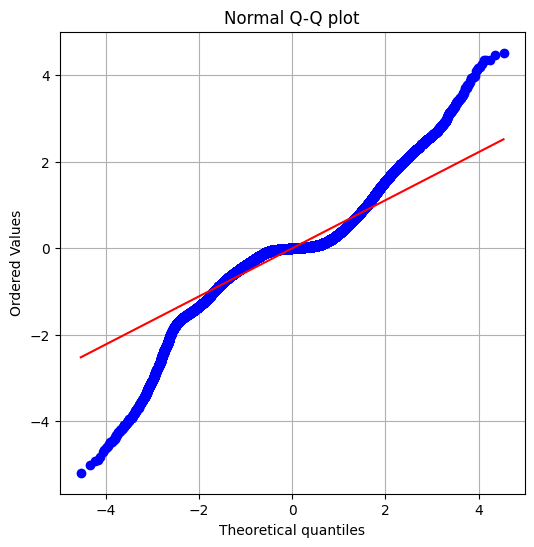

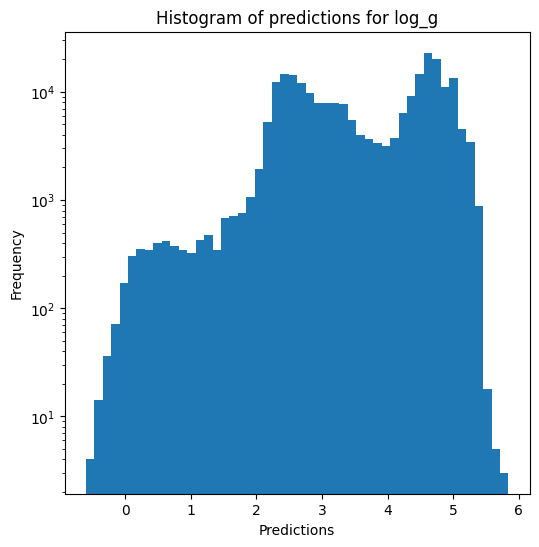

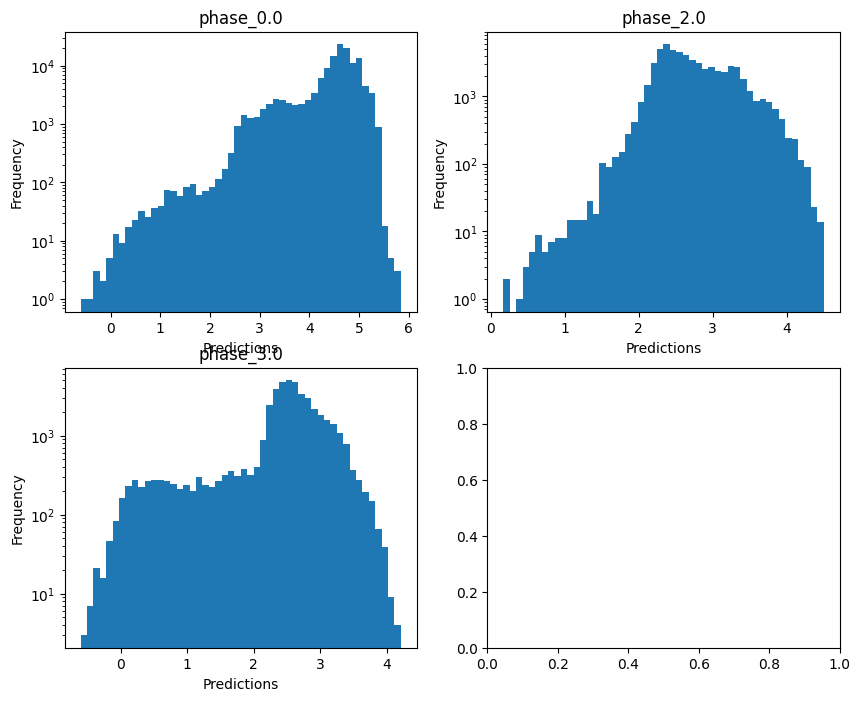

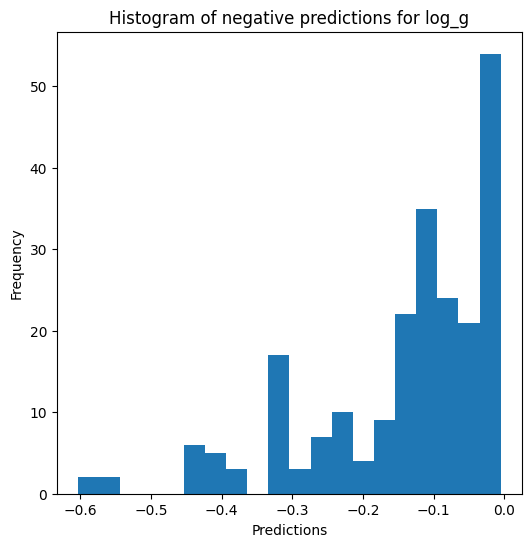


radius results for the phase category with a value of 0.0
  value range :  -0.9974747647513328 - 0.7629161677552769
  RVE :  0.5720666346088736
  RMSE :  0.22100493818157885
  MAE :  0.10070639120947691
  MedAE :  0.022152655550548517
  CORR :  0.887840588032607
  MAX_ER :  2.584856509092313
  Percentiles : 
    75th percentile :  0.08761418781660912
    90th percentile :  0.3039668876427282
    95th percentile :  0.5025774298214657
    99th percentile :  0.8568517308248481

radius results for the phase category with a value of 2.0
  value range :  0.0909920840275404 - 2.3291459066926827
  RVE :  0.23581421719283302
  RMSE :  0.4061461191675946
  MAE :  0.31207792197432666
  MedAE :  0.2427596287949334
  CORR :  0.48613388033852417
  MAX_ER :  1.9487913159740446
  Percentiles : 
    75th percentile :  0.4435351890879953
    90th percentile :  0.6815653541159881
    95th percentile :  0.8365774557213295
    99th percentile :  1.1348453183384306

radius results for the phase category wi

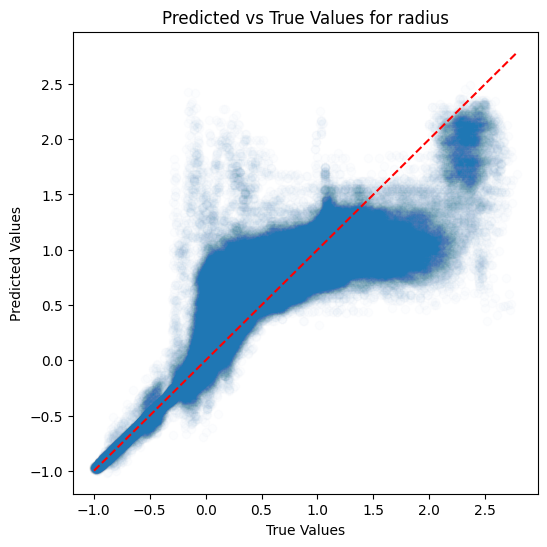

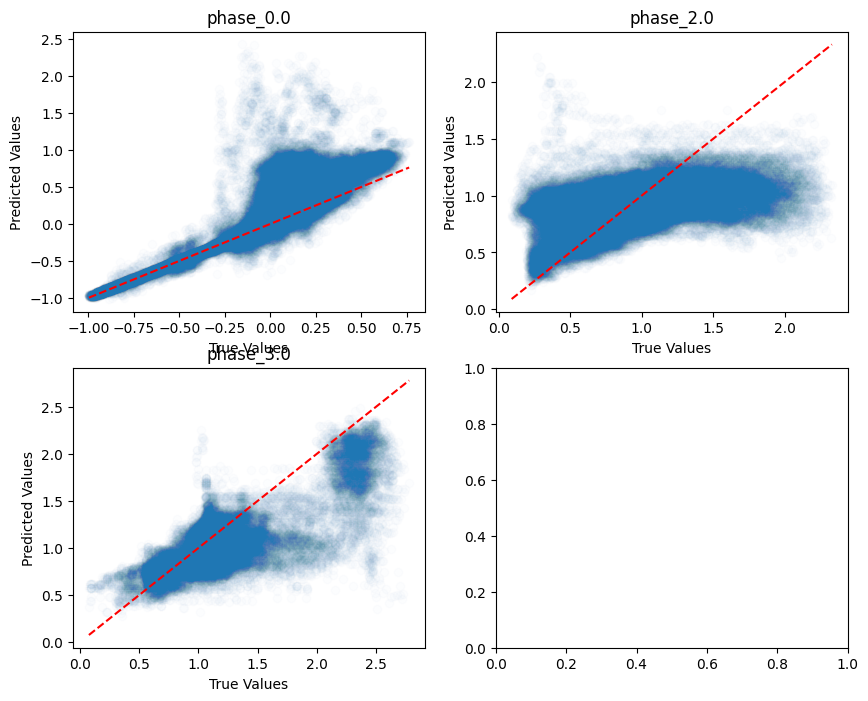

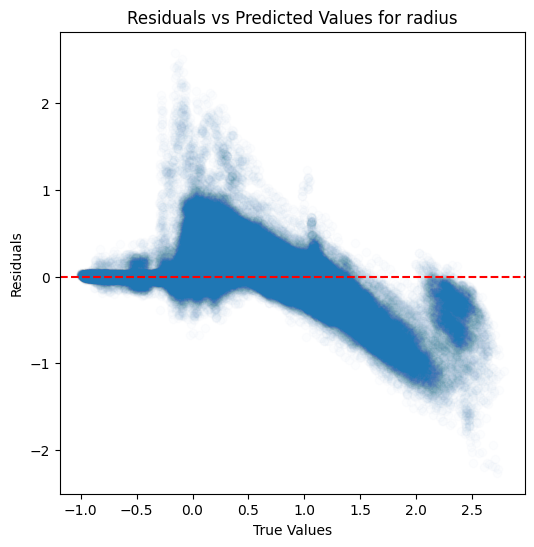

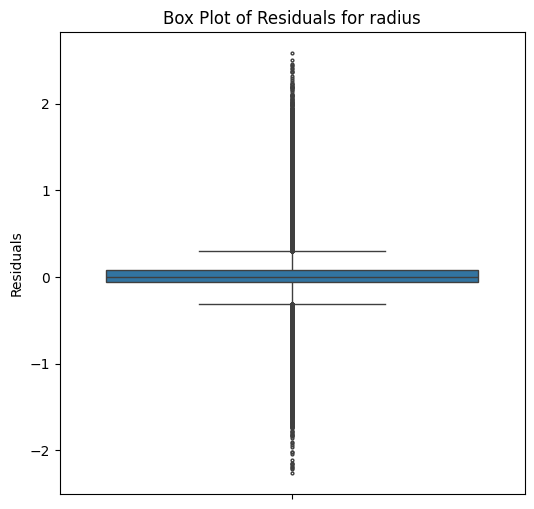

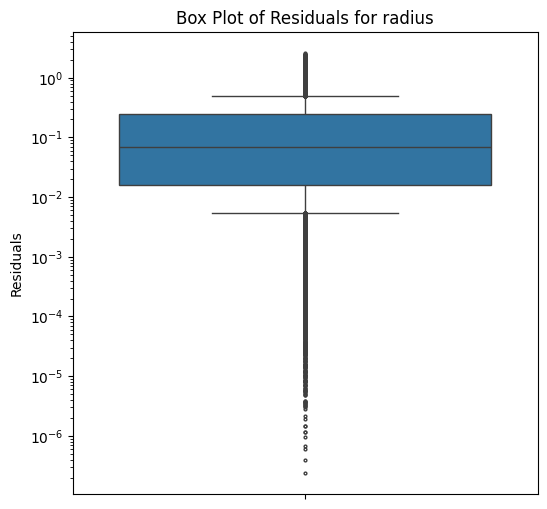

...

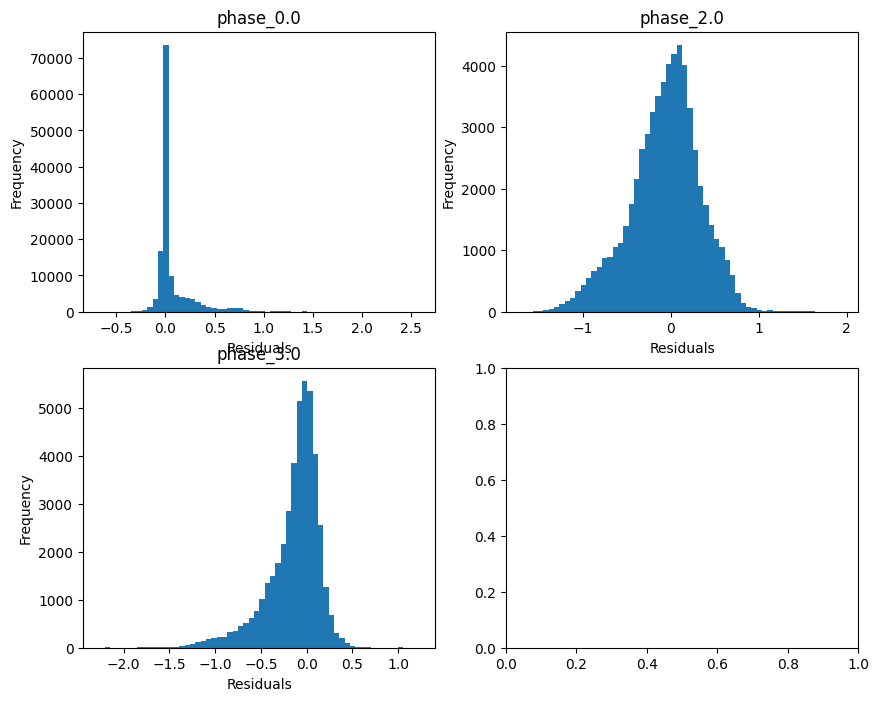

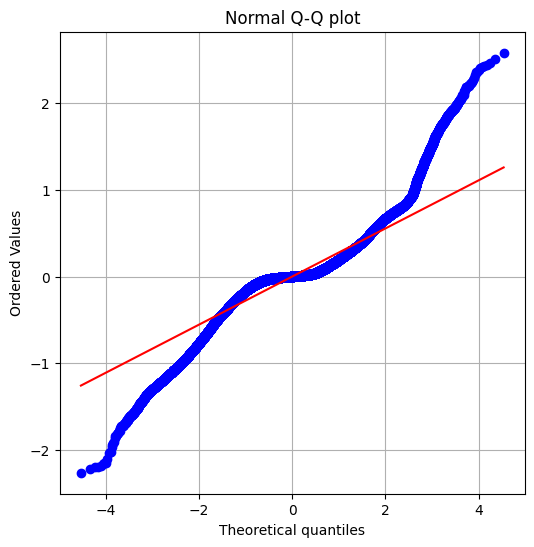

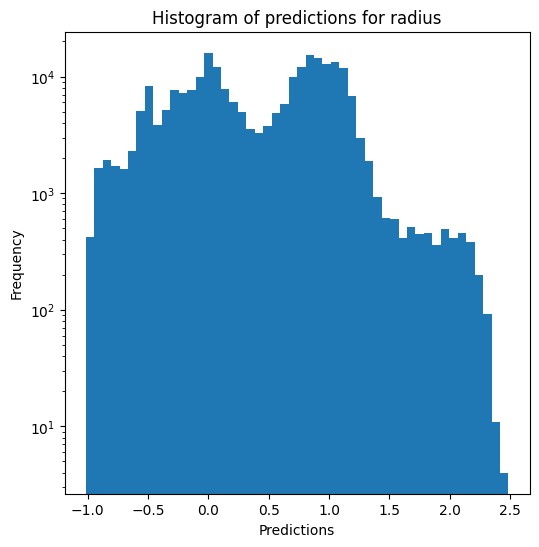

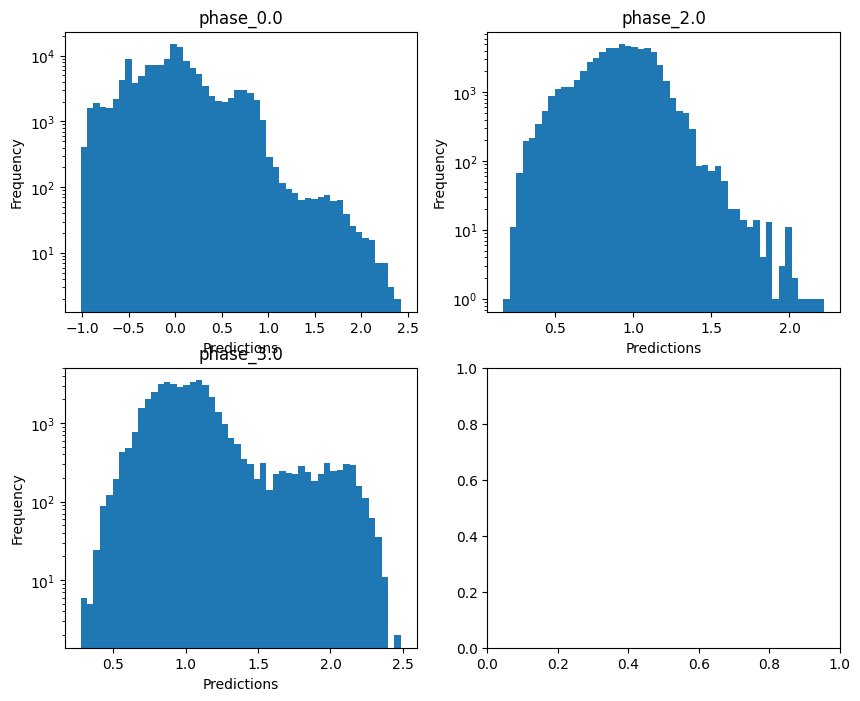

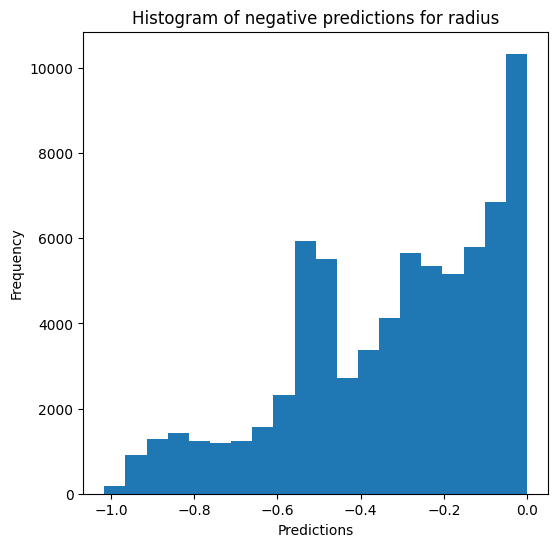

Saving predictions and results...


In [21]:
xgb_evaluator.evaluate_Kfold_results(XGBRegressor, X_train, y_train, categories_train, categories_name, path_to_predictions, tag, random_state=12, override=override, use_preds=use_preds, save=save, show=show, n_jobs=5)

### Multi-layer perceptron

In [22]:
mlp_evaluator = Model_evaluator("mlp", path=path_to_results, physical_model=physical_model, output_parameters=output_parameters)


mass_smaller_3 train data :
Performing K-fold...
Split 1 

c:\Users\antoi\Code\unif\MA2\thesis\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:781: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


0.12850729763942018
2 

c:\Users\antoi\Code\unif\MA2\thesis\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:781: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


0.13197885081905414
3 

c:\Users\antoi\Code\unif\MA2\thesis\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:781: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


0.12560472997355646
4 

c:\Users\antoi\Code\unif\MA2\thesis\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:781: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


0.12841827079082915
5 

c:\Users\antoi\Code\unif\MA2\thesis\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:781: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


0.1307239327000877

Evaluating predictions...
no negative values

T_eff results for the phase category with a value of 0.0
  value range :  3.344668191350628 - 4.301337973559223
  RVE :  0.8406767601192293
  RMSE :  0.09428458345968073
  MAE :  0.06910951643355982
  MedAE :  0.04258850384414026
  CORR :  0.9184609171011511
  MAX_ER :  0.31987833932436205
  Percentiles : 
    75th percentile :  0.11639187620563529
    90th percentile :  0.16655564907711679
    95th percentile :  0.1953476579653572
    99th percentile :  0.2435916167323966

T_eff results for the phase category with a value of 2.0
  value range :  3.431312032318489 - 4.276512878191396
  RVE :  0.532677756845845
  RMSE :  0.10020165789796813
  MAE :  0.08033220149082262
  MedAE :  0.06775064325524749
  CORR :  0.7557424966145686
  MAX_ER :  0.34467668847257515
  Percentiles : 
    75th percentile :  0.11560230468320709
    90th percentile :  0.16717422853047514
    95th percentile :  0.19788579035233345
    99th percentile

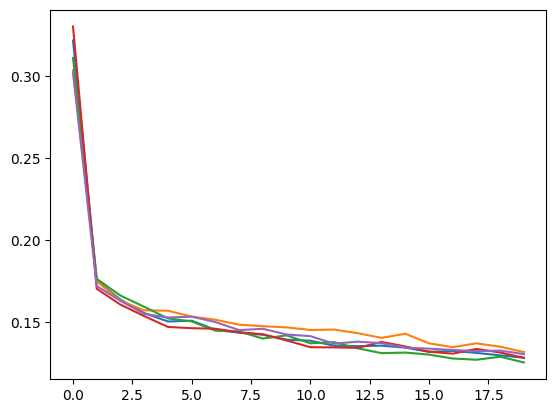

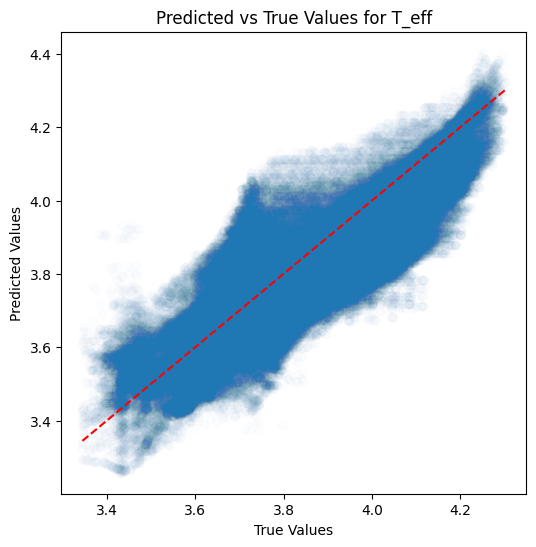

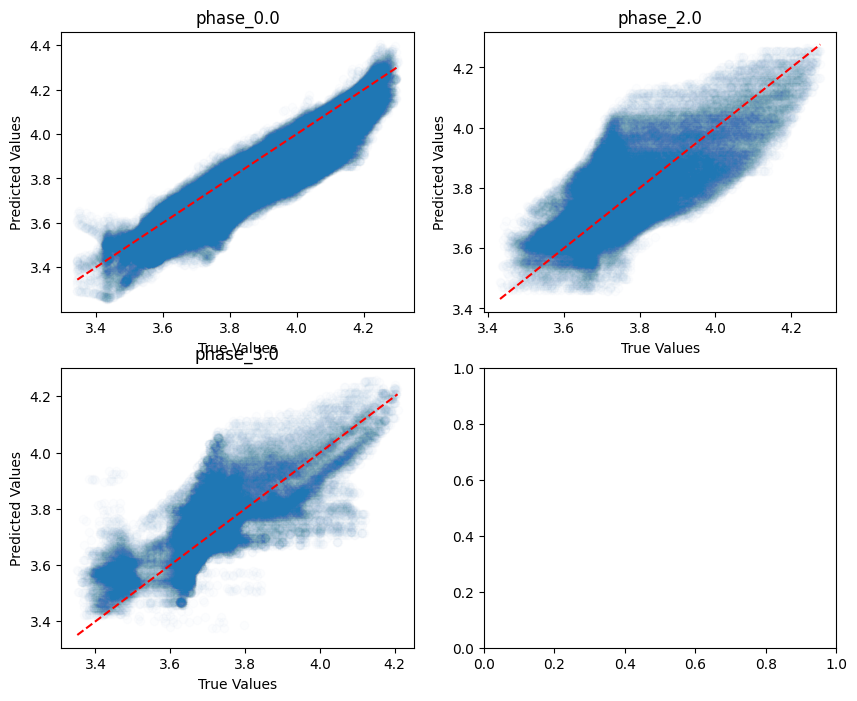

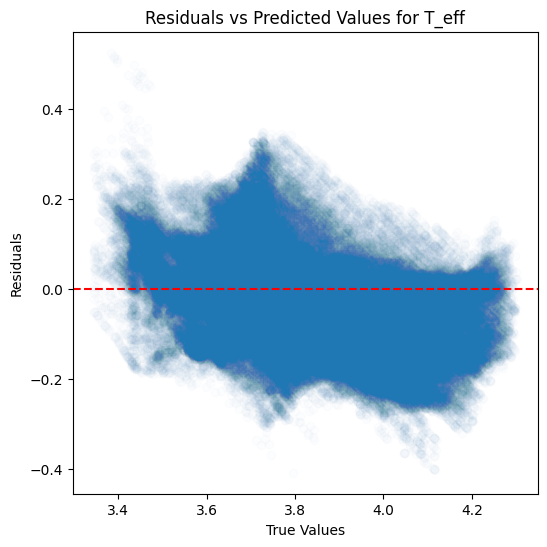

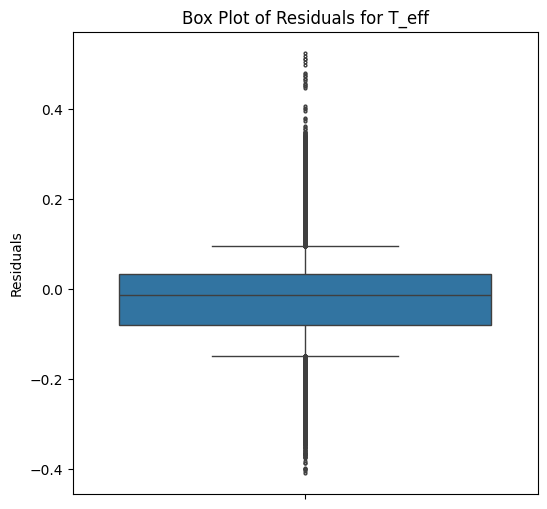

...

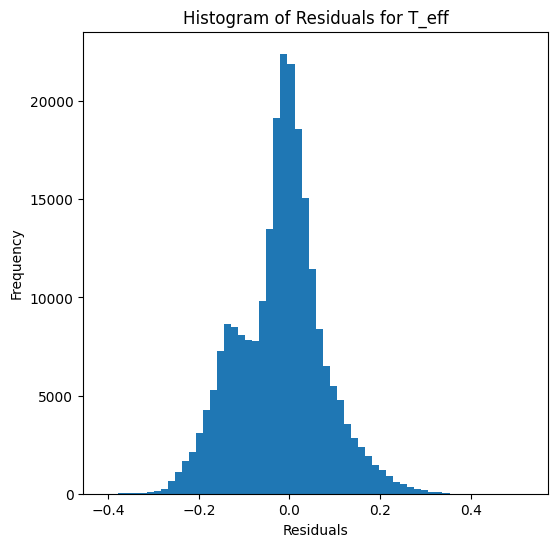

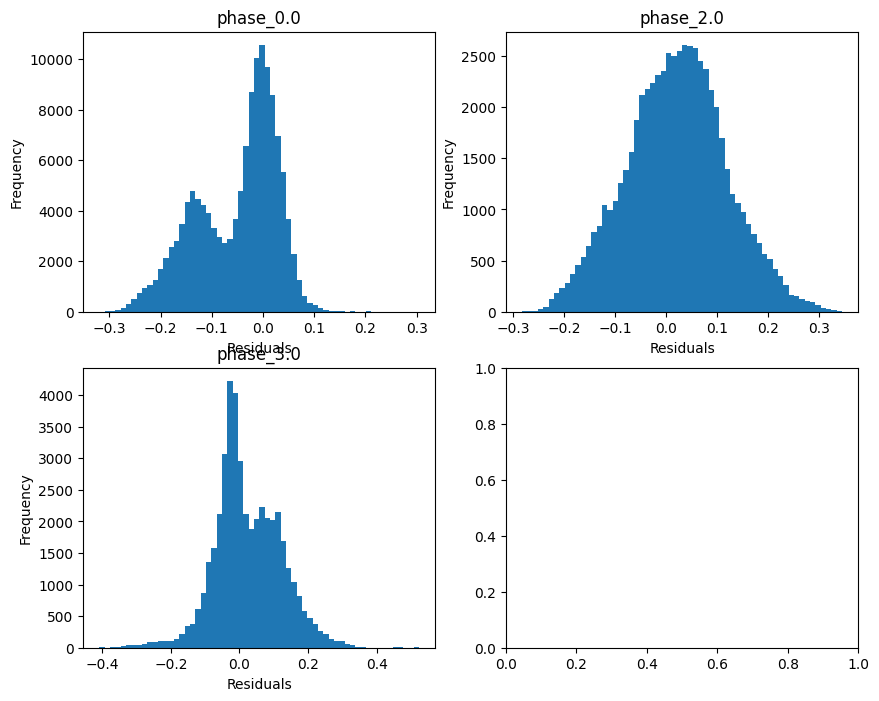

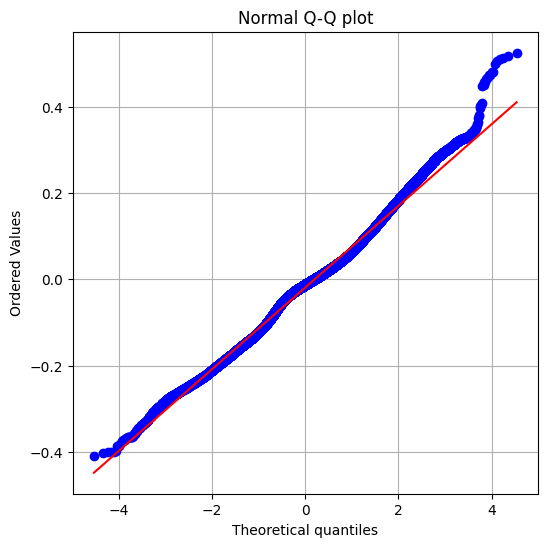

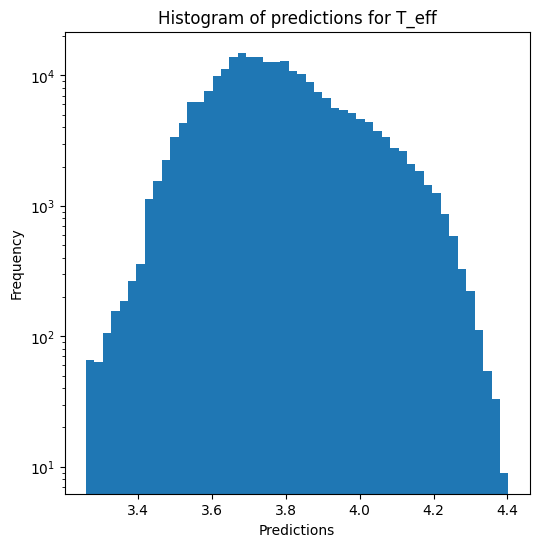

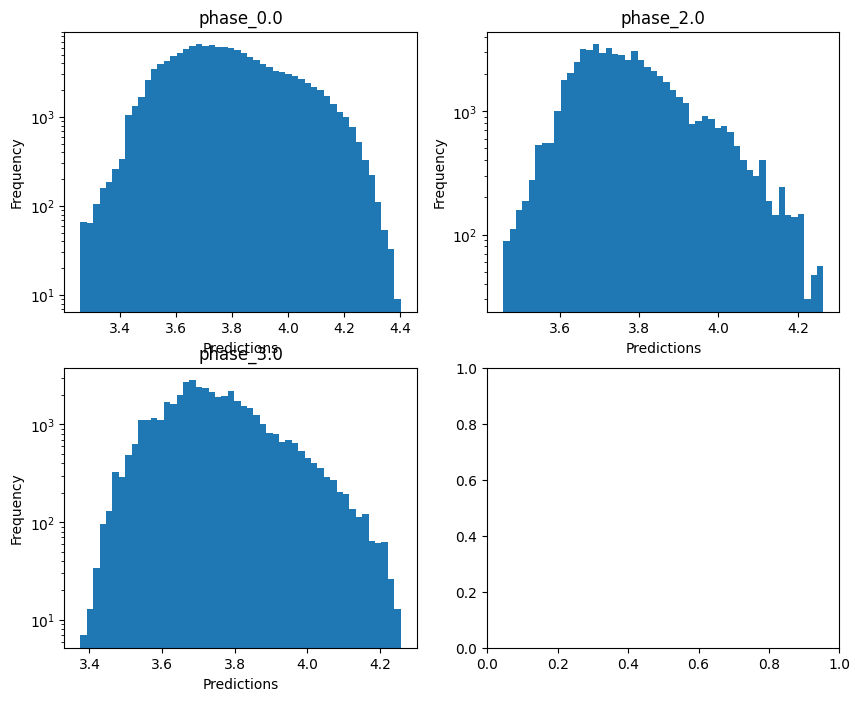

no negative values

log_g results for the phase category with a value of 0.0
  value range :  3.379753170845917 - 5.433094523832443
  RVE :  -1.6952020211239422
  RMSE :  0.6392624325965343
  MAE :  0.35123426506414723
  MedAE :  0.11843706715428626
  CORR :  0.7789827796691844
  MAX_ER :  3.177274405220592
  Percentiles : 
    75th percentile :  0.33666286416393154
    90th percentile :  1.135422597917131
    95th percentile :  1.633002062310633
    99th percentile :  2.3554803494816228

log_g results for the phase category with a value of 2.0
  value range :  -0.2597443254273661 - 4.406128730397165
  RVE :  -0.02348330102255436
  RMSE :  1.0002736776085084
  MAE :  0.7933875014305882
  MedAE :  0.6596989680084469
  CORR :  0.30576531055074774
  MAX_ER :  3.7140079941181656
  Percentiles : 
    75th percentile :  1.1460255075314678
    90th percentile :  1.674589797155706
    95th percentile :  1.98983378093055
    99th percentile :  2.5534989985767713

log_g results for the phase cat

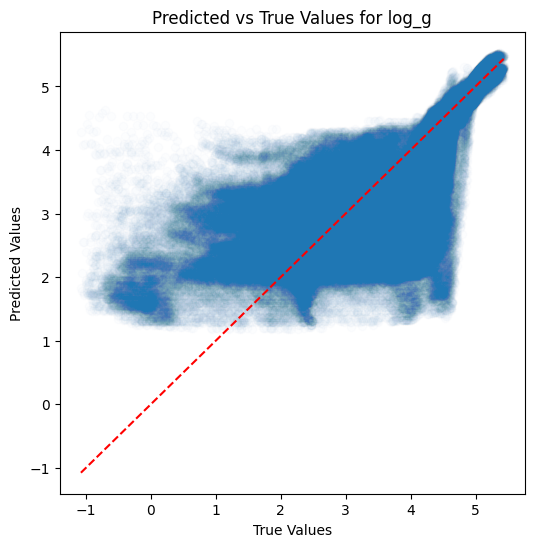

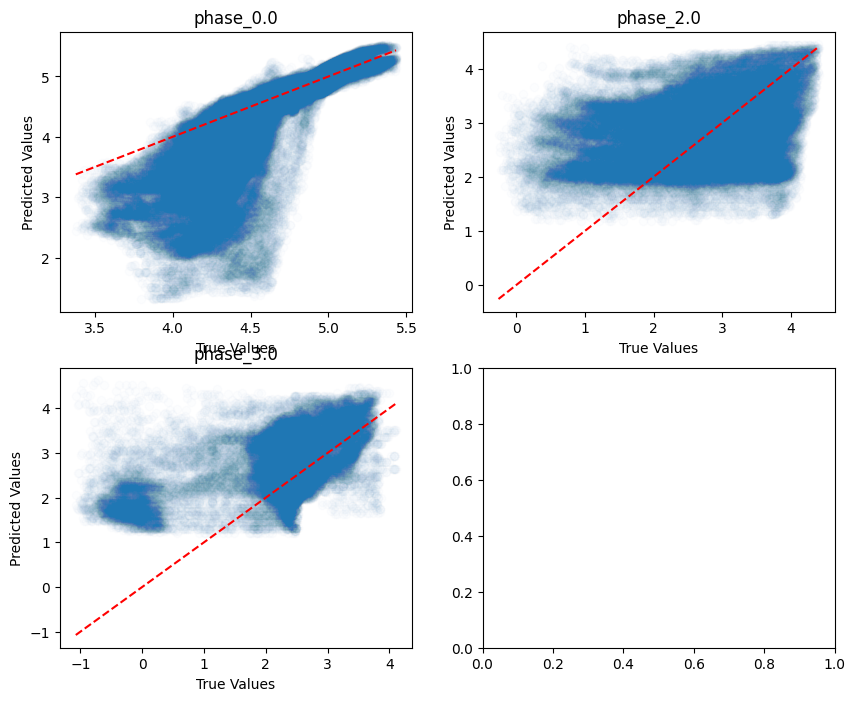

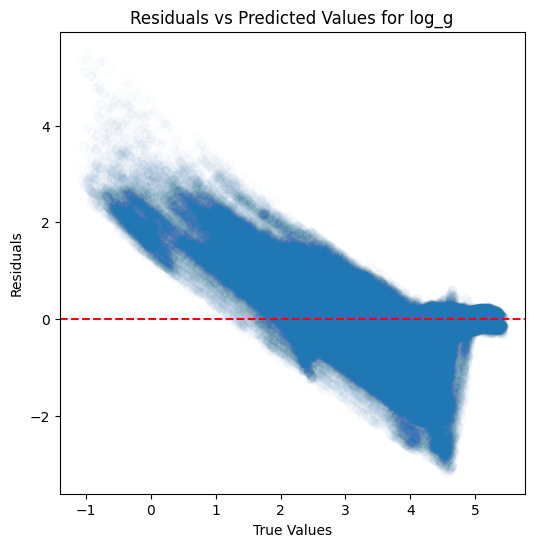

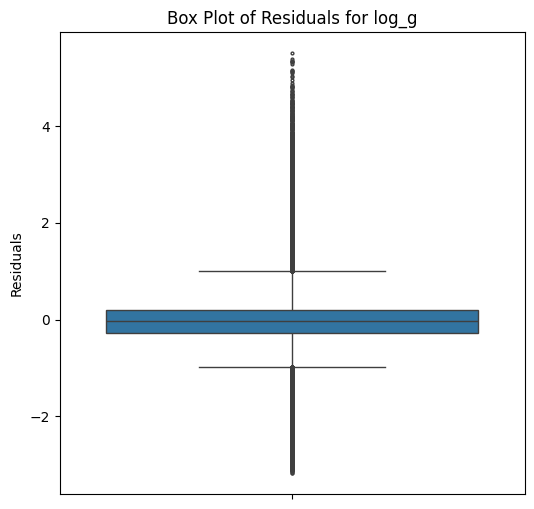

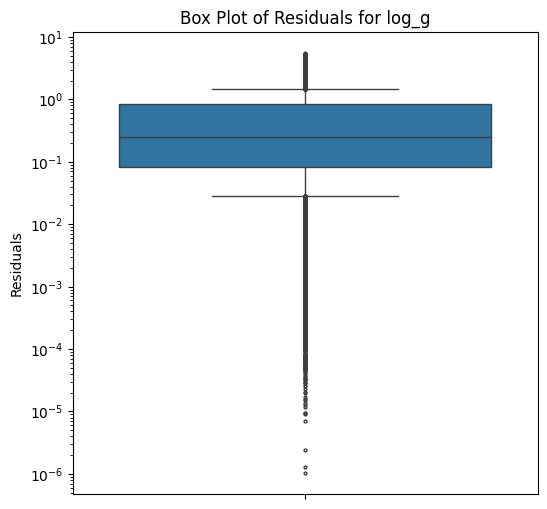

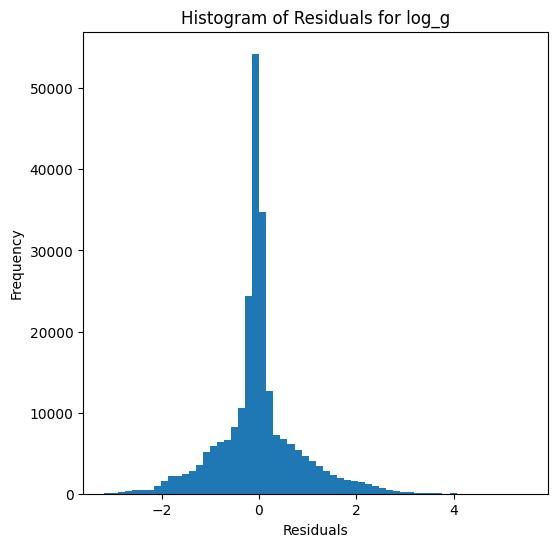

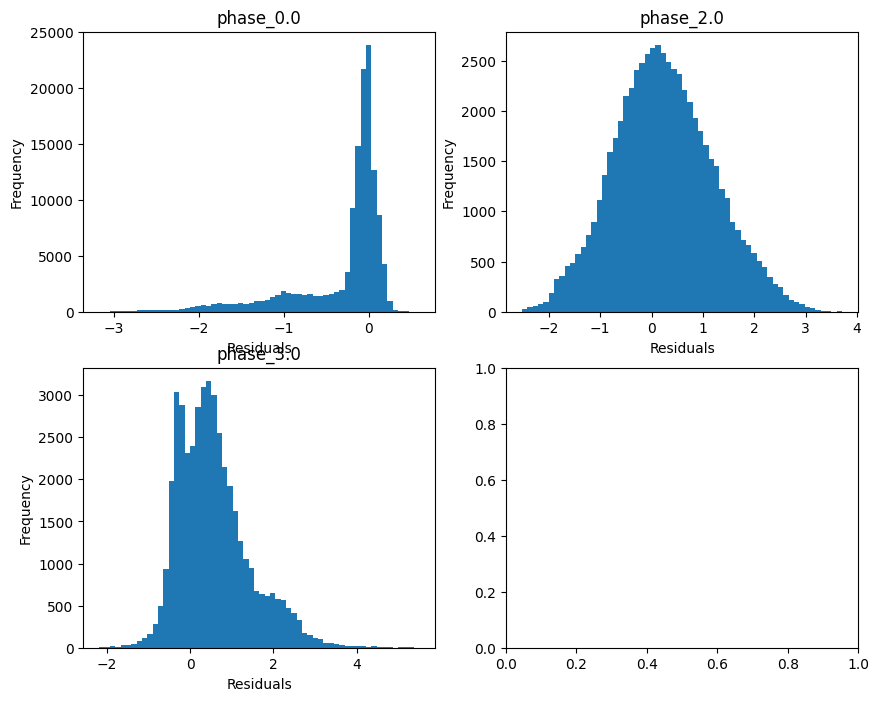

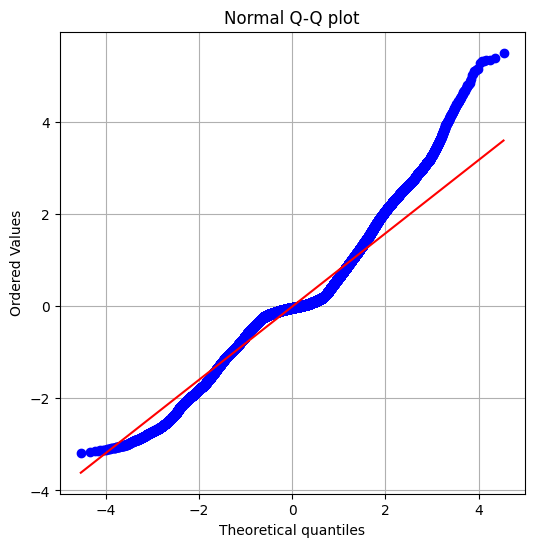

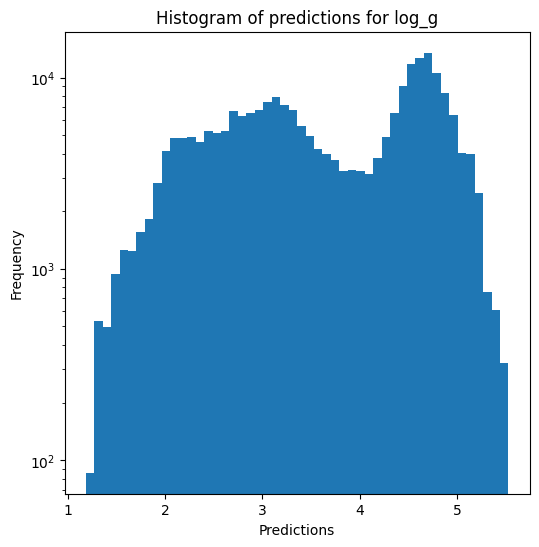

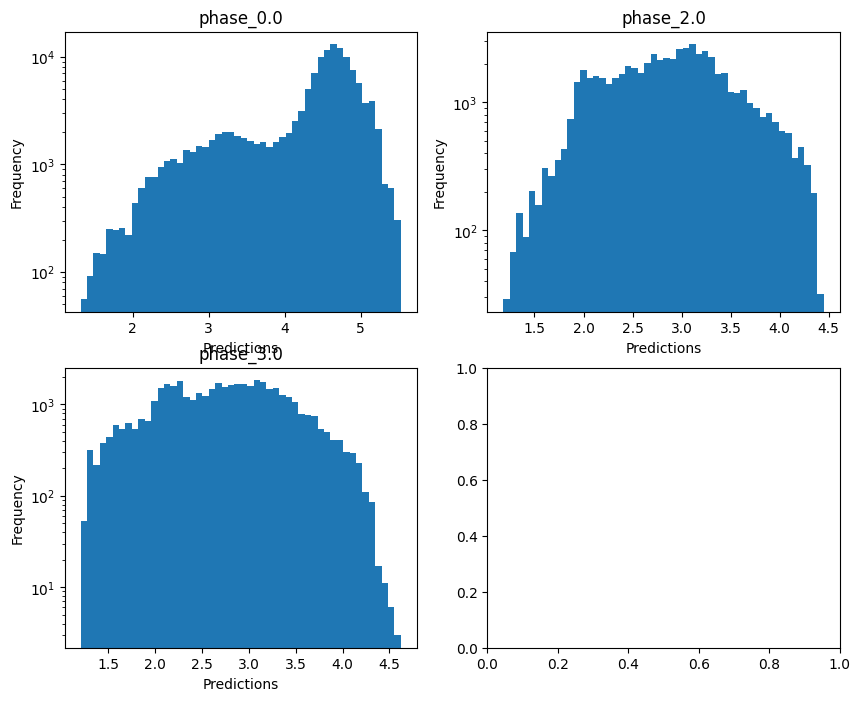


radius results for the phase category with a value of 0.0
  value range :  -0.9974747647513328 - 0.7629161677552769
  RVE :  0.19097817221195146
  RMSE :  0.3192027676406537
  MAE :  0.17088187451416237
  MedAE :  0.051208081585388254
  CORR :  0.8366833440684885
  MAX_ER :  1.6249863433449745
  Percentiles : 
    75th percentile :  0.15280129266997586
    90th percentile :  0.5684675070065107
    95th percentile :  0.8292730556576065
    99th percentile :  1.186022085064117

radius results for the phase category with a value of 2.0
  value range :  0.0909920840275404 - 2.3291459066926827
  RVE :  -0.14009440119764327
  RMSE :  0.5066894827250686
  MAE :  0.4010551523174798
  MedAE :  0.33202108931646546
  CORR :  0.21330361433506007
  MAX_ER :  1.8943268113439768
  Percentiles : 
    75th percentile :  0.5814282130152426
    90th percentile :  0.8501208619276986
    95th percentile :  1.0125841006196992
    99th percentile :  1.292995871032369

radius results for the phase category w

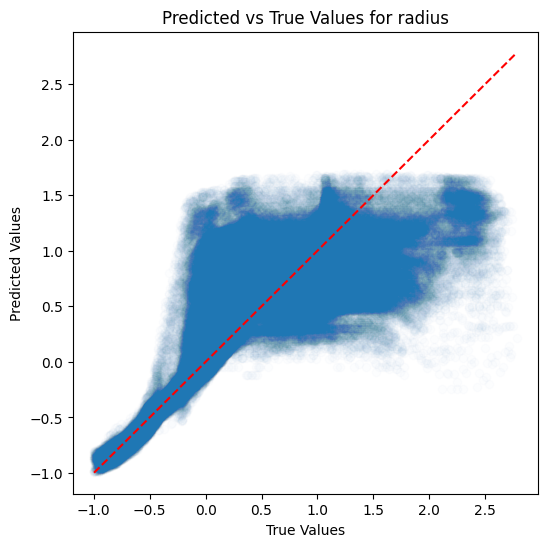

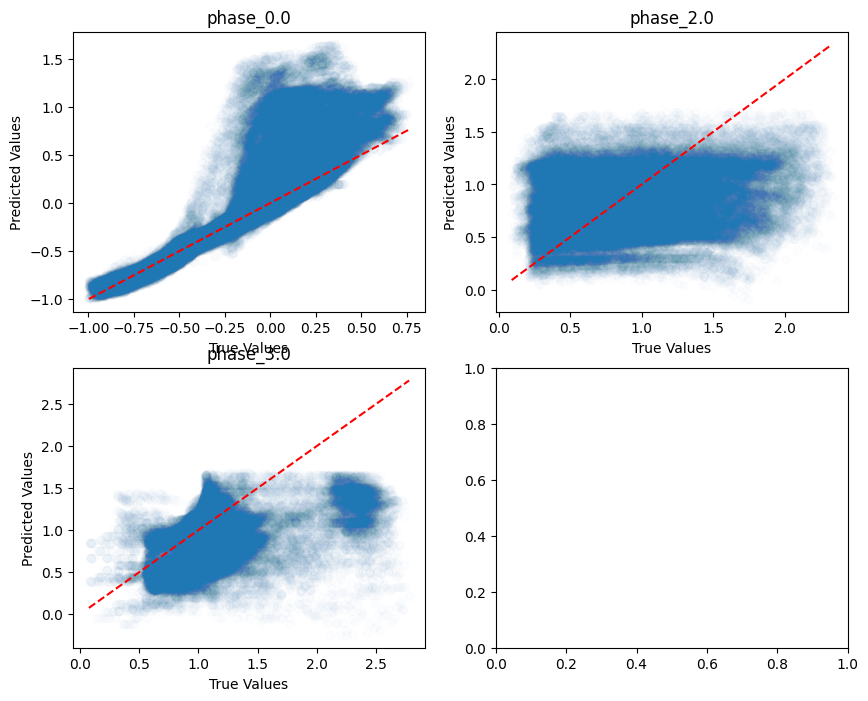

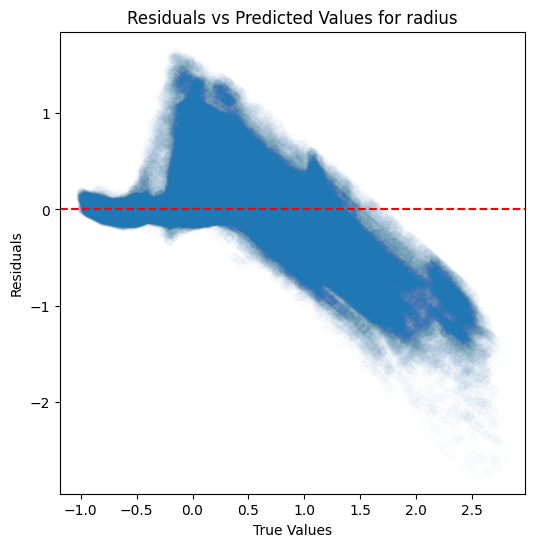

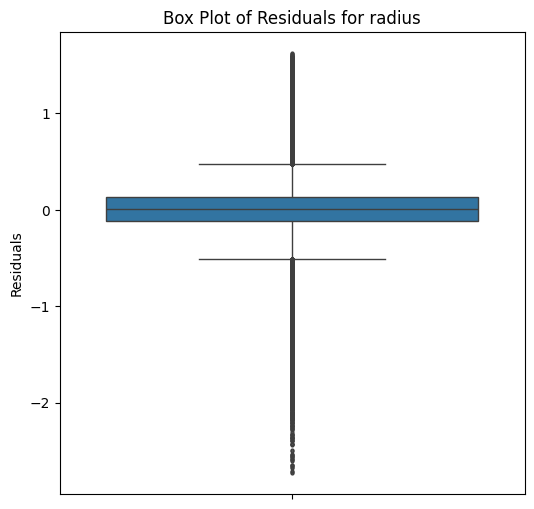

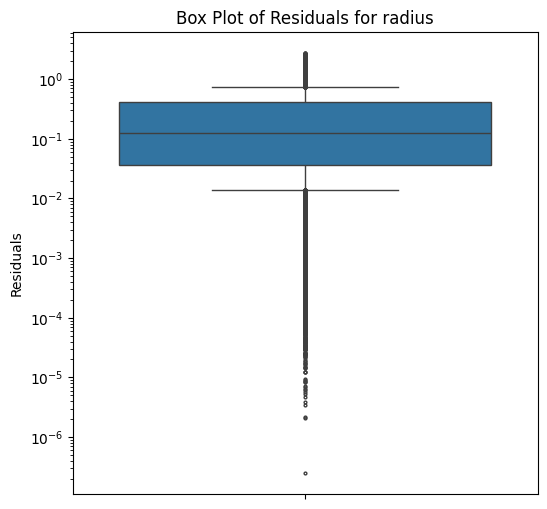

...

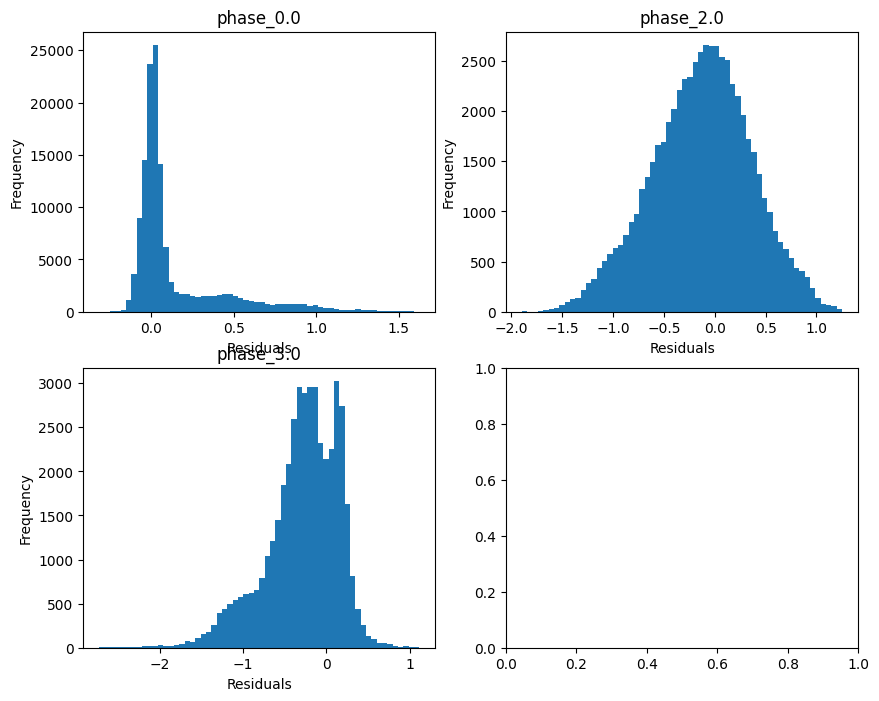

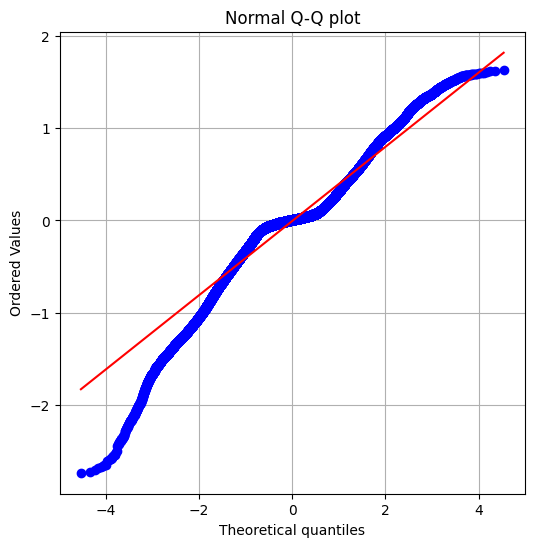

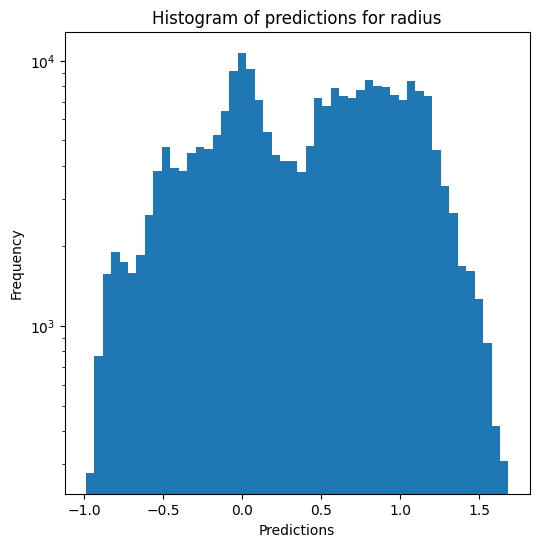

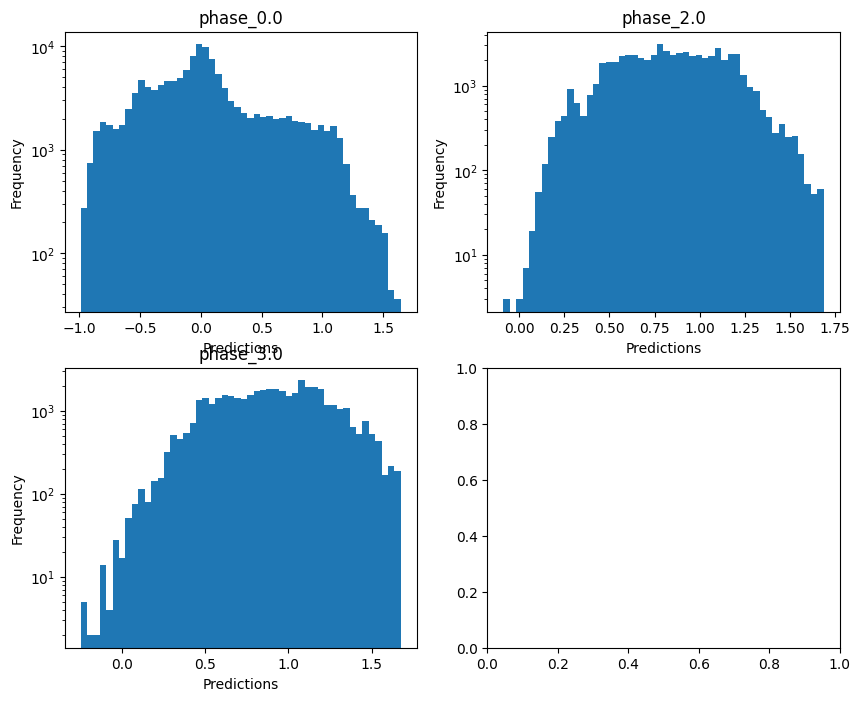

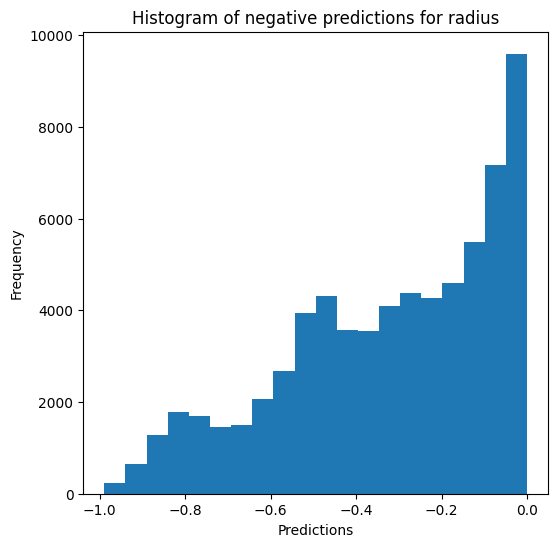

Saving predictions and results...


In [23]:
mlp_evaluator.evaluate_Kfold_results(MLPRegressor, X_train, y_train, categories_train, categories_name, path_to_predictions, tag, n_splits=5, random_state=12, override=override, use_preds=use_preds, save=save, show=show, 
                                     hidden_layer_sizes = (100, 100, 100, 100), max_iter=20, batch_size=400)